# Data processing and engeneering 

## Plot the distribution of flood_frac across the hex grid




# Sentinel-1

Loaded 4,196 hexes from hex_h3_res9_with_s1.gpkg
All hexes:      n=4,196
Non-zero hexes: n=710 (16.9%)

Full distribution (all hexes):
  mean:    0.00294
  median:  0.00000
  sd:      0.01321
  skew:    9.70
  kurt:    139.42

Step A distribution (non-zero hexes only):
  mean:    0.01738
  median:  0.00755
  sd:      0.02793
  min:     0.00000
  p25:     0.00216
  p75:     0.02154
  p95:     0.06445
  max:     0.28690
  skew:    4.38
  kurt:    28.37

Saved: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/s1_flood_frac_distribution.png


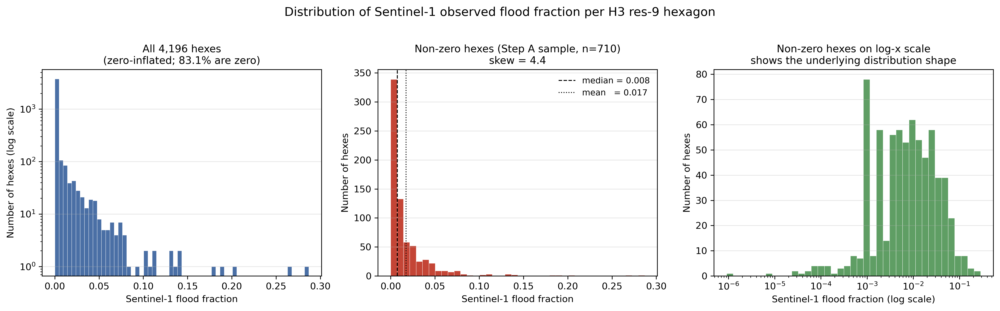

In [77]:
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy import stats

# Inouts
BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
HEX_PATH = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_s1.gpkg")
OUT_PNG  = BASE/("s1_flood_frac_distribution.png")

# Load
gdf = gpd.read_file(HEX_PATH)
y = gdf["s1_flood_frac"].dropna().values
y_nonzero = y[y > 0]

print(f"Loaded {len(gdf):,} hexes from {HEX_PATH.name}")
print(f"All hexes:      n={len(y):,}")
print(f"Non-zero hexes: n={len(y_nonzero):,} "
      f"({100 * len(y_nonzero) / len(y):.1f}%)")
print()
print("Full distribution (all hexes):")
print(f"  mean:    {y.mean():.5f}")
print(f"  median:  {np.median(y):.5f}")
print(f"  sd:      {y.std():.5f}")
print(f"  skew:    {stats.skew(y):.2f}")
print(f"  kurt:    {stats.kurtosis(y):.2f}")
print()
print("Step A distribution (non-zero hexes only):")
print(f"  mean:    {y_nonzero.mean():.5f}")
print(f"  median:  {np.median(y_nonzero):.5f}")
print(f"  sd:      {y_nonzero.std():.5f}")
print(f"  min:     {y_nonzero.min():.5f}")
print(f"  p25:     {np.quantile(y_nonzero, 0.25):.5f}")
print(f"  p75:     {np.quantile(y_nonzero, 0.75):.5f}")
print(f"  p95:     {np.quantile(y_nonzero, 0.95):.5f}")
print(f"  max:     {y_nonzero.max():.5f}")
print(f"  skew:    {stats.skew(y_nonzero):.2f}")
print(f"  kurt:    {stats.kurtosis(y_nonzero):.2f}")

# Plots
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), dpi=150)

# Panel 1: All hexes. Uses a log y-axis because the zero bin dominates.
ax = axes[0]
ax.hist(y, bins=60, color="#4A6FA5", edgecolor="white", linewidth=0.3)
ax.set_yscale("log")
ax.set_xlabel("Sentinel-1 flood fraction")
ax.set_ylabel("Number of hexes (log scale)")
ax.set_title(f"All {len(y):,} hexes\n"
             f"(zero-inflated; {100 * (y == 0).mean():.1f}% are zero)",
             fontsize=11)
ax.grid(alpha=0.3, axis="y")

# Panel 2: Non-zero only, linear scale. This is the Step A analytical sample.
ax = axes[1]
ax.hist(y_nonzero, bins=40, color="#C44536", edgecolor="white", linewidth=0.3)
ax.axvline(np.median(y_nonzero), color="black", ls="--", lw=1,
           label=f"median = {np.median(y_nonzero):.3f}")
ax.axvline(y_nonzero.mean(), color="black", ls=":", lw=1,
           label=f"mean   = {y_nonzero.mean():.3f}")
ax.set_xlabel("Sentinel-1 flood fraction")
ax.set_ylabel("Number of hexes")
ax.set_title(f"Non-zero hexes (Step A sample, n={len(y_nonzero):,})\n"
             f"skew = {stats.skew(y_nonzero):.1f}",
             fontsize=11)
ax.legend(fontsize=9, frameon=False)
ax.grid(alpha=0.3, axis="y")

# Panel 3: Non-zero only, log-x. Reveals the shape hidden by right-skew.
ax = axes[2]
ax.hist(y_nonzero, bins=np.logspace(np.log10(y_nonzero.min()),
                                     np.log10(y_nonzero.max()), 40),
        color="#5F9E64", edgecolor="white", linewidth=0.3)
ax.set_xscale("log")
ax.set_xlabel("Sentinel-1 flood fraction (log scale)")
ax.set_ylabel("Number of hexes")
ax.set_title(f"Non-zero hexes on log-x scale\n"
             f"shows the underlying distribution shape",
             fontsize=11)
ax.grid(alpha=0.3, axis="y", which="both")

fig.suptitle("Distribution of Sentinel-1 observed flood fraction per H3 res-9 hexagon",
             fontsize=13, y=1.02)

plt.tight_layout()
plt.savefig(OUT_PNG, dpi=200, bbox_inches="tight")
print(f"\nSaved: {OUT_PNG}")
plt.show()

# log1p-transform s1_flood_frac across ALL hexes

All hexes:              4,196
  exactly zero:         3,486 (83.1%)  (stay 0 after log1p)

              raw        log1p
  mean       0.00294    0.00286
  median     0.00000    0.00000
  sd         0.01321    0.01243
  min        0.00000    0.00000
  p95        0.01727    0.01713
  max        0.28690    0.25224
  skew          9.70       8.92
  kurtosis    139.42     116.38

Shapiro-Wilk on log1p (all cells): W=0.239, p=5.087e-85
  (expected to reject: the zero spike is still ~85% of the mass)

Saved plot: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/log1p_s1_distribution.png
Saved all 4,196 hexes with 'log1p_s1_flood_frac': /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_s1_log1p.gpkg


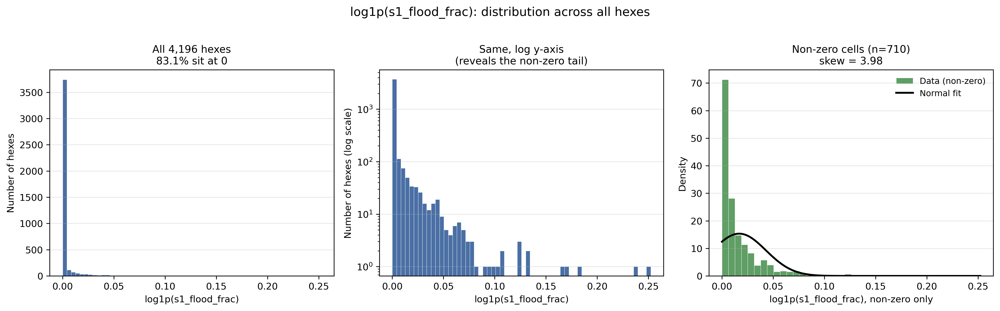

In [78]:
from pathlib import Path
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import norm

# Iputs
BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
HEX_PATH = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_s1.gpkg")

COL = "s1_flood_frac"
NEW = "log1p_s1_flood_frac"
OUT = BASE/("hex_h3_res9_s1_log1p.gpkg")
OUT_PNG = BASE/("log1p_s1_distribution.png")

gdf = gpd.read_file(HEX_PATH)
if COL not in gdf.columns:
    raise KeyError(f"'{COL}' not in {HEX_PATH.name}. Columns: {list(gdf.columns)}")

# Trasform  (all hexes)
gdf[NEW] = np.log1p(gdf[COL])       # log(1 + x), zero-safe

raw = gdf[COL].dropna().values
v = gdf[NEW].dropna().values
n_all = len(v)
n_zero = int((gdf[COL] == 0).sum())

# How it is distributed
print(f"All hexes:              {n_all:,}")
print(f"  exactly zero:         {n_zero:,} ({100*n_zero/n_all:.1f}%)  (stay 0 after log1p)")
print("\n              raw        log1p")
print(f"  mean     {raw.mean():9.5f}  {v.mean():9.5f}")
print(f"  median   {np.median(raw):9.5f}  {np.median(v):9.5f}")
print(f"  sd       {raw.std():9.5f}  {v.std():9.5f}")
print(f"  min      {raw.min():9.5f}  {v.min():9.5f}")
print(f"  p95      {np.quantile(raw,0.95):9.5f}  {np.quantile(v,0.95):9.5f}")
print(f"  max      {raw.max():9.5f}  {v.max():9.5f}")
print(f"  skew     {stats.skew(raw):9.2f}  {stats.skew(v):9.2f}")
print(f"  kurtosis {stats.kurtosis(raw):9.2f}  {stats.kurtosis(v):9.2f}")

if 3 <= n_all <= 5000:
    W, p = stats.shapiro(v)
    print(f"\nShapiro-Wilk on log1p (all cells): W={W:.3f}, p={p:.4g}")
    print("  (expected to reject: the zero spike is still ~85% of the mass)")

# Plots
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), dpi=150)

# Panel 1: All cells, linear count. The zero bar dominates - this is the point.
ax = axes[0]
ax.hist(v, bins=60, color="#4A6FA5", edgecolor="white", linewidth=0.3)
ax.set_xlabel("log1p(s1_flood_frac)")
ax.set_ylabel("Number of hexes")
ax.set_title(f"All {n_all:,} hexes\n{100*n_zero/n_all:.1f}% sit at 0", fontsize=11)
ax.grid(alpha=0.3, axis="y")

# Panel 2: All cells, log y-axis, so the small non-zero mass is visible too.
ax = axes[1]
ax.hist(v, bins=60, color="#4A6FA5", edgecolor="white", linewidth=0.3)
ax.set_yscale("log")
ax.set_xlabel("log1p(s1_flood_frac)")
ax.set_ylabel("Number of hexes (log scale)")
ax.set_title("Same, log y-axis\n(reveals the non-zero tail)", fontsize=11)
ax.grid(alpha=0.3, axis="y")

# Panel 3: Non-zero cells only, density, with a normal fit for reference.
nz = v[v > 0]
ax = axes[2]
ax.hist(nz, bins=40, density=True, color="#5F9E64", edgecolor="white",
        linewidth=0.3, label="Data (non-zero)")
mu, sd = norm.fit(nz)
xs = np.linspace(nz.min(), nz.max(), 200)
ax.plot(xs, norm.pdf(xs, mu, sd), "k", lw=2, label="Normal fit")
ax.set_xlabel("log1p(s1_flood_frac), non-zero only")
ax.set_ylabel("Density")
ax.set_title(f"Non-zero cells (n={len(nz):,})\nskew = {stats.skew(nz):.2f}",
             fontsize=11)
ax.legend(fontsize=9, frameon=False)
ax.grid(alpha=0.3, axis="y")

fig.suptitle("log1p(s1_flood_frac): distribution across all hexes",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(OUT_PNG, dpi=200, bbox_inches="tight")
print(f"\nSaved plot: {OUT_PNG}")

gdf.to_file(OUT, driver="GPKG")
print(f"Saved all {n_all:,} hexes with '{NEW}': {OUT}")
plt.show()

# SEPA

Loaded 4,201 hexes from hex_h3_res9_with_sepa_eligible.gpkg
All hexes:      n=4,201
Non-zero hexes: n=3,313 (78.9%)

Full distribution (all hexes):
  mean:    0.03210
  median:  0.00890
  sd:      0.07230
  skew:    5.50
  kurt:    42.38

Step A distribution (non-zero hexes only):
  mean:    0.04071
  median:  0.01535
  sd:      0.07924
  min:     0.00000
  p25:     0.00477
  p75:     0.04012
  p95:     0.16413
  max:     0.99451
  skew:    4.99
  kurt:    34.65

Saved: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/sepa_flood_frac_distribution.png


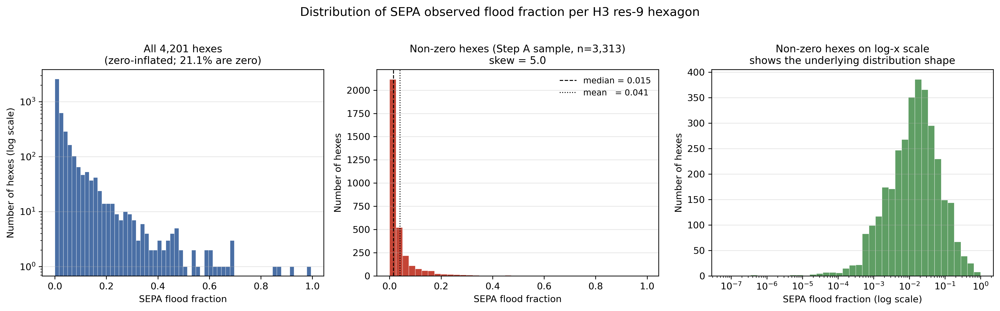

In [10]:
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy import stats

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
HEX_PATH = BASE/("hex_h3_res9_with_sepa_eligible.gpkg")
OUT_PNG  = BASE/("sepa_flood_frac_distribution.png")

# Load
gdf = gpd.read_file(HEX_PATH)
y = gdf["sepa_flood_frac"].dropna().values
y_nonzero = y[y > 0]

print(f"Loaded {len(gdf):,} hexes from {HEX_PATH.name}")
print(f"All hexes:      n={len(y):,}")
print(f"Non-zero hexes: n={len(y_nonzero):,} "
      f"({100 * len(y_nonzero) / len(y):.1f}%)")
print()
print("Full distribution (all hexes):")
print(f"  mean:    {y.mean():.5f}")
print(f"  median:  {np.median(y):.5f}")
print(f"  sd:      {y.std():.5f}")
print(f"  skew:    {stats.skew(y):.2f}")
print(f"  kurt:    {stats.kurtosis(y):.2f}")
print()
print("Step A distribution (non-zero hexes only):")
print(f"  mean:    {y_nonzero.mean():.5f}")
print(f"  median:  {np.median(y_nonzero):.5f}")
print(f"  sd:      {y_nonzero.std():.5f}")
print(f"  min:     {y_nonzero.min():.5f}")
print(f"  p25:     {np.quantile(y_nonzero, 0.25):.5f}")
print(f"  p75:     {np.quantile(y_nonzero, 0.75):.5f}")
print(f"  p95:     {np.quantile(y_nonzero, 0.95):.5f}")
print(f"  max:     {y_nonzero.max():.5f}")
print(f"  skew:    {stats.skew(y_nonzero):.2f}")
print(f"  kurt:    {stats.kurtosis(y_nonzero):.2f}")

#Plots
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), dpi=150)

# Panel 1: All hexes. Uses a log y-axis because the zero bin dominates.
ax = axes[0]
ax.hist(y, bins=60, color="#4A6FA5", edgecolor="white", linewidth=0.3)
ax.set_yscale("log")
ax.set_xlabel("SEPA flood fraction")
ax.set_ylabel("Number of hexes (log scale)")
ax.set_title(f"All {len(y):,} hexes\n"
             f"(zero-inflated; {100 * (y == 0).mean():.1f}% are zero)",
             fontsize=11)
ax.grid(alpha=0.3, axis="y")

# Panel 2: Non-zero only, linear scale. This is the Step A analytical sample.
ax = axes[1]
ax.hist(y_nonzero, bins=40, color="#C44536", edgecolor="white", linewidth=0.3)
ax.axvline(np.median(y_nonzero), color="black", ls="--", lw=1,
           label=f"median = {np.median(y_nonzero):.3f}")
ax.axvline(y_nonzero.mean(), color="black", ls=":", lw=1,
           label=f"mean   = {y_nonzero.mean():.3f}")
ax.set_xlabel("SEPA flood fraction")
ax.set_ylabel("Number of hexes")
ax.set_title(f"Non-zero hexes (Step A sample, n={len(y_nonzero):,})\n"
             f"skew = {stats.skew(y_nonzero):.1f}",
             fontsize=11)
ax.legend(fontsize=9, frameon=False)
ax.grid(alpha=0.3, axis="y")

# Panel 3: Non-zero only, log-x. Reveals the shape hidden by right-skew.
ax = axes[2]
ax.hist(y_nonzero, bins=np.logspace(np.log10(y_nonzero.min()),
                                     np.log10(y_nonzero.max()), 40),
        color="#5F9E64", edgecolor="white", linewidth=0.3)
ax.set_xscale("log")
ax.set_xlabel("SEPA flood fraction (log scale)")
ax.set_ylabel("Number of hexes")
ax.set_title(f"Non-zero hexes on log-x scale\n"
             f"shows the underlying distribution shape",
             fontsize=11)
ax.grid(alpha=0.3, axis="y", which="both")

fig.suptitle("Distribution of SEPA observed flood fraction per H3 res-9 hexagon",
             fontsize=13, y=1.02)

plt.tight_layout()
plt.savefig(OUT_PNG, dpi=200, bbox_inches="tight")
print(f"\nSaved: {OUT_PNG}")
plt.show()

# log1p-transform sepa_flood_frac across ALL hexes

All hexes:              4,201
  exactly zero:         888 (21.1%)  (stay 0 after log1p)

              raw        log1p
  mean       0.03210    0.02960
  median     0.00890    0.00886
  sd         0.07230    0.06037
  min        0.00000    0.00000
  p95        0.14607    0.13634
  max        0.99451    0.69040
  skew          5.50       4.51
  kurtosis     42.38      27.51

Shapiro-Wilk on log1p (all cells): W=0.507, p=1.003e-75
  (expected to reject: the zero spike is still ~85% of the mass)

Saved plot: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/log1p_sepa_distribution.png
Saved all 4,201 hexes with 'log1p_sepa_flood_frac': /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_sepa_log1p.gpkg


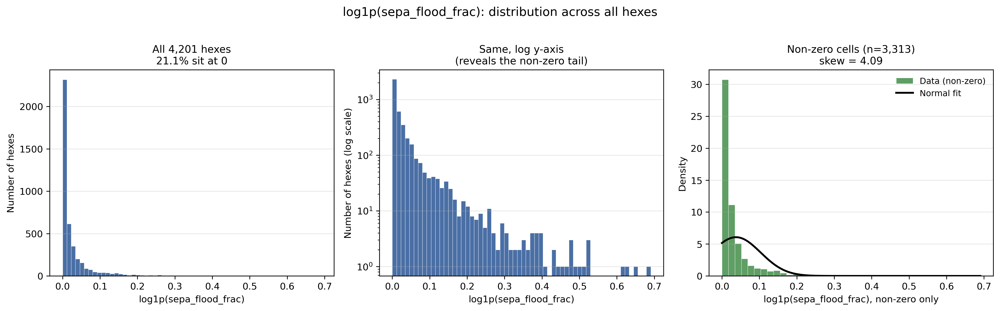

In [11]:
from pathlib import Path
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import norm

# Inputs 
BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
HEX_PATH = BASE/("hex_h3_res9_with_sepa_eligible.gpkg")
COL = "sepa_flood_frac"
NEW = "log1p_sepa_flood_frac"
OUT = BASE/("hex_h3_res9_sepa_log1p.gpkg")
OUT_PNG = BASE/("log1p_sepa_distribution.png")

gdf = gpd.read_file(HEX_PATH)
if COL not in gdf.columns:
    raise KeyError(f"'{COL}' not in {HEX_PATH.name}. Columns: {list(gdf.columns)}")

# TRansformation (all hexes)
gdf[NEW] = np.log1p(gdf[COL])       # log(1 + x), zero-safe

raw = gdf[COL].dropna().values
v = gdf[NEW].dropna().values
n_all = len(v)
n_zero = int((gdf[COL] == 0).sum())

# How it is distribtued 
print(f"All hexes:              {n_all:,}")
print(f"  exactly zero:         {n_zero:,} ({100*n_zero/n_all:.1f}%)  (stay 0 after log1p)")
print("\n              raw        log1p")
print(f"  mean     {raw.mean():9.5f}  {v.mean():9.5f}")
print(f"  median   {np.median(raw):9.5f}  {np.median(v):9.5f}")
print(f"  sd       {raw.std():9.5f}  {v.std():9.5f}")
print(f"  min      {raw.min():9.5f}  {v.min():9.5f}")
print(f"  p95      {np.quantile(raw,0.95):9.5f}  {np.quantile(v,0.95):9.5f}")
print(f"  max      {raw.max():9.5f}  {v.max():9.5f}")
print(f"  skew     {stats.skew(raw):9.2f}  {stats.skew(v):9.2f}")
print(f"  kurtosis {stats.kurtosis(raw):9.2f}  {stats.kurtosis(v):9.2f}")

if 3 <= n_all <= 5000:
    W, p = stats.shapiro(v)
    print(f"\nShapiro-Wilk on log1p (all cells): W={W:.3f}, p={p:.4g}")
    print("  (expected to reject: the zero spike is still ~85% of the mass)")

# Plots
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), dpi=150)

# Panel 1: All cells, linear count. The zero bar dominates - this is the point.
ax = axes[0]
ax.hist(v, bins=60, color="#4A6FA5", edgecolor="white", linewidth=0.3)
ax.set_xlabel("log1p(sepa_flood_frac)")
ax.set_ylabel("Number of hexes")
ax.set_title(f"All {n_all:,} hexes\n{100*n_zero/n_all:.1f}% sit at 0", fontsize=11)
ax.grid(alpha=0.3, axis="y")

# Panel 2: All cells, log y-axis, so the small non-zero mass is visible too.
ax = axes[1]
ax.hist(v, bins=60, color="#4A6FA5", edgecolor="white", linewidth=0.3)
ax.set_yscale("log")
ax.set_xlabel("log1p(sepa_flood_frac)")
ax.set_ylabel("Number of hexes (log scale)")
ax.set_title("Same, log y-axis\n(reveals the non-zero tail)", fontsize=11)
ax.grid(alpha=0.3, axis="y")

# Panel 3: Non-zero cells only, density, with a normal fit for reference.
nz = v[v > 0]
ax = axes[2]
ax.hist(nz, bins=40, density=True, color="#5F9E64", edgecolor="white",
        linewidth=0.3, label="Data (non-zero)")
mu, sd = norm.fit(nz)
xs = np.linspace(nz.min(), nz.max(), 200)
ax.plot(xs, norm.pdf(xs, mu, sd), "k", lw=2, label="Normal fit")
ax.set_xlabel("log1p(sepa_flood_frac), non-zero only")
ax.set_ylabel("Density")
ax.set_title(f"Non-zero cells (n={len(nz):,})\nskew = {stats.skew(nz):.2f}",
             fontsize=11)
ax.legend(fontsize=9, frameon=False)
ax.grid(alpha=0.3, axis="y")

fig.suptitle("log1p(sepa_flood_frac): distribution across all hexes",
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(OUT_PNG, dpi=200, bbox_inches="tight")
print(f"\nSaved plot: {OUT_PNG}")

gdf.to_file(OUT, driver="GPKG")
print(f"Saved all {n_all:,} hexes with '{NEW}': {OUT}")
plt.show()

In [12]:
print(gdf.columns.tolist())

['h3_id', 'hex_area_m2', 'land_area_m2', 'land_frac', 'sepa_flood_area_m2', 'sepa_flood_frac', 'sepa_flood_frac_full', 'geometry', 'log1p_sepa_flood_frac']


# Produce: hex_h3_res9_with_pop.gpkg

Method: Census Output Area counts are redistributed onto H3 res-9 hexes in proportion to BUILDING FLOOR/FOOTPRINT AREA (dasymetric). Counts are extensive (summed); the ratio is rebuilt from the interpolated counts; density is recomputed from the interpolated count and hex area.

In [79]:
from pathlib import Path

import geopandas as gpd
import h3
import numpy as np
import pandas as pd

BASE      = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
HEX_PATH  = BASE / "hex_h3_res9.gpkg"
CSV       = BASE / "DATA/Census-2022-Output-Area-v1/Census.csv"
OA_SHP    = BASE / "DATA/output-area-2022-eor/OutputArea2022_EoR/OutputArea2022_EoR.shp"
BUILDINGS = BASE / "DATA/Download_Flooding_buildings_2998217/ukbuildings_6429165/UKBuildings_19.shp"
OUT       = BASE / "hex_h3_res9_with_pop.gpkg"

# CSV columns
CSV_KEY = "OutputArea"
POP     = "Total_population"
DEP     = "Dependent"

# OA shapefile
SHP_KEY = "code"

TARGET_CRS = "EPSG:3035"
CRS_BNG    = "EPSG:27700"

# Floor-area weighting if the buildings layer has height/storeys.
HEIGHT_COL = None            # e.g. "height" or "storeys"
METRES_PER_STOREY = 3.0

# Buffer (m) applied to the hex-grid footprint when selecting OAs, so edge OAs
# that sit partly outside the grid are still included.
OA_CLIP_BUFFER_M = 500.0


# Load base grid
print(f"Loading base grid: {HEX_PATH}")
hexes = gpd.read_file(HEX_PATH)
if hexes.crs is None or hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
hexes["hex_area_m2"] = hexes.geometry.area
print(f"  {len(hexes):,} hexes")
if "h3_id" not in hexes.columns:
    raise KeyError("Base grid has no h3_id column.")

study_geom = hexes.geometry.union_all()


# Load OA + CSV
print(f"\nLoading OA attributes: {CSV.name}")
df = pd.read_csv(CSV)
df.columns = df.columns.str.strip()

def col(want: str) -> str:
    hit = [c for c in df.columns if c.lower() == want.lower()]
    if not hit:
        raise KeyError(f"'{want}' not in CSV. Columns: {list(df.columns)}")
    return hit[0]

k, p, d = col(CSV_KEY), col(POP), col(DEP)
df = df[[k, p, d]].rename(columns={k: "oa", p: "all_people", d: "dependent"})
df["oa"] = df["oa"].astype(str).str.strip()
print(f"  {len(df):,} OA rows (national)")
print(f"  all_people {df['all_people'].min():.0f}-{df['all_people'].max():.0f}, "
      f"dependent {df['dependent'].min():.0f}-{df['dependent'].max():.0f}")
if (df["dependent"] <= df["all_people"]).mean() < 0.99:
    print("  [!] dependent > all_people in some rows - are both COUNTS?")

print(f"Loading OA boundaries: {OA_SHP.name}")
oa = gpd.read_file(OA_SHP)
oa[SHP_KEY] = oa[SHP_KEY].astype(str).str.strip()
oa = oa.merge(df, left_on=SHP_KEY, right_on="oa", how="inner",
              validate="one_to_one")
oa = oa.to_crs(TARGET_CRS)
oa["geometry"] = oa.geometry.buffer(0)
print(f"  {len(oa):,} OAs matched to attributes (national)")

# Clip to study area
clip_geom = study_geom.buffer(OA_CLIP_BUFFER_M)
before = len(oa)
oa = oa[oa.geometry.intersects(clip_geom)].copy()
print(f"  clipped to study area (+{OA_CLIP_BUFFER_M:.0f} m): "
      f"{len(oa):,} of {before:,} OAs")
if len(oa) == 0:
    raise RuntimeError("No OAs intersect the study area - check CRS / extent.")
print(f"  study-area population: {oa['all_people'].sum():,.0f}")


# Building weights
print(f"\nLoading buildings: {BUILDINGS.name}")
b = gpd.read_file(BUILDINGS, bbox=tuple(oa.to_crs(CRS_BNG).total_bounds))
b = b.to_crs(TARGET_CRS)
b = b[b.geometry.notna() & ~b.geometry.is_empty].copy()
b["geometry"] = b.geometry.buffer(0)
b["mass"] = b.geometry.area

if HEIGHT_COL and HEIGHT_COL in b.columns:
    storeys = (pd.to_numeric(b[HEIGHT_COL], errors="coerce")
               / METRES_PER_STOREY).clip(lower=1).fillna(1)
    b["mass"] *= storeys
    print(f"  weighting by floor area (height '{HEIGHT_COL}')")
else:
    if HEIGHT_COL:
        print(f"  [warn] '{HEIGHT_COL}' not in buildings - using footprint")
    print(f"  weighting by footprint area")
print(f"  {len(b):,} buildings in study-area bbox")

pts = b[["mass", "geometry"]].copy()
pts["geometry"] = b.geometry.representative_point()

pts = gpd.sjoin(pts, oa[[SHP_KEY, "geometry"]], how="inner",
                predicate="within").drop(columns="index_right")
pts = gpd.sjoin(pts, hexes[["h3_id", "geometry"]], how="inner",
                predicate="within").drop(columns="index_right")

w = pts.groupby([SHP_KEY, "h3_id"], as_index=False)["mass"].sum()
w["w"] = w["mass"] / w.groupby(SHP_KEY)["mass"].transform("sum")

# OAs with no buildings IN A HEX: place at the OA centroid's hex if that hex
# exists; otherwise the OA lies outside the grid and its (small) population is
# legitimately dropped as an edge effect.
orphans = set(oa[SHP_KEY]) - set(w[SHP_KEY])
if orphans:
    cen = oa[oa[SHP_KEY].isin(orphans)].copy()
    cen["geometry"] = cen.geometry.representative_point()
    cen = gpd.sjoin(cen[[SHP_KEY, "geometry"]], hexes[["h3_id", "geometry"]],
                    how="inner", predicate="within")
    placed = len(cen)
    if placed:
        w = pd.concat([w, cen.assign(mass=np.nan,
                       w=1.0)[[SHP_KEY, "h3_id", "mass", "w"]]])
    print(f"  {len(orphans)} OAs without building-in-hex; "
          f"{placed} placed at centroid, {len(orphans) - placed} fall outside "
          f"the grid (edge effect)")


# Interpolate
attrs = oa[[SHP_KEY, "all_people", "dependent"]]
j = w.merge(attrs, on=SHP_KEY, how="left")
j["pop_w"] = j["all_people"] * j["w"]
j["dep_w"] = j["dependent"] * j["w"]

agg = (j.groupby("h3_id", as_index=False)
         .agg(All_people=("pop_w", "sum"), dependent=("dep_w", "sum")))

out = hexes.merge(agg, on="h3_id", how="left")
out[["All_people", "dependent"]] = out[["All_people", "dependent"]].fillna(0.0)

out["age_dep_ratio"] = np.where(out["All_people"] > 0,
                                out["dependent"] / out["All_people"], np.nan)
out["pop_density"] = out["All_people"] / (out["hex_area_m2"] / 1e6)


# QA + mass balance
# Compare against STUDY-AREA totals only (out-of-grid edge OAs excepted).
in_grid = set(w[SHP_KEY])
src = oa[oa[SHP_KEY].isin(in_grid)]
src_pop, tgt_pop = src["all_people"].sum(), out["All_people"].sum()
src_dep, tgt_dep = src["dependent"].sum(), out["dependent"].sum()

print("\n=== INTERPOLATION QA ===")
for name, s_, t_ in (("all_people", src_pop, tgt_pop),
                     ("dependent",  src_dep, tgt_dep)):
    err = 100 * (t_ - s_) / s_ if s_ else float("nan")
    ok = "OK" if abs(err) < 1.0 else "CHECK"
    print(f"  [{ok:>5}] {name:<11} in-grid source {s_:>10,.0f} -> "
          f"hexes {t_:>10,.0f}  ({err:+.2f}%)")
print(f"  populated hexes: {int((out['All_people'] > 0).sum()):,} of {len(out):,}")
print(f"  pop_density  mean {out['pop_density'].mean():,.0f}/km2  "
      f"median {out['pop_density'].median():,.0f}/km2  "
      f"max {out['pop_density'].max():,.0f}/km2")
print(f"  dependent share  mean {out['age_dep_ratio'].mean():.3f}  "
      f"median {out['age_dep_ratio'].median():.3f}  (SHARE 0-1)")
print("\n  A residual <1% is edge effect (OAs straddling the grid boundary).")
print("  A large residual means OAs are still not clipping correctly.")


keep = ["h3_id", "pop_density", "age_dep_ratio", "All_people", "dependent",
        "geometry"]
out[keep].to_file(OUT, driver="GPKG")
print(f"\nSaved: {OUT}")

Loading base grid: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9.gpkg
  4,201 hexes

Loading OA attributes: Census.csv
  46,368 OA rows (national)
  all_people 56-2991, dependent 0-281
Loading OA boundaries: OutputArea2022_EoR.shp
  46,363 OAs matched to attributes (national)
  clipped to study area (+500 m): 1,063 of 46,363 OAs
  study-area population: 119,120

Loading buildings: UKBuildings_19.shp
  weighting by footprint area
  67,983 buildings in study-area bbox
  36 OAs without building-in-hex; 1 placed at centroid, 35 fall outside the grid (edge effect)

=== INTERPOLATION QA ===
  [   OK] all_people  in-grid source    114,873 -> hexes    114,873  (+0.00%)
  [   OK] dependent   in-grid source     32,394 -> hexes     32,394  (+0.00%)
  populated hexes: 1,298 of 4,201
  pop_density  mean 295/km2  median 0/km2  max 11,080/km2
  dependent share  mean 0.323  median 0.323  (SHARE 0-1)

  A residual <1% is edge effect (OAs straddling the grid boundary).
  A large r

In [80]:
import geopandas as gpd
from pathlib import Path

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
g = gpd.read_file(BASE / "hex_h3_res9_with_pop.gpkg", rows=0)   # rows=0 = schema only, fast

print(f"{len(g.columns)} columns:\n")
for c in g.columns:
    print(f"  {c}")

6 columns:

  h3_id
  pop_density
  age_dep_ratio
  All_people
  dependent
  geometry


In [15]:
import geopandas as gpd
import numpy as np
from pathlib import Path

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
POP_PATH = BASE / "hex_h3_res9_with_pop.gpkg"

pop = gpd.read_file(POP_PATH)

# What columns does the pop file actually have?
print("Columns:", [c for c in pop.columns if c != "geometry"])

# The NaN hexes: where age_dep_ratio is missing
nan_mask = pop["age_dep_ratio"].isna()
print(f"\nTotal hexes: {len(pop):,}")
print(f"age_dep_ratio NaN: {int(nan_mask.sum()):,}")

# Pick whatever the population count column is called
POP_COL = next((c for c in ["pop_total", "All_people", "population", "pop"]
                if c in pop.columns), None)
print(f"Using population column: {POP_COL}")

if POP_COL:
    print("\n--- population in the NaN hexes ---")
    print(pop.loc[nan_mask, POP_COL].describe())
    zero_pop = (pop.loc[nan_mask, POP_COL].fillna(0) == 0).sum()
    has_pop  = (pop.loc[nan_mask, POP_COL].fillna(0) >  0).sum()
    print(f"\nNaN hexes with ZERO population: {zero_pop:,}  (structural - expected)")
    print(f"NaN hexes WITH population:     {has_pop:,}  (join gap - recoverable)")

Columns: ['h3_id', 'pop_density', 'age_dep_ratio', 'All_people', 'dependent']

Total hexes: 4,201
age_dep_ratio NaN: 2,903
Using population column: All_people

--- population in the NaN hexes ---
count    2903.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: All_people, dtype: float64

NaN hexes with ZERO population: 2,903  (structural - expected)
NaN hexes WITH population:     0  (join gap - recoverable)


In [17]:
# hexes that received building weight
w_hexes = set(pts["h3_id"]) if "h3_id" in pts.columns else None
# Reload and check building coverage
b_hexes = set(out.loc[out["All_people"] > 0, "h3_id"])
print(f"populated hexes: {len(b_hexes):,}")
print(f"empty hexes:     {(out['All_people'] == 0).sum():,}")

populated hexes: 1,298
empty hexes:     2,903


In [18]:
import geopandas as gpd
from pathlib import Path

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
POP_PATH = BASE / "hex_h3_res9_with_pop.gpkg"

gdf = gpd.read_file(POP_PATH)

gdf.info()                                          # non-null counts + dtypes
print(gdf.describe())                               # numeric column stats (min/max/mean etc.)
print(gdf.drop(columns="geometry").isna().sum())    # missing values per column

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4201 entries, 0 to 4200
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   h3_id          4201 non-null   str     
 1   pop_density    4201 non-null   float64 
 2   age_dep_ratio  1298 non-null   float64 
 3   All_people     4201 non-null   float64 
 4   dependent      4201 non-null   float64 
 5   geometry       4201 non-null   geometry
dtypes: float64(4), geometry(1), str(1)
memory usage: 197.1 KB
        pop_density  age_dep_ratio   All_people    dependent
count   4201.000000    1298.000000  4201.000000  4201.000000
mean     294.520745       0.322702    27.344204     7.711021
std      961.068849       0.093006    89.224341    24.560428
min        0.000000       0.034247     0.000000     0.000000
25%        0.000000       0.262788     0.000000     0.000000
50%        0.000000       0.322566     0.000000     0.000000
75%       10.781783       0.378378  

In [19]:
# If the raw components are in the file, see which one is missing
for c in ["dependent", "All_people", "pop_total", "age_dep_ratio"]:
    if c in pop.columns:
        print(f"{c:15s} NaN={int(pop[c].isna().sum()):>5,}  zero={int((pop[c].fillna(0)==0).sum()):>5,}")

dependent       NaN=    0  zero=2,903
All_people      NaN=    0  zero=2,903
age_dep_ratio   NaN=2,903  zero=2,903


In [20]:
import geopandas as gpd
import pandas as pd

census_csv = pd.read_csv(
    '/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Census-2022-Output-Area-v1/Age_Census_2022.csv', low_memory=False)

## Population density

CRS: EPSG:3035   (1,298 populated hexes)


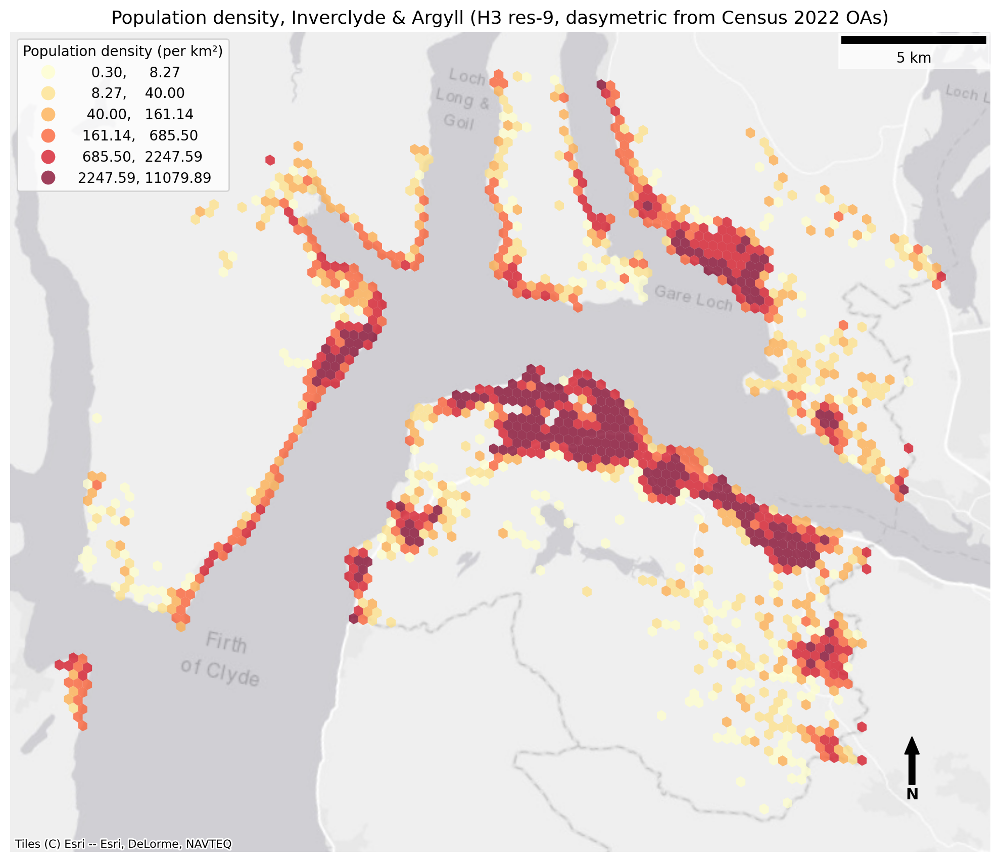

In [43]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib_scalebar.scalebar import ScaleBar
from pathlib import Path

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
POP_PATH = BASE / "hex_h3_res9_with_pop.gpkg"
OUT_PNG = BASE / "pop_density_map.png"

out = gpd.read_file(POP_PATH)

# Keep the data in its native EPSG:3035, do NOT reproject.
# contextily will warp the basemap tiles to match, via crs=pop.crs below.
pop = out[out["pop_density"] > 0]
print(f"CRS: {pop.crs}   ({len(pop):,} populated hexes)")

fig, ax = plt.subplots(figsize=(10, 10))
pop.plot(
    column="pop_density",
    scheme="quantiles", k=6,
    cmap="YlOrRd",
    legend=True,
    legend_kwds={"title": "Population density (per km²)", "loc": "upper left"},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)
# crs=pop.crs tells contextily the data is in EPSG:3035; it reprojects the
# tiles to that CRS rather than us reprojecting the data.
# cx.add_basemap(ax, crs=pop.crs, source=cx.providers.OpenStreetMap.Mapnik)
#cx.add_basemap(ax, crs=TARGET_CRS, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)
ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)
ax.set_title("Population density, Inverclyde & Argyll (H3 res-9, "
             "dasymetric from Census 2022 OAs)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig(OUT_PNG, dpi=200, bbox_inches="tight")
plt.show()

# Age dependant ratio

CRS: EPSG:3035   (1,298 populated hexes)


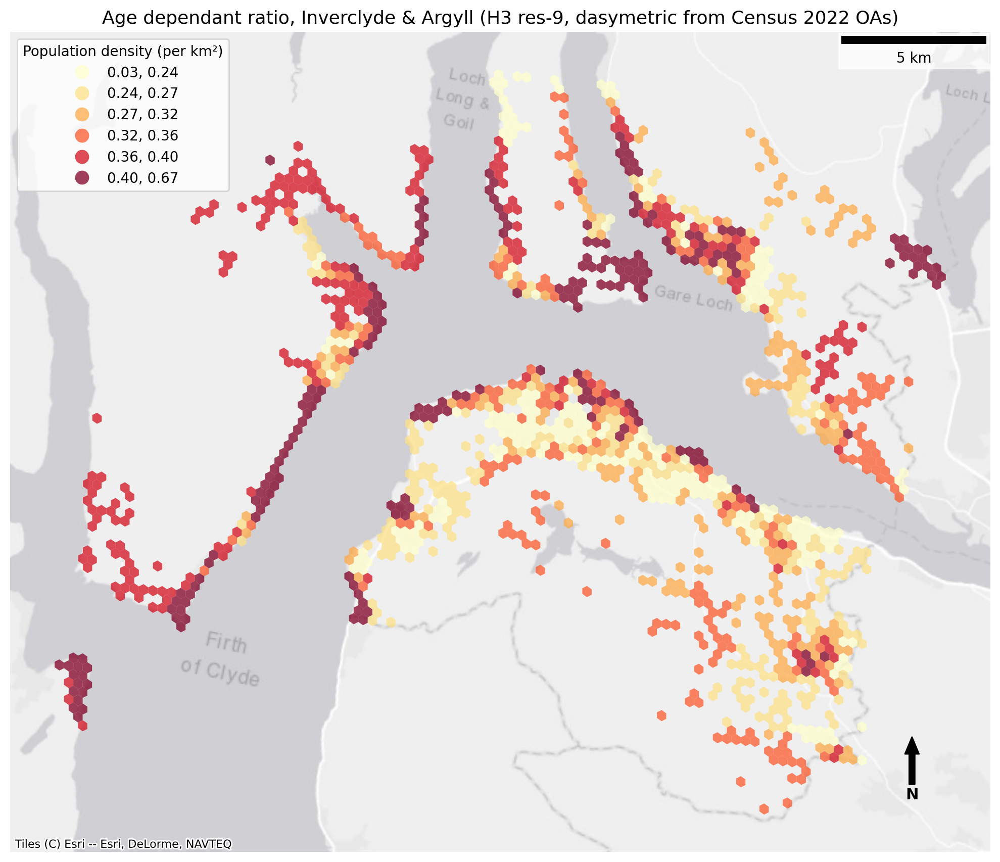

In [44]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
POP_PATH = BASE / "hex_h3_res9_with_pop.gpkg"


out = gpd.read_file(POP_PATH)


pop = out[out["age_dep_ratio"] > 0]
print(f"CRS: {pop.crs}   ({len(pop):,} populated hexes)")

fig, ax = plt.subplots(figsize=(10, 10))
pop.plot(
    column="age_dep_ratio",
    scheme="quantiles", k=6,
    cmap="YlOrRd",
    legend=True,
    legend_kwds={"title": "Population density (per km²)", "loc": "upper left"},
    alpha=0.75,                      
    edgecolor="none",
    ax=ax,
)

# crs=pop.crs tells contextily the data is in EPSG:3035; it reprojects the
# tiles to that CRS rather than us reprojecting the data.
# cx.add_basemap(ax, crs=pop.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)

ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)

ax.set_title("Age dependant ratio, Inverclyde & Argyll (H3 res-9, "
             "dasymetric from Census 2022 OAs)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("age_dep_ratio_map.png", dpi=200, bbox_inches="tight")
plt.show()

## Greenspace 

CRS: EPSG:3035   (444 hexes with greenspace)


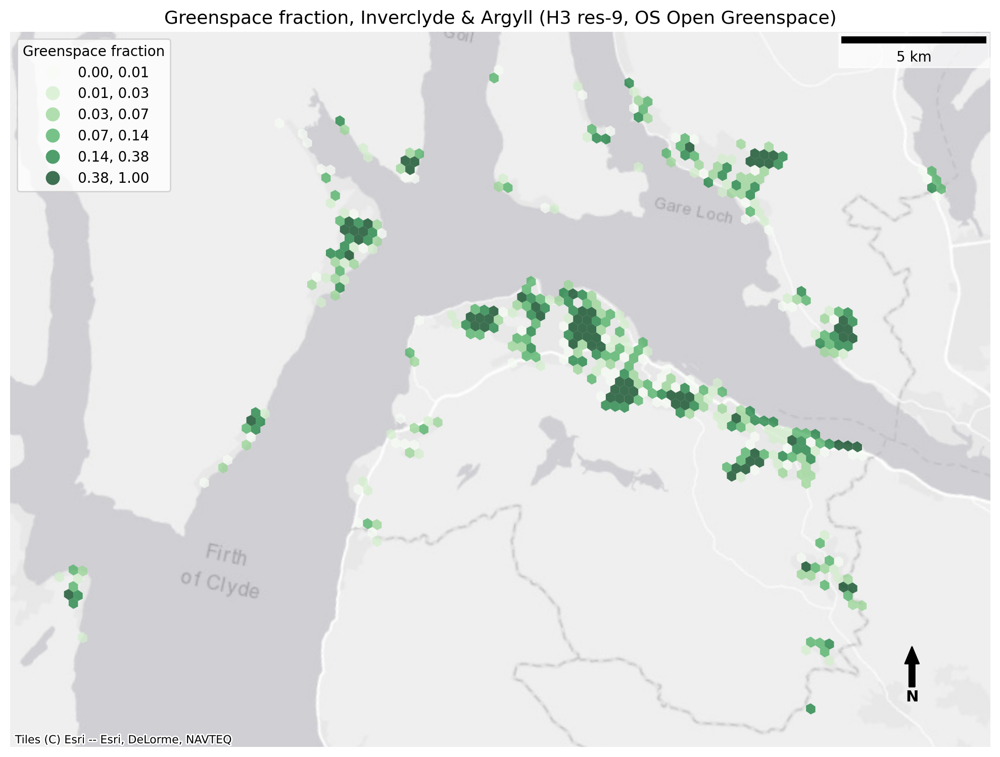

In [45]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
POP_PATH = BASE / "hex_h3_res9_joined.gpkg"


green = gpd.read_file(POP_PATH)

g = green[green["greenspace_frac"] > 0]
print(f"CRS: {g.crs}   ({len(g):,} hexes with greenspace)")

fig, ax = plt.subplots(figsize=(10, 10))
g.plot(
    column="greenspace_frac",
    scheme="quantiles", k=6,
    cmap="Greens",
    legend=True,
    legend_kwds={"title": "Greenspace fraction", "loc": "upper left"},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)

# cx.add_basemap(ax, crs=g.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)

ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)

ax.set_title("Greenspace fraction, Inverclyde & Argyll (H3 res-9, "
             "OS Open Greenspace)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("greenspace_map.png", dpi=200, bbox_inches="tight")

# Produce: hex_h3_res9_with_buildings.gpkg

Columns:
  building_footprint_frac   sealed/occupied share of the hex (0-1)   <- exposure/hazard
  building_floor_m2         total floor area in the hex (m^2)        <- people proxy
  building_floor_density    floor area per km^2                      <- comparable across hexes
  building_count            number of buildings                      <- QA
  building_footprint_m2     total footprint area (m^2)               <- QA


  FOOTPRINT FRACTION  = ground the buildings cover / hex area. This is the
    physically flood-relevant quantity: sealed, occupied ground. It does not
    care how tall the buildings are.

  FLOOR AREA = footprint x storeys. This proxies how many PEOPLE /
    how much activity sits in the hex - a 4-storey tenement block houses far
    more than a bungalow of equal footprint. Needs a height/storeys attribute;
    if none is present the script says so and floor area == footprint area
    (i.e. assumes 1 storey everywhere = limitation)

In [46]:
from pathlib import Path

import geopandas as gpd
import numpy as np
import pandas as pd



BASE      = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9.gpkg")               # base grid - never a chain file
BUILDINGS = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Download_Flooding_buildings_2998217/ukbuildings_6429165/UKBuildings_19.shp")            # OS MasterMap / Open Map Local / OSM
OUT       = Path("hex_h3_res9_with_buildings.gpkg")

TARGET_CRS = "EPSG:3035"

# Height handling. The script auto-detects the first column it finds from each list below. Set to [] to force footprint-only.
HEIGHT_M_COLS   = ["rel_h_max", "relh2", "height", "abs_hmax", "RelHMax",
                   "building_height", "mean_ht"]      # metres
STOREY_COLS     = ["storeys", "floors", "num_floors", "levels",
                   "building_levels"]                 # count of storeys
METRES_PER_STOREY = 3.0                                # to convert height -> storeys


# Base
print(f"Loading base grid: {BASE}")
hexes = gpd.read_file(BASE)
if hexes.crs is None:
    raise RuntimeError("Base grid has no CRS.")
if hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
print(f"  {len(hexes):,} hexes")
if "h3_id" not in hexes.columns:
    raise KeyError("Base grid has no h3_id column.")

hexes["hex_area_m2"] = hexes.geometry.area


# Buildings 
print(f"Loading buildings: {BUILDINGS}")
if not BUILDINGS.exists():
    raise FileNotFoundError(BUILDINGS)

# bbox filter at the driver level: National layers are never fully loaded.
b = gpd.read_file(BUILDINGS, bbox=tuple(hexes.total_bounds if
                  hexes.crs.to_epsg() == 4326 else
                  hexes.to_crs(gpd.read_file(BUILDINGS, rows=1).crs).total_bounds))
b = b.to_crs(TARGET_CRS)
b = b[b.geometry.notna() & ~b.geometry.is_empty].copy()
b["geometry"] = b.geometry.buffer(0)                  # repair rings
print(f"  {len(b):,} buildings in AOI")

# Filter to residential/occupied where the layer supports it.
# OS MasterMap Topography carries 'descriptiveGroup' / 'descriptiveTerm'.
for col in ("descriptiveGroup", "DESCGROUP", "theme"):
    if col in b.columns:
        before = len(b)
        b = b[b[col].astype(str).str.contains("Building", case=False, na=False)]
        print(f"  filtered on {col} to Building: {len(b):,} of {before:,}")
        break

b["footprint_m2"] = b.geometry.area


# Resolve height -> storeys
def find_col(cols, candidates):
    lower = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in lower:
            return lower[cand.lower()]
    return None


storey_col = find_col(b.columns, STOREY_COLS)
height_col = find_col(b.columns, HEIGHT_M_COLS)

if storey_col:
    storeys = pd.to_numeric(b[storey_col], errors="coerce")
    print(f"  storeys from '{storey_col}'")
elif height_col:
    storeys = (pd.to_numeric(b[height_col], errors="coerce")
               / METRES_PER_STOREY)
    print(f"  storeys derived from height '{height_col}' "
          f"(/{METRES_PER_STOREY} m per storey)")
else:
    storeys = pd.Series(np.nan, index=b.index)
    print("  [!] no height/storeys column found -> FLOOR AREA ASSUMES 1 STOREY.")
    print("      State this as a limitation, or add your column to the config.")

# Storeys: At least 1, cap absurd values, fill missing with 1.
storeys = storeys.clip(lower=1, upper=60).fillna(1.0)
b["floor_m2"] = b["footprint_m2"] * storeys


# Assign buildings to hexes
# Centroid assignment: A res-9 hex is ~174 m across, a building is a point at that scale. representative_point() is guaranteed inside the polygon.
print("Assigning buildings to hexes...")
pts = b[["footprint_m2", "floor_m2", "geometry"]].copy()
pts["geometry"] = b.geometry.representative_point()

joined = gpd.sjoin(pts, hexes[["h3_id", "geometry"]],
                   how="inner", predicate="within").drop(columns="index_right")

agg = (joined.groupby("h3_id")
       .agg(building_count=("footprint_m2", "size"),
            building_footprint_m2=("footprint_m2", "sum"),
            building_floor_m2=("floor_m2", "sum"))
       .reset_index())


# Assemble 
hexes = hexes.merge(agg, on="h3_id", how="left")
for c in ("building_count", "building_footprint_m2", "building_floor_m2"):
    hexes[c] = hexes[c].fillna(0)                     # no buildings = 0, not NaN

hexes["building_count"] = hexes["building_count"].astype(int)

# Footprint fraction: Cap at 1.0 (centroid assignment can nominally overshoot if a large building's footprint exceeds the hex, though it is rare at res-9).
hexes["building_footprint_frac"] = (
    hexes["building_footprint_m2"] / hexes["hex_area_m2"]).clip(0, 1)

# Floor-area density: comparable across hexes of (near-)equal area.
hexes["building_floor_density"] = (
    hexes["building_floor_m2"] / (hexes["hex_area_m2"] / 1e6))   # m^2 floor per km^2


# Audit
ff = hexes["building_footprint_frac"]
fl = hexes["building_floor_m2"]
print("\n=== BUILDING DENSITY AUDIT ===")
print(f"Hexes:                 {len(hexes):,}")
print(f"With >=1 building:      {int((hexes['building_count'] > 0).sum()):,} "
      f"({100 * (hexes['building_count'] > 0).mean():.1f}%)")
print(f"\nFootprint fraction (0-1):")
print(f"  mean {ff.mean():.3f}   median {ff.median():.3f}   max {ff.max():.3f}")
for q in (0.5, 0.75, 0.95, 0.99):
    print(f"  p{int(q*100):02d}  {ff.quantile(q):.3f}")
print(f"\nFloor area (m^2):")
print(f"  mean {fl.mean():,.0f}   median {fl.median():,.0f}   max {fl.max():,.0f}")

# Check that ootprint fraction should rarely streets, gardens, gaps.
if (ff > 0.8).mean() > 0.05:
    print("\n[!] >5% of hexes exceed 0.8 footprint fraction - unusually dense. "
          "Check the buildings layer isn't including non-building polygons.")

keep = ["h3_id",
        "building_footprint_frac", "building_floor_m2", "building_floor_density",
        "building_footprint_m2", "building_count", "geometry"]
hexes[keep].to_file(OUT, driver="GPKG")
print(f"\nSaved: {OUT}")
print("  join_predictors.py will pick up building_* columns from this file.")
print("  Add aliases to the join if it looks for 'building_density':")
print('    "building_density": ["building_density", "building_floor_density",')
print('                         "building_footprint_frac"],')

Loading base grid: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9.gpkg
  4,201 hexes
Loading buildings: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Download_Flooding_buildings_2998217/ukbuildings_6429165/UKBuildings_19.shp
  42,430 buildings in AOI
  storeys derived from height 'height' (/3.0 m per storey)
Assigning buildings to hexes...

=== BUILDING DENSITY AUDIT ===
Hexes:                 4,201
With >=1 building:      1,298 (30.9%)

Footprint fraction (0-1):
  mean 0.014   median 0.000   max 0.451
  p50  0.000
  p75  0.003
  p95  0.103
  p99  0.183

Floor area (m^2):
  mean 4,082   median 0   max 182,755

Saved: hex_h3_res9_with_buildings.gpkg
  join_predictors.py will pick up building_* columns from this file.
  Add aliases to the join if it looks for 'building_density':
    "building_density": ["building_density", "building_floor_density",
                         "building_footprint_frac"],


## Building density

['h3_id', 'building_footprint_frac', 'building_floor_m2', 'building_floor_density', 'building_footprint_m2', 'building_count', 'geometry']
CRS: EPSG:3035   (1,300 hexes with buildings)


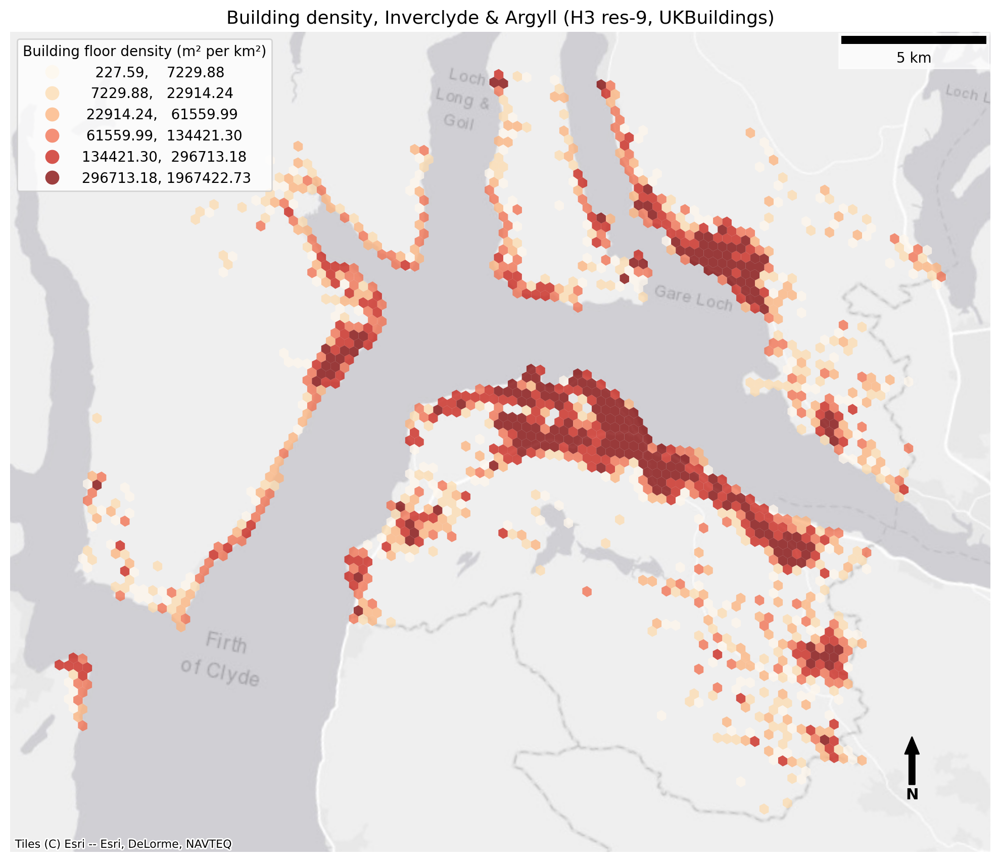

In [47]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

build = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_buildings.gpkg")
print(build.columns.tolist())        # confirm the density column name


COL = "building_floor_density"      

b = build[build[COL] > 0]
print(f"CRS: {b.crs}   ({len(b):,} hexes with buildings)")

fig, ax = plt.subplots(figsize=(10, 10))
b.plot(
    column=COL,
    scheme="quantiles", k=6,
    cmap="OrRd",
    legend=True,
    legend_kwds={"title": "Building floor density (m² per km²)",
                 "loc": "upper left"},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)

#cx.add_basemap(ax, crs=b.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)

ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)

ax.set_title("Building density, Inverclyde & Argyll (H3 res-9, "
             "UKBuildings)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("building_density_map.png", dpi=200, bbox_inches="tight")
plt.show()

In [48]:
import geopandas as gpd

# Full dataset, no bounding-box filter
url = ("https://services3.arcgis.com/SClJFeTjrkPbtMzT/arcgis/rest/services/"
       "SWSewerCatchmentsPublic_(view)/FeatureServer/0/query"
       "?where=1%3D1&outFields=*&f=geojson")

sw = gpd.read_file(url)
print(f"Downloaded {len(sw):,} catchments, source CRS: {sw.crs}")
print(f"Total area: {sw.to_crs('EPSG:3035').geometry.area.sum() / 1e6:.1f} km2")
print(sw.crs, len(sw), "features")

sw.to_file("scottish_water_sewer_catchments.geojson", driver="GeoJSON")
sw.to_file("scottish_water_sewer_catchments.gpkg", driver="GPKG")

Downloaded 1,876 catchments, source CRS: EPSG:4326
Total area: 2045.9 km2
EPSG:4326 1876 features


# Scottish Water sewer catchments

In [49]:
from pathlib import Path

import geopandas as gpd
import requests
import shapely

SERVICE = ("https://services3.arcgis.com/SClJFeTjrkPbtMzT/arcgis/rest/services/"
           "SWSewerCatchmentsPublic_(view)/FeatureServer/0/query")

AOI_PATH   = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/study_area_10Kmbuffer_dissolved.shp")
CACHE      = Path("sewer_catchments_aoi.gpkg")
TARGET_CRS = "EPSG:3035"

PAGE = 1000          # request size; server may cap this lower


def fetch_arcgis(service: str, bbox_wgs84: tuple[float, float, float, float],
                 page: int = PAGE) -> gpd.GeoDataFrame:
    """Paginated GeoJSON fetch with a server-side envelope filter."""
    xmin, ymin, xmax, ymax = bbox_wgs84
    frames, offset = [], 0

    while True:
        params = {
            "where": "1=1",
            "geometry": f"{xmin},{ymin},{xmax},{ymax}",
            "geometryType": "esriGeometryEnvelope",
            "inSR": 4326,
            "outSR": 4326,
            "spatialRel": "esriSpatialRelIntersects",
            "outFields": "*",
            "returnGeometry": "true",
            "resultOffset": offset,
            "resultRecordCount": page,
            "f": "geojson",
        }
        r = requests.get(service, params=params, timeout=120)
        r.raise_for_status()
        js = r.json()

        if "error" in js:
            raise RuntimeError(f"ArcGIS error: {js['error']}")

        feats = js.get("features", [])
        if not feats:
            break

        frames.append(gpd.GeoDataFrame.from_features(feats, crs="EPSG:4326"))
        print(f"    page @ offset {offset}: {len(feats)} features")

        # The service tells us when more remain. Trust this over len(feats).
        if not js.get("properties", {}).get("exceededTransferLimit", False) \
           and not js.get("exceededTransferLimit", False):
            if len(feats) < page:
                break
        offset += len(feats)

    if not frames:
        raise RuntimeError("Service returned no features for this AOI.")

    out = gpd.GeoDataFrame(
        __import__("pandas").concat(frames, ignore_index=True),
        crs="EPSG:4326",
    )
    return out


# AOI 
print(f"Loading AOI: {AOI_PATH}")
aoi = gpd.read_file(AOI_PATH).to_crs(TARGET_CRS)
aoi_geom = shapely.union_all(aoi.geometry.values)

bbox = tuple(gpd.GeoSeries([shapely.box(*aoi.total_bounds)], crs=TARGET_CRS)
             .to_crs("EPSG:4326").total_bounds)
print(f"  AOI bbox (WGS84): {tuple(round(v, 4) for v in bbox)}")

# Catchments 
if CACHE.exists():
    print(f"\nUsing cached catchments: {CACHE}")
    catch = gpd.read_file(CACHE)
else:
    print(f"\nFetching catchments from FeatureServer (AOI-filtered)...")
    catch = fetch_arcgis(SERVICE, bbox)
    catch.to_file(CACHE, driver="GPKG")
    print(f"  cached to {CACHE}")

print(f"  {len(catch):,} catchment polygons, CRS {catch.crs}")

catch = catch[catch.geometry.type.isin(["Polygon", "MultiPolygon"])].copy()
catch = catch.to_crs(TARGET_CRS)
catch["geometry"] = shapely.make_valid(catch.geometry.values)
print(f"  reprojected to {TARGET_CRS}")

# The server envelope filter is a BOUNDING BOX, so it over-selects at the corners. Refine to true AOI intersection.
before = len(catch)
catch = catch[catch.geometry.intersects(aoi_geom)].copy()
print(f"  intersecting true AOI: {len(catch):,} of {before:,}")

if len(catch) == 0:
    raise RuntimeError("No catchments intersect the AOI - check CRS / bbox.")

print("  dissolving catchments...")
catch_union = shapely.union_all(catch.geometry.values)
print(f"  total catchment area (AOI-intersecting): "
      f"{catch_union.area / 1e6:.1f} km2")
print(f"  AOI area: {aoi_geom.area / 1e6:.1f} km2")
print(f"  catchment coverage of AOI: "
      f"{100 * shapely.intersection(catch_union, aoi_geom).area / aoi_geom.area:.1f}%")

Loading AOI: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/study_area_10Kmbuffer_dissolved.shp
  AOI bbox (WGS84): (np.float64(-5.1099), np.float64(55.7945), np.float64(-4.5464), np.float64(56.0761))

Using cached catchments: sewer_catchments_aoi.gpkg
  47 catchment polygons, CRS EPSG:4326
  reprojected to EPSG:3035
  intersecting true AOI: 38 of 47
  dissolving catchments...
  total catchment area (AOI-intersecting): 92.8 km2
  AOI area: 361.8 km2
  catchment coverage of AOI: 11.0%


In [50]:
r = requests.get(SERVICE, params={"where": "1=1", "returnCountOnly": "true", "f": "json"})
print(r.json())

{'count': 1876, 'extent': {'xmin': 63186.87710000016, 'ymin': 536213.5830000006, 'xmax': 468509.6200000001, 'ymax': 1212344.0889999997, 'spatialReference': {'wkid': 27700, 'latestWkid': 27700}}}


# Sewer catchment coverage per H3 res-9 hex and urban-domain restriction.
Produce: hex_h3_res9_with_hrl_imperv.gpkg   (column: impervious_pct)
FAST version.

In [51]:
import time
from pathlib import Path

import geopandas as gpd
import numpy as np
import rasterio
from exactextract import exact_extract
from rasterio.windows import from_bounds


HEX_IN = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9.gpkg")
IMPERV_TIF = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/"
                  "DATA/StudyArea_hrl_imperviousness_2018.tif")
OUT = Path("hex_h3_res9_with_hrl_imperv.gpkg")
TMP = Path("_imperv_tmp.tif")

TARGET_CRS = "EPSG:3035"
HRL_NODATA = (254, 255)
NODATA_OUT = -9999.0          # sentinel; safer than NaN across GDAL builds
MIN_VALID_FRAC = 0.05         # suppress hexes with almost no real raster data

t0 = time.perf_counter()
def tick(msg):
    print(f"  [{time.perf_counter() - t0:6.1f}s] {msg}")


# Hexes
print("Loading hexes...")
hexes = gpd.read_file(HEX_IN)
if hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
tick(f"{len(hexes):,} hexes loaded")

if "h3_id" not in hexes.columns:
    raise KeyError("Base grid has no h3_id column.")


# Crop, mask, write temp
print("\nPreparing raster...")
with rasterio.open(IMPERV_TIF) as src:
    print(f"  source: {src.width} x {src.height} px, "
          f"{abs(src.transform.a):.0f} m, CRS {src.crs}, nodata {src.nodata}")
    if src.crs.to_epsg() != 3035:
        raise RuntimeError(
            f"Raster is {src.crs}, hexes are EPSG:3035. Reproject the raster:\n"
            f"  gdalwarp -t_srs EPSG:3035 -r near in.tif out.tif"
        )

    # Crop to hex extent (+ 1 pixel of slack) 
    minx, miny, maxx, maxy = hexes.total_bounds
    pad = abs(src.transform.a) * 2
    win = from_bounds(minx - pad, miny - pad, maxx + pad, maxy + pad,
                      src.transform).round_offsets().round_lengths()

    arr = src.read(1, window=win, boundless=True,
                   fill_value=HRL_NODATA[-1])
    transform = src.window_transform(win)
    px = abs(src.transform.a)
    tick(f"cropped to {arr.shape[1]} x {arr.shape[0]} px "
         f"(from {src.width} x {src.height})")

lo, hi = int(arr.min()), int(arr.max())
print(f"  values: {lo}-{hi}"
      + (f"  -> masking nodata codes {HRL_NODATA}" if hi > 100 else "  -> clean"))

masked = arr.astype("float32")
for nd in HRL_NODATA:
    masked[arr == nd] = NODATA_OUT
tick("nodata masked")

valid = masked[masked != NODATA_OUT]
print(f"  valid px: {valid.size:,}/{masked.size:,} "
      f"({100 * valid.size / masked.size:.1f}%), mean {valid.mean():.1f}%")

with rasterio.open(
    TMP, "w",
    driver="GTiff",
    height=masked.shape[0], width=masked.shape[1],
    count=1, dtype="float32",
    crs=TARGET_CRS, transform=transform,
    nodata=NODATA_OUT,
    tiled=True, blockxsize=512, blockysize=512,   # tiled: windowed reads are cheap
    compress=None,                                # UNCOMPRESSED: no decode per read
) as dst:
    dst.write(masked, 1)
tick(f"temp raster written ({TMP.stat().st_size / 1e6:.0f} MB)")


# Zonal statistics 
print("\nRunning exactextract...")
res = exact_extract(
    rast=str(TMP),
    vec=hexes,
    ops=["mean", "count"],
    output="pandas",
    include_cols=["h3_id"],
)
res = res.rename(columns={"mean": "impervious_pct", "count": "imperv_valid_px"})
tick("zonal stats done")

TMP.unlink(missing_ok=True)

hexes = hexes.merge(res, on="h3_id", how="left")
hexes["imperv_valid_frac"] = (
    hexes["imperv_valid_px"] * px * px / hexes.geometry.area
).clip(0, 1)

thin = hexes["imperv_valid_frac"] < MIN_VALID_FRAC
hexes.loc[thin, "impervious_pct"] = np.nan
print(f"  suppressed {int(thin.sum()):,} hexes with <{MIN_VALID_FRAC:.0%} "
      f"valid coverage (open water)")


# Audit
ip = hexes["impervious_pct"]
print("\n=== IMPERVIOUSNESS AUDIT ===")
print(f"Hexes: {len(hexes):,}   with a value: {int(ip.notna().sum()):,}   "
      f"NaN: {int(ip.isna().sum()):,}")
print(f"  mean {ip.mean():.2f}%   median {ip.median():.2f}%   sd {ip.std():.2f}")
for q in (0.05, 0.25, 0.50, 0.75, 0.95, 0.99):
    print(f"  p{int(q * 100):02d}  {ip.quantile(q):.2f}%")
print(f"  max  {ip.max():.2f}%")
print(f"\n>5%:  {int((ip > 5).sum()):,} hexes  <-- prospective urban domain")
print(f">10%: {int((ip > 10).sum()):,}")
print(f">30%: {int((ip > 30).sum()):,}")

if ip.max() > 100:
    raise RuntimeError("impervious_pct > 100 -- nodata masking failed.")

hexes[["h3_id", "impervious_pct", "imperv_valid_px", "imperv_valid_frac",
       "geometry"]].to_file(OUT, driver="GPKG")
tick(f"saved {OUT}")

Loading hexes...
  [   0.0s] 4,201 hexes loaded

Preparing raster...
  source: 3039 x 2575 px, 10 m, CRS EPSG:3035, nodata None
  [   0.1s] cropped to 3085 x 2647 px (from 3039 x 2575)
  values: 0-255  -> masking nodata codes (254, 255)
  [   0.1s] nodata masked
  valid px: 7,825,425/8,165,995 (95.8%), mean 2.2%
  [   0.2s] temp raster written (44 MB)

Running exactextract...
  [   1.4s] zonal stats done
  suppressed 1 hexes with <5% valid coverage (open water)

=== IMPERVIOUSNESS AUDIT ===
Hexes: 4,201   with a value: 4,200   NaN: 1
  mean 4.35%   median 0.00%   sd 12.05
  p05  0.00%
  p25  0.00%
  p50  0.00%
  p75  0.52%
  p95  34.20%
  p99  59.35%
  max  97.89%

>5%:  656 hexes  <-- prospective urban domain
>10%: 507
>30%: 251
  [   1.5s] saved hex_h3_res9_with_hrl_imperv.gpkg


In [52]:
# PART 1  sewer_catchment_coverage  (exact areal intersection, vectorised)
# PART 2  urban estimation domain    (defined on physical urban form

from pathlib import Path

import geopandas as gpd
import h3
import numpy as np
import pandas as pd
import shapely

HEX_PATH      = Path("hex_h3_res9_with_hrl_imperv.gpkg")   # carries impervious_pct
BUILD_PATH    = Path("hex_h3_res9_with_buildings.gpkg")    # carries building_* cols
CATCH_PATH    = Path("sewer_catchments_aoi.gpkg")          # or .geojson / .shp

OUT_ALL       = Path("hex_h3_res9_with_sewer.gpkg")        # all hexes + sewer
OUT_DOMAIN    = Path("hex_h3_res9_joined_domain.gpkg")     # all hexes + in_domain
OUT_FIT       = Path("hex_h3_res9_fit.gpkg")               # domain hexes only -> mGWR

TARGET_CRS = "EPSG:3035"

# Domain rule: Physical urban form only 
IMPERV_MIN    = 5.0     # % sealed surface
BUILD_MIN     = 0.0     # any buildings at all
FILL_HOLES    = True
MIN_COMPONENT = 3       # keep small settlements; drop 1-2 hex noise only


# Building column used for the domain rule
BUILD_COL = "building_footprint_frac"

PREDICTORS = [
    "pop_density", "building_footprint_frac", "simd_income_dec", "age_dep_ratio",
    "greenspace_frac", "sewer_catchment_coverage", "impervious_pct",
    "mean_slope", "dist_watercourse",
]
DEPENDENTS = ["s1_flood_frac", "sepa_flood_frac"]


# Load hexes  (+ join buildings so the domain rule has building_density)
print(f"Loading hexes: {HEX_PATH}")
hexes = gpd.read_file(HEX_PATH)
if hexes.crs is None:
    raise RuntimeError("Hex grid has no CRS.")
if hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
print(f"  {len(hexes):,} hexes")
hexes["hex_area_m2"] = hexes.geometry.area

if BUILD_PATH.exists():
    bcols = gpd.read_file(BUILD_PATH, rows=0).columns
    if BUILD_COL in bcols:
        b = gpd.read_file(BUILD_PATH)[["h3_id", BUILD_COL]]
        hexes = hexes.merge(b, on="h3_id", how="left")
        print(f"  joined building column: {BUILD_COL}")
    else:
        print(f"  [warn] {BUILD_PATH.name} has no '{BUILD_COL}' column - "
              f"domain rule will use imperviousness only")
else:
    print(f"  [warn] {BUILD_PATH.name} not found - domain rule will use "
          f"imperviousness only")


# PART 1 - SEWER catchment coverage 
print(f"\nLoading catchments: {CATCH_PATH}")
catch = gpd.read_file(CATCH_PATH).to_crs(TARGET_CRS)
catch = catch[catch.geometry.type.isin(["Polygon", "MultiPolygon"])].copy()
catch["geometry"] = shapely.make_valid(catch.geometry.values)
print(f"  {len(catch):,} catchment polygons")

pairs = gpd.sjoin(hexes[["h3_id", "geometry"]], catch[["geometry"]],
                  how="inner", predicate="intersects")
print(f"  {len(pairs):,} hex/catchment pairs "
      f"(brute force would be {len(hexes) * len(catch):,})")

hex_geom = hexes.geometry.values[hexes.index.get_indexer(pairs.index)]
cat_geom = catch.geometry.values[pairs["index_right"].values]
clipped = shapely.intersection(hex_geom, cat_geom)

df = pd.DataFrame({"h3_id": pairs["h3_id"].values, "geom": clipped})
sewer_m2 = (df.groupby("h3_id")["geom"]
              .apply(lambda g: shapely.area(shapely.union_all(g.values)))
              .rename("sewer_m2").reset_index())

hexes = hexes.drop(columns=[c for c in
                            ("sewer_catchment_coverage", "sewer_m2")
                            if c in hexes.columns])
hexes = hexes.merge(sewer_m2, on="h3_id", how="left")
hexes["sewer_m2"] = hexes["sewer_m2"].fillna(0.0)
hexes["sewer_catchment_coverage"] = (
    hexes["sewer_m2"] / hexes["hex_area_m2"]).clip(0, 1)

s = hexes["sewer_catchment_coverage"]
print(f"  sewer coverage: mean {s.mean():.3f}, "
      f"{100 * (s > 0).mean():.1f}% >0, {100 * (s > 0.99).mean():.1f}% full")

# Save the full grid WITH sewer coverage (distinct file - not overwritten).
hexes.to_file(OUT_ALL, driver="GPKG")
print(f"  saved {OUT_ALL}")


# PART 2 - Estimation domain
def rule(col: str, threshold: float):
    """Return (mask, available). Missing column -> unavailable (not silently
    all-False, and not a hard crash): the domain can still be built from the
    other urban-form variable."""
    if col not in hexes.columns:
        print(f"  [warn] '{col}' absent - excluded from domain rule")
        return pd.Series(False, index=hexes.index), False
    return hexes[col].fillna(0) > threshold, True


print("\nDomain rule (physical urban form; sewer deliberately NOT used):")
sealed, has_imp = rule("impervious_pct", IMPERV_MIN)
built,  has_bld = rule(BUILD_COL, BUILD_MIN)


if not (has_imp or has_bld):
    raise KeyError(
        "Neither impervious_pct nor building_footprint_frac is present. Cannot "
        "define an urban domain. Present columns: "
        f"{[c for c in hexes.columns if c != 'geometry']}"
    )

print(f"  impervious_pct > {IMPERV_MIN}:      {int(sealed.sum()):,}")
print(f"  {BUILD_COL} > {BUILD_MIN}: {int(built.sum()):,}")
raw = (sealed | built).to_numpy()
print(f"  union:                          {raw.sum():,} "
      f"({100 * raw.mean():.1f}%)")

# H3 contiguity
ids = hexes["h3_id"].tolist()
idx = {h: i for i, h in enumerate(ids)}
nbrs = [[idx[n] for n in h3.grid_disk(h, 1) if n in idx and n != h] for h in ids]

dom = raw.copy()

if FILL_HOLES:
    before = dom.sum()
    for _ in range(3):
        n_in = np.array([sum(dom[j] for j in nb) for nb in nbrs])
        n_tot = np.array([len(nb) for nb in nbrs])
        fill = (~dom) & (n_tot >= 5) & (n_in >= n_tot - 1)
        if not fill.any():
            break
        dom |= fill
    print(f"Hole-filling: +{dom.sum() - before:,}")

# Connected components = Settlements
label = np.full(len(dom), -1, dtype=int)
comp = 0
for s0 in range(len(dom)):
    if not dom[s0] or label[s0] != -1:
        continue
    stack, label[s0] = [s0], comp
    while stack:
        u = stack.pop()
        for v in nbrs[u]:
            if dom[v] and label[v] == -1:
                label[v] = comp
                stack.append(v)
    comp += 1

sizes = pd.Series(label[label >= 0]).value_counts().sort_values(ascending=False)
print(f"\nSettlement components: {comp}")
print(f"  sizes (hexes): {list(sizes.head(12))}")

tiny = sizes[sizes < MIN_COMPONENT].index
drop = np.isin(label, tiny)
print(f"  dropped <{MIN_COMPONENT} hexes: {len(tiny)} components "
      f"({int(drop.sum())} hexes)")
dom &= ~drop

hexes["in_domain"] = dom
hexes["component_id"] = np.where(dom, label, -1)
n_dom = int(dom.sum())
print(f"\nDOMAIN: {n_dom:,} of {len(hexes):,} hexes "
      f"({100 * n_dom / len(hexes):.1f}%), ~{0.105 * n_dom:.0f} km2")

# Cross-water adjacency warning
fit_idx = np.where(dom)[0]
if len(fit_idx) > 11:
    from scipy.spatial import cKDTree
    coords = np.c_[hexes.geometry.centroid.x.values,
                   hexes.geometry.centroid.y.values]
    tree = cKDTree(coords[fit_idx])
    _, j = tree.query(coords[fit_idx], k=11)
    lab = label[fit_idx]
    cross = (lab[j[:, 1:]] != lab[:, None]).sum()
    print(f"\n[!] {100 * cross / (len(fit_idx) * 10):.1f}% of 10-nearest-neighbour "
          f"links cross between settlement components.")
    print("    Across the Firth of Clyde / sea lochs these are Euclidean")
    print("    neighbours but not hydrological ones. Address at the mGWR stage.")

# Did restriction help? 
fit = hexes[hexes["in_domain"]].copy()
have = [c for c in PREDICTORS if c in hexes.columns]

print("\n" + "=" * 74)
print("PREDICTOR BEHAVIOUR: FULL AOI vs DOMAIN")
print("=" * 74)
print(pd.DataFrame([{
    "predictor": c,
    "sd_full": round(hexes[c].std(), 3),
    "sd_domain": round(fit[c].std(), 3),
    "zero%_full": round(100 * (hexes[c].fillna(0) == 0).mean(), 1),
    "zero%_domain": round(100 * (fit[c].fillna(0) == 0).mean(), 1),
} for c in have]).to_string(index=False))

try:
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    X = fit[have].dropna()
    Xs = ((X - X.mean()) / X.std()).assign(_const=1.0)
    print("\nGlobal VIF in domain:")
    print(pd.DataFrame({
        "predictor": have,
        "VIF": [round(variance_inflation_factor(Xs.values, i), 2)
                for i in range(len(have))],
    }).sort_values("VIF", ascending=False).to_string(index=False))
except ImportError:
    pass

model_cols = have + [c for c in DEPENDENTS if c in fit.columns]
complete = int(fit[model_cols].notna().all(axis=1).sum())
print(f"\nUsable n (complete cases): {complete:,} of {n_dom:,}")

# Three distinct outputs 
hexes.to_file(OUT_DOMAIN, driver="GPKG")     # all hexes + in_domain + component_id
fit.to_file(OUT_FIT, driver="GPKG")          # domain hexes only
print(f"\nSaved: {OUT_ALL}     (all hexes + sewer coverage)")
print(f"Saved: {OUT_DOMAIN}   (all hexes + in_domain flag)")
print(f"Saved: {OUT_FIT}      ({n_dom:,} hexes -> mGWR)")

Loading hexes: hex_h3_res9_with_hrl_imperv.gpkg
  4,201 hexes
  joined building column: building_footprint_frac

Loading catchments: sewer_catchments_aoi.gpkg
  47 catchment polygons
  870 hex/catchment pairs (brute force would be 197,447)
  sewer coverage: mean 0.104, 19.7% >0, 4.2% full
  saved hex_h3_res9_with_sewer.gpkg

Domain rule (physical urban form; sewer deliberately NOT used):
  impervious_pct > 5.0:      656
  building_footprint_frac > 0.0: 1,298
  union:                          1,310 (31.2%)
Hole-filling: +55

Settlement components: 76
  sizes (hexes): [467, 225, 138, 101, 87, 68, 47, 23, 22, 19, 16, 16]
  dropped <3 hexes: 49 components (61 hexes)

DOMAIN: 1,304 of 4,201 hexes (31.0%), ~137 km2

[!] 4.6% of 10-nearest-neighbour links cross between settlement components.
    Across the Firth of Clyde / sea lochs these are Euclidean
    neighbours but not hydrological ones. Address at the mGWR stage.

PREDICTOR BEHAVIOUR: FULL AOI vs DOMAIN
               predictor  sd_ful

['h3_id', 'impervious_pct', 'imperv_valid_px', 'imperv_valid_frac', 'hex_area_m2', 'building_footprint_frac', 'sewer_m2', 'sewer_catchment_coverage', 'geometry']
CRS: EPSG:3035   (828 hexes with sewer coverage)


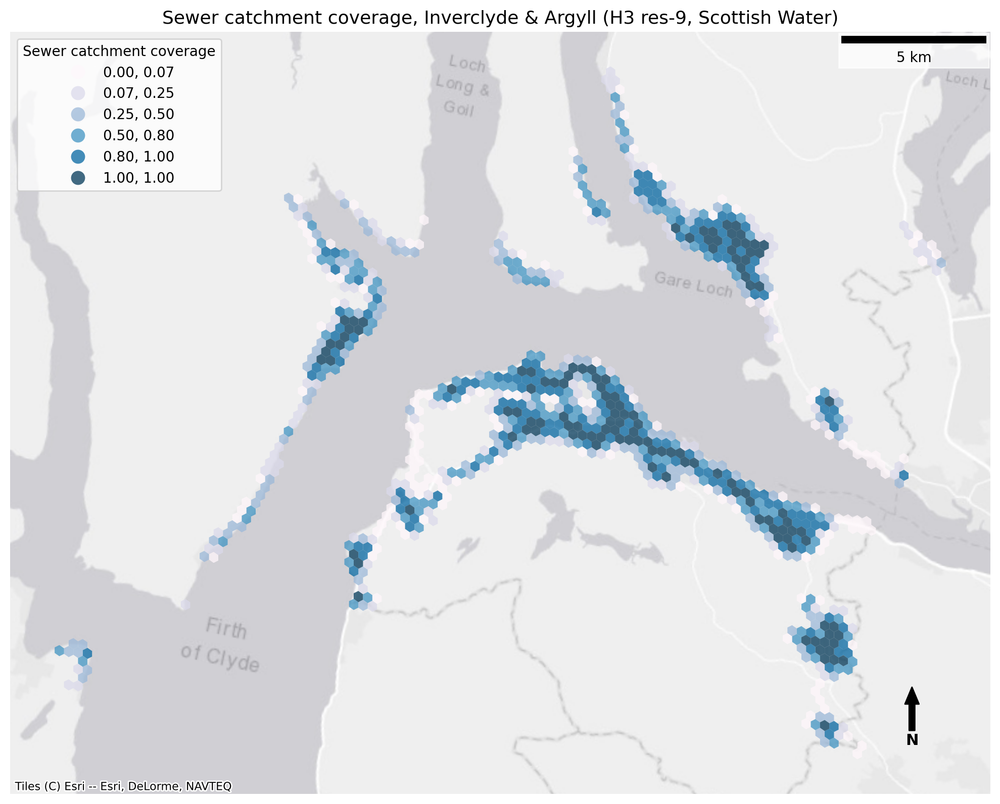

In [54]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

sewer = gpd.read_file("hex_h3_res9_with_sewer.gpkg")
print(sewer.columns.tolist())        # confirm the column name

COL = "sewer_catchment_coverage"

s = sewer[sewer[COL] > 0]
print(f"CRS: {s.crs}   ({len(s):,} hexes with sewer coverage)")

fig, ax = plt.subplots(figsize=(10, 10))
s.plot(
    column=COL,
    scheme="quantiles", k=6,
    cmap="PuBu",
    legend=True,
    legend_kwds={"title": "Sewer catchment coverage", "loc": "upper left"},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)

# cx.add_basemap(ax, crs=s.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)
ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)

ax.set_title("Sewer catchment coverage, Inverclyde & Argyll (H3 res-9, "
             "Scottish Water)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("sewer_coverage_map.png", dpi=200, bbox_inches="tight")
plt.show()

# Slope 
Zonal statistics: slope raster -> H3 res-9 hexagon grid.

Produces per-hex 'mean_slope' = mean slope (in degrees) across the pixels
intersecting the hex.

In [55]:
from pathlib import Path
import glob
import numpy as np
import geopandas as gpd
import rasterio
from rasterio.merge import merge as rio_merge
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.io import MemoryFile
from exactextract import exact_extract

# Inputs
HEX_PATH     =("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_sewer.gpkg")
SLOPE_GLOB   = ("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Sentinel-1_StudyArea/StudyArea_slope_degrees.tif")
OUT_HEX      = Path("hex_h3_res9_with_slope.gpkg")
MOSAIC_TIF   = Path("StudyArea_slope_deg_mosaic_3035.tif")  # cached output

TARGET_CRS   = "EPSG:3035"

# Load hex gridand CRS check 
print(f"Loading hex grid: {HEX_PATH}")
hexes = gpd.read_file(HEX_PATH)
print(f"  {len(hexes):,} hexes, CRS {hexes.crs}")
if hexes.crs is None or hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
    print(f"  reprojected to {TARGET_CRS}")

# Find, mosaic slope tiles 
slope_files = sorted(glob.glob(SLOPE_GLOB))
if not slope_files:
    raise FileNotFoundError(
        f"No files matched '{SLOPE_GLOB}'. Check the export downloaded "
        f"from Google Drive and that it sits in the working directory."
    )
print(f"\nFound {len(slope_files)} slope tile(s):")
for f in slope_files:
    print(f"  {f}")

srcs = [rasterio.open(f) for f in slope_files]

# Mosaic all tiles into one array and transform 
mosaic_arr, mosaic_transform = rio_merge(srcs)
src_crs = srcs[0].crs
src_nodata = srcs[0].nodata
for s in srcs:
    s.close()

print(f"\nMosaic shape: {mosaic_arr.shape}")
print(f"Source CRS:   {src_crs}")
print(f"Nodata:       {src_nodata}")

# Reproject to EPSG:3035 if needed, then write mosaic to disk 
if src_crs is None:
    raise RuntimeError("Slope raster has no CRS defined - cannot proceed.")

if src_crs.to_epsg() != 3035:
    print(f"\nReprojecting mosaic from {src_crs} to {TARGET_CRS}...")
    dst_transform, dst_width, dst_height = calculate_default_transform(
        src_crs, TARGET_CRS,
        mosaic_arr.shape[2], mosaic_arr.shape[1],
        *rasterio.transform.array_bounds(
            mosaic_arr.shape[1], mosaic_arr.shape[2], mosaic_transform
        )
    )
    dst_arr = np.full((1, dst_height, dst_width), src_nodata or -9999,
                       dtype=mosaic_arr.dtype)
    reproject(
        source=mosaic_arr,
        destination=dst_arr,
        src_transform=mosaic_transform,
        src_crs=src_crs,
        dst_transform=dst_transform,
        dst_crs=TARGET_CRS,
        src_nodata=src_nodata,
        dst_nodata=src_nodata or -9999,
        resampling=Resampling.bilinear,   # continuous surface -> bilinear, not nearest
    )
    out_arr, out_transform = dst_arr, dst_transform
    out_crs = TARGET_CRS
else:
    out_arr, out_transform = mosaic_arr, mosaic_transform
    out_crs = src_crs

profile = {
    "driver": "GTiff",
    "height": out_arr.shape[1],
    "width": out_arr.shape[2],
    "count": 1,
    "dtype": out_arr.dtype,
    "crs": out_crs,
    "transform": out_transform,
    "nodata": src_nodata,
    "compress": "lzw",
}

with rasterio.open(MOSAIC_TIF, "w", **profile) as dst:
    dst.write(out_arr)

print(f"Saved mosaic (EPSG:3035): {MOSAIC_TIF}")

#  Sanity check on values 
with rasterio.open(MOSAIC_TIF) as src:
    print(f"\nMosaic raster: {MOSAIC_TIF.name}")
    print(f"  CRS: {src.crs}")
    print(f"  pixel size: {abs(src.transform.a):.1f} x {abs(src.transform.e):.1f} m")
    print(f"  shape: {src.shape}")
    print(f"  nodata: {src.nodata}")
    sample = src.read(1, window=rasterio.windows.Window(
        0, 0, min(1000, src.width), min(1000, src.height)))
    valid = sample[sample != (src.nodata if src.nodata is not None else -9999)]
    if valid.size:
        print(f"  sample values: min={valid.min():.2f} max={valid.max():.2f} "
              f"mean={valid.mean():.2f}")

# Zonal statistics  
print("\nRunning exactextract (mean + count)...")
res = exact_extract(
    rast=str(MOSAIC_TIF),
    vec=hexes,
    ops=["mean", "count"],
    output="pandas",
    include_cols=["h3_id"],
)

hexes = hexes.merge(res, on="h3_id", how="left")
hexes = hexes.rename(columns={"mean": "mean_slope",
                              "count": "slope_pixel_count"})
hexes["slope_pixel_count"] = np.round(hexes["slope_pixel_count"]).astype(int)

# Audit 
print("\n=== MEAN SLOPE AUDIT ===")
print(f"Hexes total:               {len(hexes):,}")
print(f"Hexes with valid slope:    {int(hexes['mean_slope'].notna().sum()):,}")
print(f"Hexes with NaN:            {int(hexes['mean_slope'].isna().sum()):,}")
if hexes['mean_slope'].isna().any():
    print("  (NaN = no slope pixels intersect - check raster coverage of AOI)")

print("\nMean slope distribution (degrees):")
s = hexes["mean_slope"].dropna()
print(f"  mean:     {s.mean():.2f}")
print(f"  median:   {s.median():.2f}")
print(f"  sd:       {s.std():.2f}")
print(f"  min:      {s.min():.2f}")
for q in [0.05, 0.25, 0.50, 0.75, 0.95]:
    print(f"  p{int(q*100):02d}:      {s.quantile(q):.2f}")
print(f"  max:      {s.max():.2f}")

if s.median() > 15:
    print("  WARNING: median slope is unusually high - check the units of "
          "the input raster (degrees vs radians vs slope %)")


hexes.to_file(OUT_HEX, driver="GPKG")
print(f"\nSaved: {OUT_HEX}")

Loading hex grid: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_sewer.gpkg
  4,201 hexes, CRS EPSG:3035

Found 1 slope tile(s):
  /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Sentinel-1_StudyArea/StudyArea_slope_degrees.tif

Mosaic shape: (1, 2575, 3039)
Source CRS:   EPSG:3035
Nodata:       None
Saved mosaic (EPSG:3035): StudyArea_slope_deg_mosaic_3035.tif

Mosaic raster: StudyArea_slope_deg_mosaic_3035.tif
  CRS: EPSG:3035
  pixel size: 10.0 x 10.0 m
  shape: (2575, 3039)
  nodata: None
  sample values: min=nan max=nan mean=nan

Running exactextract (mean + count)...

=== MEAN SLOPE AUDIT ===
Hexes total:               4,201
Hexes with valid slope:    4,160
Hexes with NaN:            41
  (NaN = no slope pixels intersect - check raster coverage of AOI)

Mean slope distribution (degrees):
  mean:     8.20
  median:   6.92
  sd:       5.00
  min:      0.00
  p05:      2.51
  p25:      4.60
  p50:      6.92
  p75:      10.51
  p95:      18.67

In [56]:
nan_hexes = hexes[hexes["mean_slope"].isna()]
print(nan_hexes[["h3_id"]])
nan_hexes.to_file("nan_slope_hexes.gpkg", driver="GPKG")

                h3_id
7     89190906e6fffff
54    8919093ac57ffff
305   8919093b0abffff
320   89190906a93ffff
367   8919093a20bffff
388   89190904493ffff
389   8919090d107ffff
797   89190906267ffff
873   89190906adbffff
991   89190906843ffff
1010  8919090d567ffff
1077  8919093ac1bffff
1134  8919093b237ffff
1192  891909744abffff
1222  8919093b3dbffff
1254  8919093b06fffff
1425  891909044a7ffff
1494  8919093a173ffff
1508  891909313a3ffff
1614  89190906e67ffff
1943  8919090eb93ffff
2031  8919093a123ffff
2524  8919093a243ffff
2528  89190914b2fffff
2634  8919093a233ffff
2719  891909315bbffff
2891  891909045afffff
3020  8919093ac53ffff
3077  8919093b503ffff
3097  8919093b52fffff
3201  8919097609bffff
3337  8919093a357ffff
3370  891909744d7ffff
3427  8919090e667ffff
3564  8919093b5c7ffff
3685  89190906803ffff
3724  8919090626fffff
3745  8919093a30bffff
3849  891909068afffff
3990  8919093a353ffff
4195  8919093b22bffff


In [57]:
import geopandas as gpd
import rasterio
from shapely.geometry import box

hexes = gpd.read_file("hex_h3_res9_with_slope.gpkg")
nan_hexes = hexes[hexes["h3_id"].isin(["891909313a3ffff", "891909744d7ffff"])]

with rasterio.open("StudyArea_slope_deg_mosaic_3035.tif") as src:
    raster_bounds = box(*src.bounds)

print(nan_hexes[["h3_id", "geometry"]])
print("\nRaster bounds:", raster_bounds.bounds)

for idx, row in nan_hexes.iterrows():
    overlap = row.geometry.intersection(raster_bounds)
    print(f"\n{row['h3_id']}: overlap area = {overlap.area:.1f} m² "
          f"out of hex area = {row.geometry.area:.1f} m²")

                h3_id                                           geometry
1508  891909313a3ffff  POLYGON ((3410407.121 3730439.269, 3410245.971...
3370  891909744d7ffff  POLYGON ((3386046.459 3735997.326, 3385884.797...

Raster bounds: (3386260.0, 3730450.0, 3416650.0, 3756200.0)

891909313a3ffff: overlap area = 0.0 m² out of hex area = 92916.3 m²

891909744d7ffff: overlap area = 0.0 m² out of hex area = 93269.0 m²


['h3_id', 'sewer_catchment_coverage', 'mean_slope', 'slope_pixel_count', 'geometry']
CRS: EPSG:3035   (4,160 hexes with slope)


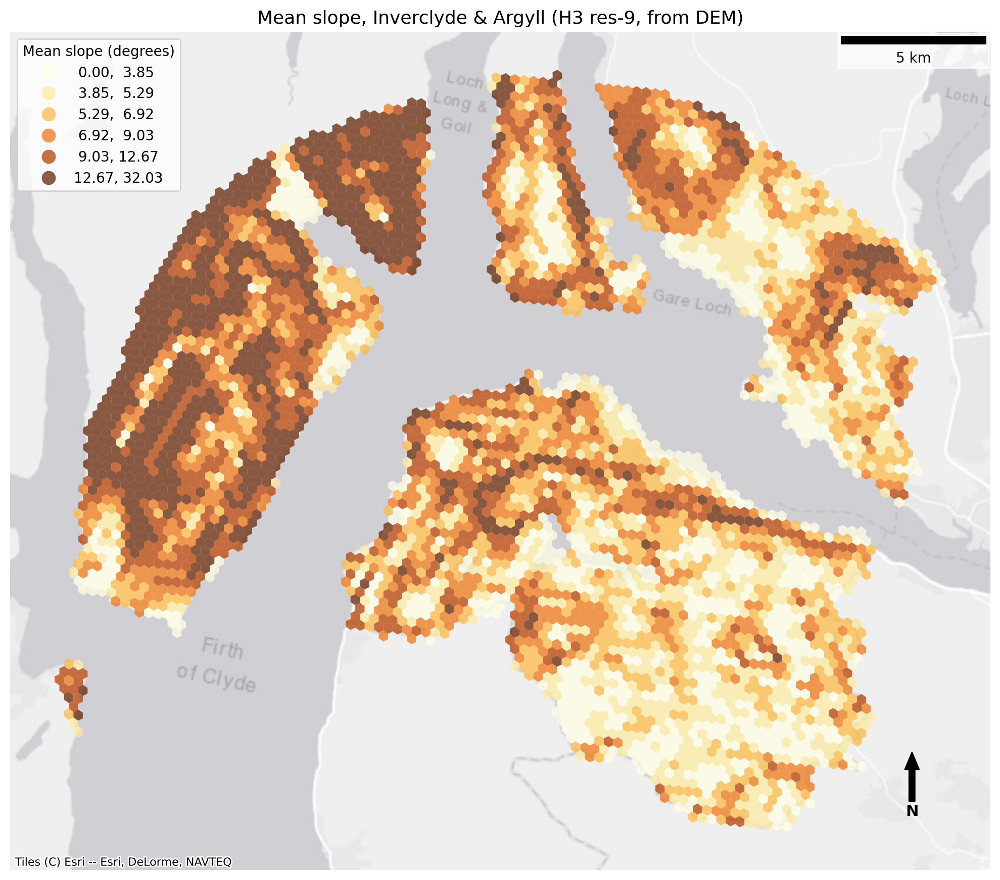

In [59]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

slope = gpd.read_file("hex_h3_res9_with_slope.gpkg")
print(slope.columns.tolist())        # confirm the column name

COL = "mean_slope"

# Slope is defined everywhere (land), so plot all hexes - no > 0 filter
s = slope[slope[COL].notna()]
print(f"CRS: {s.crs}   ({len(s):,} hexes with slope)")

fig, ax = plt.subplots(figsize=(10, 10))
s.plot(
    column=COL,
    scheme="quantiles", k=6,
    cmap="YlOrBr",
    legend=True,
    legend_kwds={"title": "Mean slope (degrees)", "loc": "upper left"},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)

#cx.add_basemap(ax, crs=s.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)

ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)

ax.set_title("Mean slope, Inverclyde & Argyll (H3 res-9, from DEM)",
             fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("slope_map.png", dpi=200, bbox_inches="tight")
plt.show()

# SIMD deciles

In [60]:
from pathlib import Path
import geopandas as gpd

# Inputs
HEX_PATH        = Path("hex_h3_res9_with_slope.gpkg")
SIMD_PATH  = ("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/SG_SIMD_2020_raw 2/SG_SIMD_2020.shp")
OUT_HEX         = Path("hex_h3_res9_with_slope_simd.gpkg")

TARGET_CRS      = "EPSG:3035"
LOW_COVERAGE_THRESHOLD = 0.10   # hexes with <10% land coverage -> NaN + flag

# Load and CRS check 
print(f"Loading hex grid: {HEX_PATH}")
hexes = gpd.read_file(HEX_PATH)
print(f"  {len(hexes):,} hexes, CRS {hexes.crs}")
if hexes.crs is None or hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
    print(f"  reprojected to {TARGET_CRS}")

print(f"\nLoading SIMD data zones: {SIMD_PATH}")
simd = gpd.read_file(SIMD_PATH)
print(f"  {len(simd):,} data zones, CRS {simd.crs}")
if simd.crs is None or simd.crs.to_epsg() != 3035:
    simd = simd.to_crs(TARGET_CRS)
    print(f"  reprojected to {TARGET_CRS}")

# Identify key SIMD  columns 
rank_col   = next((c for c in simd.columns if c.lower() in ("rankv2", "rank")), None)
decile_col = next((c for c in simd.columns if c.lower() in ("decilev2", "decile")), None)

if rank_col is None or decile_col is None:
    raise KeyError(
        f"Could not find rank/decile columns automatically. "
        f"Available columns: {list(simd.columns)}"
    )

print(f"\nUsing columns -> rank: {rank_col}, decile: {decile_col}")

simd = simd[[rank_col, decile_col, "geometry"]].copy()

# Area-weighted overaly join (coverage-normalized)
print("\nRunning area-weighted overlay (hex x SIMD data zones)...")

hexes = hexes.reset_index(drop=True)
hexes["_hex_area"] = hexes.geometry.area

overlay = gpd.overlay(hexes, simd, how="intersection", keep_geom_type=False)
overlay["_piece_area"] = overlay.geometry.area
overlay["_weight"] = overlay["_piece_area"] / overlay["_hex_area"]

overlay[f"_w_{rank_col}"]   = overlay[rank_col]   * overlay["_weight"]
overlay[f"_w_{decile_col}"] = overlay[decile_col] * overlay["_weight"]

agg = overlay.groupby("h3_id").agg(
    _sum_weight=("_weight", "sum"),
    **{f"_sum_w_{rank_col}":   (f"_w_{rank_col}", "sum")},
    **{f"_sum_w_{decile_col}": (f"_w_{decile_col}", "sum")},
).reset_index()

# Coverage-normalized area-weighted average: Divide the area-weighted sum by the total covered fraction, NOT the full hex area, so partial-coverage hexes reflect only their land portion.
agg["simd_coverage_fraction"] = agg["_sum_weight"]
agg["simd_rank"]   = agg[f"_sum_w_{rank_col}"]   / agg["_sum_weight"]
agg["simd_decile"] = agg[f"_sum_w_{decile_col}"] / agg["_sum_weight"]

result = agg[["h3_id", "simd_rank", "simd_decile", "simd_coverage_fraction"]]

hexes = hexes.drop(columns=["_hex_area"]).merge(result, on="h3_id", how="left")

# Flag and null out low - coverege hexes 
hexes["simd_low_coverage_flag"] = hexes["simd_coverage_fraction"] < LOW_COVERAGE_THRESHOLD

n_flagged = int(hexes["simd_low_coverage_flag"].sum())
print(f"\nFlagging {n_flagged:,} hexes with <{int(LOW_COVERAGE_THRESHOLD*100)}% "
      f"land coverage as unreliable (setting SIMD values to NaN)")

hexes.loc[hexes["simd_low_coverage_flag"], ["simd_rank", "simd_decile"]] = None

#  Audit
print("\n=== SIMD JOIN AUDIT ===")
print(f"Hexes total:                    {len(hexes):,}")
print(f"Hexes with valid SIMD decile:     {int(hexes['simd_decile'].notna().sum()):,}")
print(f"Hexes with NaN (low coverage):  {int(hexes['simd_decile'].isna().sum()):,}")

low_cov = hexes[hexes["simd_coverage_fraction"] < 0.95]
print(f"Hexes with <95% SIMD coverage (partial edge hexes): {len(low_cov):,}")

s = hexes["simd_decile"].dropna()
print("\nSIMD decile distribution (1 = most deprived, 10 = least deprived):")
print(f"  mean:   {s.mean():.1f}")
print(f"  median: {s.median():.1f}")
print(f"  sd:     {s.std():.1f}")
print(f"  min:    {s.min():.1f}")
print(f"  max:    {s.max():.1f}")

if s.min() < 1:
    print("  WARNING: min rank below 1 - check overlay for residual coverage "
          "dilution or invalid geometries.")


hexes.to_file(OUT_HEX, driver="GPKG")
print(f"\nSaved: {OUT_HEX}")

Loading hex grid: hex_h3_res9_with_slope.gpkg
  4,201 hexes, CRS EPSG:3035

Loading SIMD data zones: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/SG_SIMD_2020_raw 2/SG_SIMD_2020.shp
  6,976 data zones, CRS EPSG:27700
  reprojected to EPSG:3035

Using columns -> rank: Rankv2, decile: Decilev2

Running area-weighted overlay (hex x SIMD data zones)...

Flagging 28 hexes with <10% land coverage as unreliable (setting SIMD values to NaN)

=== SIMD JOIN AUDIT ===
Hexes total:                    4,201
Hexes with valid SIMD decile:     4,173
Hexes with NaN (low coverage):  28
Hexes with <95% SIMD coverage (partial edge hexes): 340

SIMD decile distribution (1 = most deprived, 10 = least deprived):
  mean:   6.3
  median: 6.0
  sd:     1.7
  min:    1.0
  max:    10.0

Saved: hex_h3_res9_with_slope_simd.gpkg


In [61]:
import geopandas as gpd
gdf = gpd.read_file("hex_h3_res9_with_slope_simd.gpkg")   # the SIMD join output
print([c for c in gdf.columns if "simd" in c.lower()])

gdf.info()                                          # non-null counts + dtypes
print(gdf.describe())                               # numeric column stats (min/max/mean etc.)
print(gdf.drop(columns="geometry").isna().sum())    # missing values per column

['simd_rank', 'simd_decile', 'simd_coverage_fraction', 'simd_low_coverage_flag']
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4201 entries, 0 to 4200
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   h3_id                     4201 non-null   str     
 1   sewer_catchment_coverage  4201 non-null   float64 
 2   mean_slope                4160 non-null   float64 
 3   slope_pixel_count         4201 non-null   int64   
 4   simd_rank                 4173 non-null   float64 
 5   simd_decile               4173 non-null   float64 
 6   simd_coverage_fraction    4201 non-null   float64 
 7   simd_low_coverage_flag    4201 non-null   bool    
 8   geometry                  4201 non-null   geometry
dtypes: bool(1), float64(5), geometry(1), int64(1), str(1)
memory usage: 266.8 KB
       sewer_catchment_coverage   mean_slope  slope_pixel_count    simd_rank  \
count               4201.00

columns: ['h3_id', 'sewer_catchment_coverage', 'mean_slope', 'slope_pixel_count', 'simd_rank', 'simd_decile', 'simd_coverage_fraction', 'simd_low_coverage_flag', 'geometry']
CRS EPSG:3035   4,173 hexes   simd_rank range: 1 to 6884
Saved: simd_rank_map.png


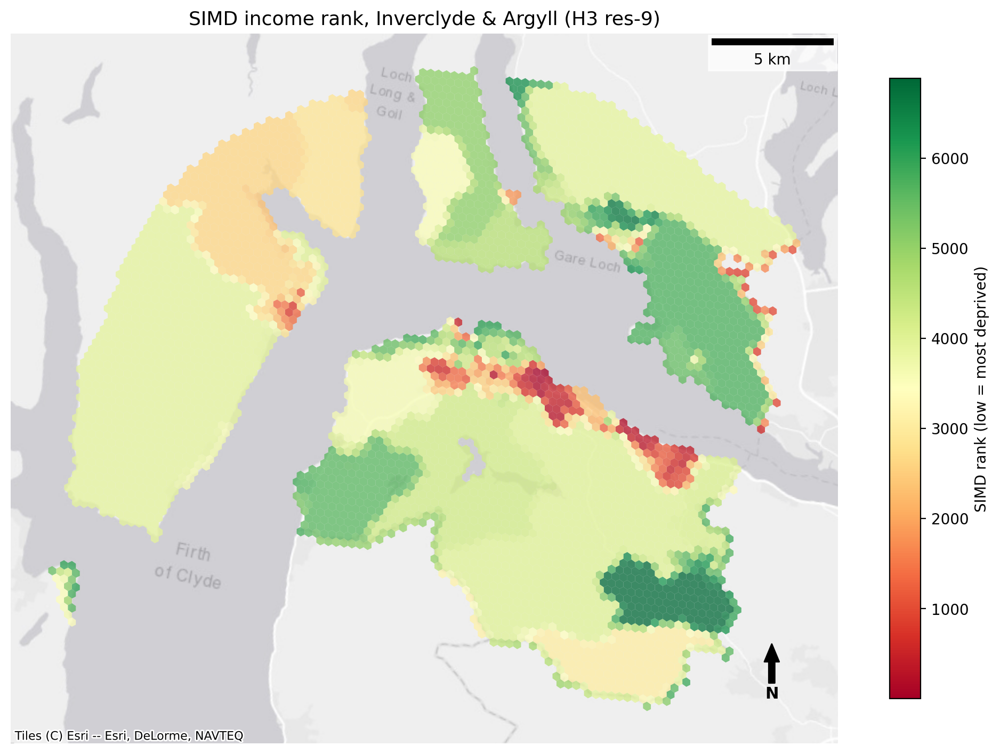

In [63]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib_scalebar.scalebar import ScaleBar  

simd = gpd.read_file("hex_h3_res9_with_slope_simd.gpkg")
print("columns:", simd.columns.tolist())

COL = "simd_rank"

s = simd[simd[COL].notna()].copy()
print(f"CRS {s.crs}   {len(s):,} hexes   "
      f"{COL} range: {s[COL].min():.0f} to {s[COL].max():.0f}")

fig, ax = plt.subplots(figsize=(10, 10))

# Continuous rank, no manual bins. Low rank = most deprived = red.
s.plot(
    column=COL,
    cmap="RdYlGn",
    legend=True,
    legend_kwds={"label": "SIMD rank (low = most deprived)", "shrink": 0.6},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)

#cx.add_basemap(ax, crs=s.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)

ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N", xy=(0.92, 0.14), xytext=(0.92, 0.07), xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center", va="center", fontsize=11, fontweight="bold", zorder=6,
)
ax.set_title("SIMD income rank, Inverclyde & Argyll (H3 res-9)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("simd_rank_map.png", dpi=200, bbox_inches="tight")
print("Saved: simd_rank_map.png")
plt.show()

In [64]:
import geopandas as gpd
simd = gpd.read_file("hex_h3_res9_with_slope_simd.gpkg")
print(simd.columns.tolist())

['h3_id', 'sewer_catchment_coverage', 'mean_slope', 'slope_pixel_count', 'simd_rank', 'simd_decile', 'simd_coverage_fraction', 'simd_low_coverage_flag', 'geometry']


# Distance from hex centroid to nearest main river

Produces per-hex 'dist_to_river_m' = Euclidean distance (metres) from the hexagon's centroid to the nearest point on the main river network.

In [65]:
from pathlib import Path
import geopandas as gpd
import numpy as np
from shapely.ops import nearest_points

# Inputs 
HEX_PATH    = Path("hex_h3_res9_with_slope_simd.gpkg")
RIVER_PATH =("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Download_Floding_rivers_greenspace_2997978/open-rivers_6428742/WatercourseLink.shp")
OUT_HEX    = Path("hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg")

TARGET_CRS = "EPSG:3035"

# Load and CRS check 
print(f"Loading hex grid: {HEX_PATH}")
hexes = gpd.read_file(HEX_PATH)
print(f"  {len(hexes):,} hexes, CRS {hexes.crs}")
if hexes.crs is None or hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
    print(f"  reprojected to {TARGET_CRS}")

print(f"\nLoading river network: {RIVER_PATH}")
rivers = gpd.read_file(RIVER_PATH)
print(f"  {len(rivers):,} river features, CRS {rivers.crs}")
if rivers.crs is None or rivers.crs.to_epsg() != 3035:
    rivers = rivers.to_crs(TARGET_CRS)
    print(f"  reprojected to {TARGET_CRS}")

# Keep only line geometries, if the source has polygons (river banks),convert to boundary lines so distance is measured to the channel edge.
geom_types = rivers.geometry.geom_type.unique()
print(f"  geometry types present: {geom_types}")
if any(t in ("Polygon", "MultiPolygon") for t in geom_types):
    print("  converting polygon river geometries to boundary lines...")
    rivers["geometry"] = rivers.geometry.boundary

# Dissolve to a single geometry for fast nearest-distance computation
river_union = rivers.union_all() if hasattr(rivers, "union_all") else rivers.unary_union
print(f"  dissolved river network into a single geometry for distance calc")

#  Centroids 
hexes["_centroid"] = hexes.geometry.centroid

# Nearest ditstance calculation
# Use geopandas' built-in sindex-based nearest join for speed on 4k+ hexes,rather than a naive O(n*m) loop with nearest_points().
print("\nCalculating distance to nearest river feature...")

centroids_gdf = gpd.GeoDataFrame(
    hexes[["h3_id"]], geometry=hexes["_centroid"], crs=TARGET_CRS
)

# sjoin_nearest gives nearest feature + distance in one call (geopandas >= 0.10)
nearest = gpd.sjoin_nearest(
    centroids_gdf, rivers[["geometry"]], how="left", distance_col="dist_to_river_m"
)

# If a centroid ties on multiple equally-near river segments, keep the first
nearest = nearest.drop_duplicates(subset="h3_id", keep="first")

hexes = hexes.drop(columns=["_centroid"]).merge(
    nearest[["h3_id", "dist_to_river_m"]], on="h3_id", how="left"
)

# Audit 
print("\n=== DISTANCE TO RIVER AUDIT ===")
print(f"Hexes total:                 {len(hexes):,}")
print(f"Hexes with valid distance:   {int(hexes['dist_to_river_m'].notna().sum()):,}")
print(f"Hexes with NaN:              {int(hexes['dist_to_river_m'].isna().sum()):,}")

print("\nDistance to nearest river (m):")
s = hexes["dist_to_river_m"].dropna()
print(f"  mean:     {s.mean():.1f}")
print(f"  median:   {s.median():.1f}")
print(f"  sd:       {s.std():.1f}")
print(f"  min:      {s.min():.1f}")
for q in [0.05, 0.25, 0.50, 0.75, 0.95]:
    print(f"  p{int(q*100):02d}:      {s.quantile(q):.1f}")
print(f"  max:      {s.max():.1f}")

hexes.to_file(OUT_HEX, driver="GPKG")
print(f"\nSaved: {OUT_HEX}")

Loading hex grid: hex_h3_res9_with_slope_simd.gpkg
  4,201 hexes, CRS EPSG:3035

Loading river network: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/Download_Floding_rivers_greenspace_2997978/open-rivers_6428742/WatercourseLink.shp
  193,040 river features, CRS EPSG:27700
  reprojected to EPSG:3035
  geometry types present: <StringArray>
['LineString']
Length: 1, dtype: str
  dissolved river network into a single geometry for distance calc

Calculating distance to nearest river feature...

=== DISTANCE TO RIVER AUDIT ===
Hexes total:                 4,201
Hexes with valid distance:   4,201
Hexes with NaN:              0

Distance to nearest river (m):
  mean:     440.7
  median:   343.3
  sd:       369.8
  min:      0.2
  p05:      30.1
  p25:      156.3
  p50:      343.3
  p75:      624.5
  p95:      1194.6
  max:      2495.3

Saved: hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg


['h3_id', 'sewer_catchment_coverage', 'mean_slope', 'slope_pixel_count', 'simd_rank', 'simd_decile', 'simd_coverage_fraction', 'simd_low_coverage_flag', 'dist_to_river_m', 'geometry']
CRS: EPSG:3035   (4,201 hexes)   range 0.00-2.50 km


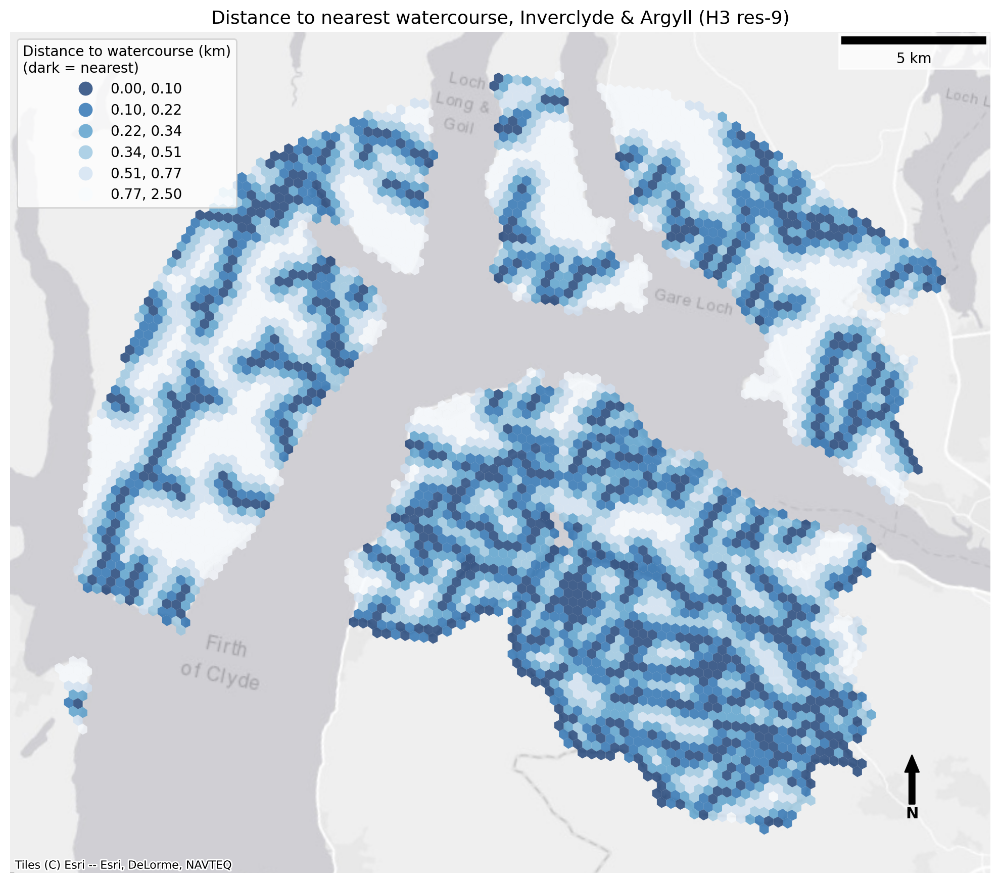

In [67]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as cx

riv = gpd.read_file("hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg")
print(riv.columns.tolist())         

COL = "dist_to_river_m"

# Distance is defined for every hex, filter only genuine NaN, not zeros
r = riv[riv[COL].notna()].copy()
r[COL] = r[COL] / 1000.0             # metres -> km for a readable legend
print(f"CRS: {r.crs}   ({len(r):,} hexes)   "
      f"range {r[COL].min():.2f}-{r[COL].max():.2f} km")

fig, ax = plt.subplots(figsize=(10, 10))
r.plot(
    column=COL,
    scheme="quantiles", k=6,
    cmap="Blues_r",                  # reversed: dark = NEAR a watercourse
    legend=True,
    legend_kwds={"title": "Distance to watercourse (km)\n(dark = nearest)",
                 "loc": "upper left"},
    alpha=0.75,
    edgecolor="none",
    ax=ax,
)

#cx.add_basemap(ax, crs=r.crs, source=cx.providers.CartoDB.Positron)
cx.add_basemap(ax, crs=pop.crs, source=cx.providers.Esri.WorldGrayCanvas)

ax.add_artist(ScaleBar(1, units="m", location="upper right", box_alpha=0.7))
ax.annotate(
    "N",
    xy=(0.92, 0.14),
    xytext=(0.92, 0.07),
    xycoords="axes fraction",
    arrowprops=dict(facecolor="black", width=4, headwidth=10),
    ha="center",
    va="center",
    fontsize=11,
    fontweight="bold",
    zorder=6,
)

ax.set_title("Distance to nearest watercourse, Inverclyde & Argyll "
             "(H3 res-9)", fontsize=13)
ax.set_axis_off()
plt.tight_layout()
plt.savefig("dist_watercourse_map.png", dpi=200, bbox_inches="tight")
plt.show()

# Green-space fraction per H3 res-9 hexagon -- FAST version.

In [68]:
from pathlib import Path

import geopandas as gpd
import numpy as np
import pandas as pd
import shapely

# Inputs
HEX_PATH  = Path("hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg")
GREEN_SHP = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/DATA/"
                 "Download_Floding_rivers_greenspace_2997978/"
                 "open-greenspace_6428741/GB_GreenspaceSite.shp")
OUT_HEX   = Path("hex_h3_res9_with_greenspace.gpkg")

TARGET_CRS = "EPSG:3035"

# Hex grid 
print(f"Loading hex grid: {HEX_PATH}")
hexes = gpd.read_file(HEX_PATH)
if hexes.crs is None:
    raise RuntimeError("Hex grid has no CRS.")
if hexes.crs.to_epsg() != 3035:
    hexes = hexes.to_crs(TARGET_CRS)
print(f"  {len(hexes):,} hexes")

hexes["hex_area_m2"] = hexes.geometry.area

# Greenspace 
# bbox filter at the GDAL driver level: The GB-wide file is never fully read.
aoi = gpd.GeoSeries([shapely.box(*hexes.total_bounds)], crs=TARGET_CRS)
bbox_27700 = tuple(aoi.to_crs("EPSG:27700").total_bounds)

print("Reading greenspace within AOI bbox...")
green = gpd.read_file(GREEN_SHP, bbox=bbox_27700, columns=["function"])
print(f"  {len(green):,} sites in AOI")
if len(green) == 0:
    raise RuntimeError("No greenspace intersects the AOI.")

green = green.to_crs(TARGET_CRS)
green["geometry"] = shapely.make_valid(green.geometry.values)   # cheap repair

# Index-backed pairing 
print("Spatial join (index-backed)...")
pairs = gpd.sjoin(
    hexes[["h3_id", "geometry"]],
    green[["geometry"]],
    how="inner",
    predicate="intersects",
)
print(f"  {len(pairs):,} hex/greenspace pairs to intersect "
      f"(vs {len(hexes) * len(green):,} brute force)")

# Vectorised intersection
hex_geom = hexes.geometry.values[
    hexes.index.get_indexer(pairs.index)
]
green_geom = green.geometry.values[pairs["index_right"].values]

print("Intersecting pairs...")
clipped = shapely.intersection(hex_geom, green_geom)

df = pd.DataFrame({"h3_id": pairs["h3_id"].values, "geom": clipped})

# Per-hex union, then area 
# Overlapping OS greenspace sites would otherwise be counted twice and push the fraction above 1.0.
# Union only WITHIN each hex: thousands of tiny unions, not one giant one.
print("Dissolving within hexes...")
green_m2 = (
    df.groupby("h3_id")["geom"]
      .apply(lambda s: shapely.area(shapely.union_all(s.values)))
      .rename("greenspace_m2")
      .reset_index()
)

# Assemble 
hexes = hexes.merge(green_m2, on="h3_id", how="left")
hexes["greenspace_m2"] = hexes["greenspace_m2"].fillna(0.0)
hexes["greenspace_frac"] = (hexes["greenspace_m2"] / hexes["hex_area_m2"]).clip(0, 1)

# Audit 
s = hexes["greenspace_frac"]
print("\n=== GREEN-SPACE FRACTION AUDIT ===")
print(f"Hexes:                 {len(hexes):,}")
print(f"With greenspace:       {int((s > 0).sum()):,} ({100 * (s > 0).mean():.1f}%)")
print(f"Entirely green (>.99): {int((s > 0.99).sum()):,}")
print(f"  mean   {s.mean():.3f}   median {s.median():.3f}   sd {s.std():.3f}")
for q in (0.05, 0.25, 0.50, 0.75, 0.95):
    print(f"  p{int(q * 100):02d}    {s.quantile(q):.3f}")
print(f"  max    {s.max():.3f}")

hexes.to_file(OUT_HEX, driver="GPKG")
print(f"\nSaved: {OUT_HEX}")

Loading hex grid: hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg
  4,201 hexes
Reading greenspace within AOI bbox...
  652 sites in AOI
Spatial join (index-backed)...
  699 hex/greenspace pairs to intersect (vs 2,739,052 brute force)
Intersecting pairs...
Dissolving within hexes...

=== GREEN-SPACE FRACTION AUDIT ===
Hexes:                 4,201
With greenspace:       444 (10.6%)
Entirely green (>.99): 5
  mean   0.019   median 0.000   sd 0.098
  p05    0.000
  p25    0.000
  p50    0.000
  p75    0.000
  p95    0.073
  max    1.000

Saved: hex_h3_res9_with_greenspace.gpkg


In [69]:
from pathlib import Path
import geopandas as gpd

chain = gpd.read_file("hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg")
print(sorted(chain.columns))         

SPLIT = {
    "hex_h3_res9_with_s1.gpkg":         ["s1_flood_frac"],
    "hex_h3_res9_with_sewer.gpkg":      ["sewer_catchment_coverage"],
    "hex_h3_res9_with_slope.gpkg":      ["mean_slope"],
    "hex_h3_res9_with_simd.gpkg":       ["simd_income_dec"],
    "hex_h3_res9_with_greenspace.gpkg": ["greenspace_frac"],
    "hex_h3_res9_with_river.gpkg":      ["dist_watercourse"],
}

for path, cols in SPLIT.items():
    have = [c for c in cols if c in chain.columns]
    if not have:
        print(f"skip {path}: none of {cols} in chain file")
        continue
    chain[["h3_id"] + have + ["geometry"]].to_file(path, driver="GPKG")
    print(f"wrote {path}: {have}")

['dist_to_river_m', 'geometry', 'h3_id', 'mean_slope', 'sewer_catchment_coverage', 'simd_coverage_fraction', 'simd_decile', 'simd_low_coverage_flag', 'simd_rank', 'slope_pixel_count']
skip hex_h3_res9_with_s1.gpkg: none of ['s1_flood_frac'] in chain file
wrote hex_h3_res9_with_sewer.gpkg: ['sewer_catchment_coverage']
wrote hex_h3_res9_with_slope.gpkg: ['mean_slope']
skip hex_h3_res9_with_simd.gpkg: none of ['simd_income_dec'] in chain file
skip hex_h3_res9_with_greenspace.gpkg: none of ['greenspace_frac'] in chain file
skip hex_h3_res9_with_river.gpkg: none of ['dist_watercourse'] in chain file


In [70]:
import geopandas as gpd

hexes = gpd.read_file("hex_h3_res9_with_slope_simd.gpkg")

zero_rank = hexes[hexes["simd_rank"] == 0.0]
print(f"Hexes with simd_rank == 0.0: {len(zero_rank)}")
print(zero_rank[["h3_id", "simd_rank", "simd_coverage_fraction"]])

low_cov = hexes[hexes["simd_coverage_fraction"] < 0.95].sort_values("simd_coverage_fraction")
print(f"\nLowest coverage hexes:")
print(low_cov[["h3_id", "simd_rank", "simd_coverage_fraction"]].head(15))

Hexes with simd_rank == 0.0: 0
Empty DataFrame
Columns: [h3_id, simd_rank, simd_coverage_fraction]
Index: []

Lowest coverage hexes:
                h3_id  simd_rank  simd_coverage_fraction
670   89190904353ffff        NaN                0.000169
1668  89190906b8fffff        NaN                0.000687
4190  89190906b87ffff        NaN                0.000737
42    89190906b13ffff        NaN                0.001568
873   89190906adbffff        NaN                0.003491
3296  89190976497ffff        NaN                0.003625
991   89190906843ffff        NaN                0.004964
1143  89190904c8bffff        NaN                0.005316
1165  8919090e2abffff        NaN                0.007482
3234  89190905b13ffff        NaN                0.009330
212   8919090417bffff        NaN                0.019963
1425  891909044a7ffff        NaN                0.020559
3201  8919097609bffff        NaN                0.020627
1681  89190914b0bffff        NaN                0.022752
3427  891909

In [87]:
import geopandas as gpd

gdf = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_s1.gpkg")
print(gdf.columns.tolist())

['h3_id', 'hex_area_m2', 'land_area_m2', 'land_frac', 's1_flood_area_m2', 's1_flood_pixels', 's1_flood_frac', 's1_flood_frac_full', 'geometry']


# Assemble hex_h3_res9_joined.gpkg from all per-hex predictor outputs 

The code below reads every per-hex predictor file, joins the required columns on h3_id, audits completeness and missingness, and writes the file the mGWR cleaning pipeline expects.

In [93]:
a = "hex_h3_res9_with_s1.gpkg" in os.listdir()
print(a)

False


In [89]:
from pathlib import Path

import geopandas as gpd
import pandas as pd

# Inputs 
BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9.gpkg")
OUT = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")
TARGET_CRS = "EPSG:3035"

Y_COL    = "s1_flood_frac"        # Sentinel-1 observed flood fraction (Step A Y)
SEPA_COL = "sepa_flood_frac"      # Step B dependent; carried through, NOT an mGWR predictor

PREDICTORS = [
    "pop_density",                # exposure
    "building_footprint_frac",    # exposure
    "simd_rank",                  # sensitivity
    "age_dep_ratio",              # sensitivity (dependent-population share, 0-1)
    "greenspace_frac",            # adaptive capacity
    "sewer_catchment_coverage",   # adaptive capacity (catchment coverage, 0-1)
    "impervious_pct",             # hazard control
    "mean_slope",                 # hazard control
    "dist_to_river_m",            # hazard control
]

# simd_decile is carried through for mapping / stratification but is not an mGWR
# predictor (simd_rank is the continuous form.
CARRY_THROUGH = ["simd_decile"]

REQUIRED = [Y_COL, SEPA_COL] + PREDICTORS + CARRY_THROUGH


ALIASES = {
    "greenspace_frac": ["greenspace_frac", "greenspace_fraction"],
    "dist_to_river_m": ["dist_to_river_m", "dist_watercourse"],
}

# Every source file, and which canonical columns to pull from it.
# Missing files are skipped with a warning; missing columns are reported.
PREDICTOR_SOURCES = [
    #(Path("hex_h3_res9_with_s1.gpkg"),           ["s1_flood_frac"]),
    #(Path("hex_h3_res9_with_sepa_eligible.gpkg"),         ["sepa_flood_frac"]),
    (Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_s1.gpkg"),            ["s1_flood_frac"]),
    (Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_with_sepa_eligible.gpkg"), ["sepa_flood_frac"]),
    (Path("hex_h3_res9_with_sewer.gpkg"),     ["sewer_catchment_coverage"]),
    (Path("hex_h3_res9_with_slope.gpkg"),        ["mean_slope"]),
    (Path("hex_h3_res9_with_hrl_imperv.gpkg"),   ["impervious_pct"]),
    (Path("hex_h3_res9_with_pop.gpkg"),          ["pop_density", "age_dep_ratio"]),
    (Path("hex_h3_res9_with_buildings.gpkg"),    ["building_footprint_frac"]),
    (Path("hex_h3_res9_with_slope_simd.gpkg"),   ["simd_rank", "simd_decile"]),
    (Path("hex_h3_res9_with_greenspace.gpkg"),   ["greenspace_frac"]),
    (Path("hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg"),
                                                 ["dist_to_river_m"]),
]

#  Load base 
print(f"Loading base hex grid: {BASE}")
if not BASE.exists():
    raise FileNotFoundError(f"{BASE} not found. Run build_h3_hex_grid.py first.")

gdf = gpd.read_file(BASE)
print(f"  {len(gdf):,} hexes, CRS: {gdf.crs}")

if gdf.crs is None or gdf.crs.to_epsg() != 3035:
    gdf = gdf.to_crs(TARGET_CRS)
    print(f"  reprojected to {TARGET_CRS}")

if "h3_id" not in gdf.columns:
    raise KeyError(f"Base grid has no 'h3_id'. Columns: {list(gdf.columns)}")
if gdf["h3_id"].isna().any():
    raise ValueError("Base hex grid has null h3_id - bug in build script.")
if not gdf["h3_id"].is_unique:
    raise ValueError("Base hex grid has duplicate h3_id - bug in build script.")

base_ids = set(gdf["h3_id"])
gdf = gdf.set_index("h3_id", drop=False)

# Join (exact names, with the two-column alias exception)
def resolve(canonical: str, src_cols) -> str | None:
    """Find which name for `canonical` is actually present in the source.

    Uses the alias list only for the two known-variant columns; every other
    column resolves to its own exact name.
    """
    for candidate in ALIASES.get(canonical, [canonical]):
        if candidate in src_cols:
            return candidate
    return None


sources_merged, sources_missing, unresolved = [], [], []

for path, wanted in PREDICTOR_SOURCES:
    if not path.exists():
        sources_missing.append(path.name)
        print(f"SKIP  {path.name}: file not found")
        continue

    print(f"MERGE {path.name}")
    src = gpd.read_file(path)

    if "h3_id" not in src.columns:
        print("      ERROR: no h3_id column - cannot join. Skipping.")
        sources_missing.append(path.name)
        continue

    # Resolve each wanted canonical column to its real name in this source.
    rename_map, take = {}, []
    for canon in wanted:
        if canon in gdf.columns:                       # already merged earlier
            continue
        found = resolve(canon, src.columns)
        if found is None:
            unresolved.append((path.name, canon))
            tried = ALIASES.get(canon, [canon])
            print(f"      not found: {canon}  (tried {tried})")
            continue
        take.append(found)
        rename_map[found] = canon
        if found != canon:
            print(f"      resolved: {found} -> {canon}")

    if not take:
        print("      nothing new to merge")
        continue

    src_slim = (src[["h3_id"] + take]
                .rename(columns=rename_map)
                .drop_duplicates(subset="h3_id")
                .set_index("h3_id"))

    overlap = len(base_ids & set(src_slim.index))
    pct = 100 * overlap / len(base_ids)
    flag = "" if pct > 99.9 else f"   <-- only {pct:.1f}% of base hexes covered"
    print(f"      h3_id coverage: {overlap:,}/{len(base_ids):,}{flag}")

    gdf = gdf.join(src_slim, how="left")
    sources_merged.append(path.name)
    print(f"      merged: {list(rename_map.values())}")

# Audit 
print("\n" + "=" * 72)
print("JOINED FILE AUDIT")
print("=" * 72)
print(f"Base hexes:       {len(gdf):,}")
print(f"Sources merged:   {len(sources_merged)}")
if sources_missing:
    print(f"Sources missing:  {len(sources_missing)}")
    for s in sources_missing:
        print(f"  - {s}")

print("\nRequired column checklist:")
present = [c for c in REQUIRED if c in gdf.columns]
missing = [c for c in REQUIRED if c not in gdf.columns]
for c in REQUIRED:
    print(f"  {'OK ' if c in present else '-- '} {c}")

# Missing the join succeeded, but did it populate anything? 
print("\nMissingness per required column (NaN after left join):")
rows = []
for c in present:
    n_nan = int(gdf[c].isna().sum())
    rows.append({
        "column": c,
        "n_nan": n_nan,
        "pct_nan": round(100 * n_nan / len(gdf), 2),
        "mean": round(float(gdf[c].mean()), 4) if pd.api.types.is_numeric_dtype(gdf[c]) else None,
    })
miss = pd.DataFrame(rows).sort_values("pct_nan", ascending=False)
print(miss.to_string(index=False))

fully_empty = miss.loc[miss["pct_nan"] == 100.0, "column"].tolist()
if fully_empty:
    print(f"\n*** {len(fully_empty)} column(s) are 100% NaN: {fully_empty}")
    print("    Joined but matched no hexes - almost always an h3_id mismatch")
    print("    (different resolution, or string vs int). Fix before modelling.")

# Listwise deletion cost 
# SEPA_COL and simd_decile are excluded here by design: SEPA is the Step B dependent, simd_decile is carried for mapping only. 
# Usable n depends solely on Y + the mGWR predictors.
model_cols = [c for c in [Y_COL] + PREDICTORS if c in gdf.columns]
if model_cols:
    complete = gdf[model_cols].notna().all(axis=1).sum()
    print(f"\nComplete cases across Y + {len(model_cols) - 1} predictors: "
          f"{complete:,}/{len(gdf):,} ({100 * complete / len(gdf):.1f}%)")
    print("mGWR deletes incomplete rows listwise - this is my usable n.")

if missing:
    print(f"\nSTILL MISSING ({len(missing)}): {missing}")
    print("The mGWR cleaning pipeline will fail on these.")
else:
    print(f"\nAll {len(REQUIRED)} required columns present. Ready for cleaning.")

gdf = gdf.reset_index(drop=True)
gdf.to_file(OUT, driver="GPKG")
print(f"\nSaved: {OUT}")
print(f"  {len(gdf):,} hexes x {len(gdf.columns)} columns")

Loading base hex grid: /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9.gpkg
  4,201 hexes, CRS: EPSG:3035
MERGE hex_h3_res9_with_s1.gpkg
      h3_id coverage: 4,201/4,201
      merged: ['s1_flood_frac']
MERGE hex_h3_res9_with_sepa_eligible.gpkg
      h3_id coverage: 4,200/4,201
      merged: ['sepa_flood_frac']
MERGE hex_h3_res9_with_sewer.gpkg
      h3_id coverage: 4,201/4,201
      merged: ['sewer_catchment_coverage']
MERGE hex_h3_res9_with_slope.gpkg
      h3_id coverage: 4,201/4,201
      merged: ['mean_slope']
MERGE hex_h3_res9_with_hrl_imperv.gpkg
      h3_id coverage: 4,201/4,201
      merged: ['impervious_pct']
SKIP  hex_h3_res9_with_pop.gpkg: file not found
MERGE hex_h3_res9_with_buildings.gpkg
      h3_id coverage: 4,201/4,201
      merged: ['building_footprint_frac']
MERGE hex_h3_res9_with_slope_simd.gpkg
      h3_id coverage: 4,201/4,201
      merged: ['simd_rank', 'simd_decile']
MERGE hex_h3_res9_with_greenspace.gpkg
      h3_id coverage: 4,201/4,201
 

In [95]:
import geopandas as gpd
from pathlib import Path

gdf = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")

print(f"{len(gdf):,} rows,  CRS {gdf.crs}\n")
print("Columns:")
for c in gdf.columns:
    print(f"  {c:<30} {gdf[c].dtype}")

4,201 rows,  CRS EPSG:3035

Columns:
  h3_id                          str
  hex_area_m2                    float64
  land_area_m2                   float64
  land_frac                      float64
  s1_flood_frac                  float64
  sepa_flood_frac                float64
  sewer_catchment_coverage       float64
  mean_slope                     float64
  impervious_pct                 float64
  building_footprint_frac        float64
  simd_rank                      float64
  simd_decile                    float64
  greenspace_frac                float64
  dist_to_river_m                float64
  geometry                       geometry


In [96]:
gdf.info()                                # non-null counts + dtypes
print(gdf.describe())                     # numeric column stats (min/max/mean etc.)
print(gdf.drop(columns="geometry").isna().sum())   # missing values per column

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4201 entries, 0 to 4200
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   h3_id                     4201 non-null   str     
 1   hex_area_m2               4201 non-null   float64 
 2   land_area_m2              4201 non-null   float64 
 3   land_frac                 4201 non-null   float64 
 4   s1_flood_frac             4201 non-null   float64 
 5   sepa_flood_frac           4200 non-null   float64 
 6   sewer_catchment_coverage  4201 non-null   float64 
 7   mean_slope                4160 non-null   float64 
 8   impervious_pct            4200 non-null   float64 
 9   building_footprint_frac   4201 non-null   float64 
 10  simd_rank                 4173 non-null   float64 
 11  simd_decile               4173 non-null   float64 
 12  greenspace_frac           4201 non-null   float64 
 13  dist_to_river_m           4201 non-null 

In [97]:
print(sorted(f.name for f in Path(".").glob("hex_*.gpkg")))

['hex_h3_res9_fit.gpkg', 'hex_h3_res9_joined_domain.gpkg', 'hex_h3_res9_with_buildings.gpkg', 'hex_h3_res9_with_greenspace.gpkg', 'hex_h3_res9_with_hrl_imperv.gpkg', 'hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg', 'hex_h3_res9_with_sewer.gpkg', 'hex_h3_res9_with_slope.gpkg', 'hex_h3_res9_with_slope_simd.gpkg']


In [98]:
Path("hex_h3_res9_with_river.gpkg"),      # singular

(PosixPath('hex_h3_res9_with_river.gpkg'),)

In [99]:
from pathlib import Path
import geopandas as gpd

# what's actually on disk
print("=== gpkg files present ===")
for f in sorted(Path(".").glob("*.gpkg")):
    print(" ", f.name)

# what's in the four leaf files we need
print("\n=== columns in each needed leaf file ===")
for name in ["hex_h3_res9_with_reliability.gpkg",
             "hex_h3_res9_with_simd.gpkg",
             "hex_h3_res9_with_river.gpkg",
             "hex_h3_res9_with_buildings.gpkg"]:
    p = Path(name)
    if p.exists():
        print(f"{name}: {gpd.read_file(p, rows=0).columns.tolist()}")
    else:
        print(f"{name}: *** NOT FOUND ***")

=== gpkg files present ===
  hex_h3_res9_fit.gpkg
  hex_h3_res9_joined_domain.gpkg
  hex_h3_res9_with_buildings.gpkg
  hex_h3_res9_with_greenspace.gpkg
  hex_h3_res9_with_hrl_imperv.gpkg
  hex_h3_res9_with_s1_sewer_slope_simd_green_river.gpkg
  hex_h3_res9_with_sewer.gpkg
  hex_h3_res9_with_slope.gpkg
  hex_h3_res9_with_slope_simd.gpkg
  nan_slope_hexes.gpkg
  scottish_water_sewer_catchments.gpkg
  sewer_catchments_aoi.gpkg

=== columns in each needed leaf file ===
hex_h3_res9_with_reliability.gpkg: *** NOT FOUND ***
hex_h3_res9_with_simd.gpkg: *** NOT FOUND ***
hex_h3_res9_with_river.gpkg: *** NOT FOUND ***
hex_h3_res9_with_buildings.gpkg: ['h3_id', 'building_footprint_frac', 'building_floor_m2', 'building_floor_density', 'building_footprint_m2', 'building_count', 'geometry']


In [100]:
import geopandas as gpd

gdf = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")
print(gdf.columns.tolist())

['h3_id', 'hex_area_m2', 'land_area_m2', 'land_frac', 's1_flood_frac', 'sepa_flood_frac', 'sewer_catchment_coverage', 'mean_slope', 'impervious_pct', 'building_footprint_frac', 'simd_rank', 'simd_decile', 'greenspace_frac', 'dist_to_river_m', 'geometry']


In [101]:
import geopandas as gpd
from pathlib import Path

gdf = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")

print(f"{len(gdf):,} rows,  CRS {gdf.crs}\n")
print("Columns:")
for c in gdf.columns:
    print(f"  {c:<30} {gdf[c].dtype}")

4,201 rows,  CRS EPSG:3035

Columns:
  h3_id                          str
  hex_area_m2                    float64
  land_area_m2                   float64
  land_frac                      float64
  s1_flood_frac                  float64
  sepa_flood_frac                float64
  sewer_catchment_coverage       float64
  mean_slope                     float64
  impervious_pct                 float64
  building_footprint_frac        float64
  simd_rank                      float64
  simd_decile                    float64
  greenspace_frac                float64
  dist_to_river_m                float64
  geometry                       geometry


# Missing values and ZEROS diagnostics for the SEPA (and S1) modelling variables

In [102]:
import numpy as np
import geopandas as gpd
from pathlib import Path


HEX_PATH = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")

RESPONSE_RAW = "sepa_flood_frac"      # switch to "s1_flood_frac" to check S1

gdf = gpd.read_file(HEX_PATH)
N_ALL = len(gdf)
print(f"Full grid: {N_ALL:,} hexes\n")

if RESPONSE_RAW not in gdf.columns:
    flood_like = [c for c in gdf.columns
                  if any(k in c.lower() for k in ('sepa', 's1', 'flood'))]
    raise KeyError(
        f"{RESPONSE_RAW!r} not in {HEX_PATH.name}. "
        f"Flood-like columns present: {flood_like or 'NONE'}. "
        f"All columns: {sorted(c for c in gdf.columns if c != 'geometry')}"
    )

Full grid: 4,201 hexes



In [103]:
import numpy as np
import geopandas as gpd

HEX_PATH = "/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg"
RESPONSE_RAW = "sepa_flood_frac"      # switch to "s1_flood_frac" to check S1

SQRT_FROM = {
    "sqrt_pop_density": "pop_density", "sqrt_impervious_pct": "impervious_pct",
    "sqrt_mean_slope": "mean_slope", "sqrt_dist_to_river_m": "dist_to_river_m",
}
PREDICTORS = [
    "sqrt_pop_density", "building_footprint_frac", "simd_rank", "age_dep_ratio",
    "greenspace_frac", "sewer_catchment_coverage", "sqrt_impervious_pct",
    "sqrt_mean_slope", "sqrt_dist_to_river_m",
]

gdf = gpd.read_file(HEX_PATH)
N_ALL = len(gdf)
print(f"Full grid: {N_ALL:,} hexes\n")

# Build sqrt predictors so we can inspect them (sqrt of NaN stays NaN)
for zcol, raw in SQRT_FROM.items():
    if zcol not in gdf.columns and raw in gdf.columns:
        gdf[zcol] = np.sqrt(gdf[raw])

# Non-zero response sample (the zero-drop stage) 
nz = gdf[gdf[RESPONSE_RAW] > 0].copy()
print(f"Non-zero {RESPONSE_RAW}: {len(nz):,} hexes  "
      f"({100*len(nz)/N_ALL:.1f}% of grid)\n")

# Per-variable NaN / zero table, computed ON the non-zero sample 
print("Per-variable, within the non-zero response sample:")
print(f"  {'variable':<26}{'NaN':>7}{'NaN%':>7}{'zeros':>8}{'zero%':>7}"
      f"{'present':>9}")
print("  " + "-" * 64)
n = len(nz)
for c in PREDICTORS:
    if c not in nz.columns:
        print(f"  {c:<26}{'MISSING COLUMN':>31}")
        continue
    v = nz[c]
    nan = int(v.isna().sum())
    zero = int((v == 0).sum())
    print(f"  {c:<26}{nan:>7}{100*nan/n:>6.1f}%{zero:>8}"
          f"{100*zero/n:>6.1f}%{n-nan:>9}")

# Listwise deletion: how many survive, and who is responsible 
present_cols = [c for c in PREDICTORS if c in nz.columns]
complete = nz[present_cols].notna().all(axis=1).sum()
print(f"\nComplete across all {len(present_cols)} predictors: "
      f"{complete:,} of {len(nz):,}  ({100*complete/len(nz):.1f}%)")
print("=> this is my actual modelling n after listwise deletion.\n")

# Leave-one-out: How much would each predictor recover if dropped?
print("If I DROP one predictor, complete-cases becomes:")
base = complete
rows = []
for c in present_cols:
    rest = [x for x in present_cols if x != c]
    comp_wo = nz[rest].notna().all(axis=1).sum()
    rows.append((c, comp_wo, comp_wo - base))
for c, comp_wo, gain in sorted(rows, key=lambda t: -t[2]):
    flag = "   <-- biggest culprit" if gain == max(r[2] for r in rows) and gain > 0 else ""
    print(f"  drop {c:<26} -> {comp_wo:>6,} complete  (+{gain:,}){flag}")

print("\nReading this:")
print("  - A predictor with high NaN% is why the sample shrinks. If its NaN")
print("    plausibly means ZERO (e.g. no sewer catchment = 0 coverage), fillna(0)")
print("    and keep all non-zero hexes. If NaN is genuinely unknown, either drop")
print("    the predictor (see leave-one-out gain) or accept the smaller sample.")
print("  - High zero% is NOT a problem for GWR by itself; only NaN forces the drop.")

Full grid: 4,201 hexes

Non-zero sepa_flood_frac: 3,313 hexes  (78.9% of grid)

Per-variable, within the non-zero response sample:
  variable                      NaN   NaN%   zeros  zero%  present
  ----------------------------------------------------------------
  sqrt_pop_density                           MISSING COLUMN
  building_footprint_frac         0   0.0%    2176  65.7%     3313
  simd_rank                      16   0.5%       0   0.0%     3297
  age_dep_ratio                              MISSING COLUMN
  greenspace_frac                 0   0.0%    2923  88.2%     3313
  sewer_catchment_coverage        0   0.0%    2586  78.1%     3313
  sqrt_impervious_pct             0   0.0%    2177  65.7%     3313
  sqrt_mean_slope                31   0.9%       0   0.0%     3282
  sqrt_dist_to_river_m            0   0.0%       0   0.0%     3313

Complete across all 7 predictors: 3,275 of 3,313  (98.9%)
=> this is my actual modelling n after listwise deletion.

If I DROP one predictor, com

In [104]:
import numpy as np
import geopandas as gpd

HEX_PATH = "/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_clean_s1.gpkg"
RESPONSE_RAW = "sepa_flood_frac"      # switch to "s1_flood_frac" to check S1

SQRT_FROM = {
    "sqrt_pop_density": "pop_density", "sqrt_impervious_pct": "impervious_pct",
    "sqrt_mean_slope": "mean_slope", "sqrt_dist_to_river_m": "dist_to_river_m",
}
PREDICTORS = [
    "sqrt_pop_density", "building_footprint_frac", "simd_rank", "age_dep_ratio",
    "greenspace_frac", "sewer_catchment_coverage", "sqrt_impervious_pct",
    "sqrt_mean_slope", "sqrt_dist_to_river_m",
]

gdf = gpd.read_file(HEX_PATH)
N_ALL = len(gdf)
print(f"Full grid: {N_ALL:,} hexes\n")

# Build sqrt predictors so we can inspect them (sqrt of NaN stays NaN)
for zcol, raw in SQRT_FROM.items():
    if zcol not in gdf.columns and raw in gdf.columns:
        gdf[zcol] = np.sqrt(gdf[raw])

# Non-zero response sample (the zero-drop stage) 
nz = gdf[gdf[RESPONSE_RAW] > 0].copy()
print(f"Non-zero {RESPONSE_RAW}: {len(nz):,} hexes  "
      f"({100*len(nz)/N_ALL:.1f}% of grid)\n")

# Per-variable NaN / zero table, computed ON the non-zero sample 
print("Per-variable, within the non-zero response sample:")
print(f"  {'variable':<26}{'NaN':>7}{'NaN%':>7}{'zeros':>8}{'zero%':>7}"
      f"{'present':>9}")
print("  " + "-" * 64)
n = len(nz)
for c in PREDICTORS:
    if c not in nz.columns:
        print(f"  {c:<26}{'MISSING COLUMN':>31}")
        continue
    v = nz[c]
    nan = int(v.isna().sum())
    zero = int((v == 0).sum())
    print(f"  {c:<26}{nan:>7}{100*nan/n:>6.1f}%{zero:>8}"
          f"{100*zero/n:>6.1f}%{n-nan:>9}")

# Listwise deletion: how many survive, and who is responsible 
present_cols = [c for c in PREDICTORS if c in nz.columns]
complete = nz[present_cols].notna().all(axis=1).sum()
print(f"\nComplete across all {len(present_cols)} predictors: "
      f"{complete:,} of {len(nz):,}  ({100*complete/len(nz):.1f}%)")
print("=> this is my actual modelling n after listwise deletion.\n")

# Leave-one-out: How much would each predictor recover if dropped?
print("If I DROP one predictor, complete-cases becomes:")
base = complete
rows = []
for c in present_cols:
    rest = [x for x in present_cols if x != c]
    comp_wo = nz[rest].notna().all(axis=1).sum()
    rows.append((c, comp_wo, comp_wo - base))
for c, comp_wo, gain in sorted(rows, key=lambda t: -t[2]):
    flag = "   <-- biggest culprit" if gain == max(r[2] for r in rows) and gain > 0 else ""
    print(f"  drop {c:<26} -> {comp_wo:>6,} complete  (+{gain:,}){flag}")

print("\nReading this:")
print("  - A predictor with high NaN% is why the sample shrinks. If its NaN")
print("    plausibly means ZERO (e.g. no sewer catchment = 0 coverage), fillna(0)")
print("    and keep all non-zero hexes. If NaN is genuinely unknown, either drop")
print("    the predictor (see leave-one-out gain) or accept the smaller sample.")
print("  - High zero% is NOT a problem for GWR by itself; only NaN forces the drop.")

Full grid: 614 hexes

Non-zero sepa_flood_frac: 537 hexes  (87.5% of grid)

Per-variable, within the non-zero response sample:
  variable                      NaN   NaN%   zeros  zero%  present
  ----------------------------------------------------------------
  sqrt_pop_density                0   0.0%     114  21.2%      537
  building_footprint_frac         0   0.0%     114  21.2%      537
  simd_rank                       0   0.0%       0   0.0%      537
  age_dep_ratio                   0   0.0%       0   0.0%      537
  greenspace_frac                 0   0.0%     341  63.5%      537
  sewer_catchment_coverage        0   0.0%     193  35.9%      537
  sqrt_impervious_pct             0   0.0%     116  21.6%      537
  sqrt_mean_slope                 0   0.0%       0   0.0%      537
  sqrt_dist_to_river_m            0   0.0%       0   0.0%      537

Complete across all 9 predictors: 537 of 537  (100.0%)
=> this is my actual modelling n after listwise deletion.

If I DROP one predict

# Data cleaning 

GWR cleaning pipeline - Step A / Step B.

ORDER (as requested): Transforms -> drop Y==0 -> log(Y) -> NaN drop -> VIF -> standardise on the MODELLING SUBSET -> diagnostics. Standardisation is therefore computed on the post-filter sample, so each response's coefficients are scaled to the variation within its own modelling data.

Run once per response by setting RESPONSE below:
    RESPONSE = "s1"    -> models log_s1_flood_frac on S1 non-zero hexes
    RESPONSE = "sepa"  -> models log_sepa_flood_frac on SEPA non-zero hexes.

Because standardisation is on each subset, the S1 and SEPA standardised coefficients are NOT on a strictly common scale. They remain comparable in SIGN and spatial pattern, but a magnitude in the S1 model is per-(S1-sample SD) and in the SEPA model per-(SEPA-sample SD)

In [105]:
import geopandas as gpd
from pathlib import Path

BASE = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
gdf = gpd.read_file(BASE / "hex_h3_res9_joined.gpkg")

print(f"{len(gdf):,} rows,  CRS {gdf.crs}\n")
print("Columns:")
for c in gdf.columns:
    print(f"  {c:<30} {gdf[c].dtype}")

4,201 rows,  CRS EPSG:3035

Columns:
  h3_id                          str
  hex_area_m2                    float64
  land_area_m2                   float64
  land_frac                      float64
  s1_flood_frac                  float64
  sepa_flood_frac                float64
  sewer_catchment_coverage       float64
  mean_slope                     float64
  impervious_pct                 float64
  building_footprint_frac        float64
  simd_rank                      float64
  simd_decile                    float64
  greenspace_frac                float64
  dist_to_river_m                float64
  geometry                       geometry


In [107]:
import geopandas as gpd
import pandas as pd
from pathlib import Path

DIR = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")

joined = gpd.read_file(DIR / "hex_h3_res9_joined.gpkg")

# Pull just h3_id + pop_density (and age_dep_ratio, same source file) as a plain table.
pop = pd.DataFrame(
    gpd.read_file(DIR / "hex_h3_res9_with_pop.gpkg")[["h3_id", "pop_density", "age_dep_ratio"]]
)

# Guard against an h3_id dtype mismatch (string vs int) that would match nothing.
joined["h3_id"] = joined["h3_id"].astype(str)
pop["h3_id"]    = pop["h3_id"].astype(str)

# Don't duplicate a column if it's already there from a previous run.
drop = [c for c in ["pop_density", "age_dep_ratio"] if c in joined.columns]
if drop:
    joined = joined.drop(columns=drop)

joined = joined.merge(pop, on="h3_id", how="left")

print("pop_density NaN after merge:", joined["pop_density"].isna().sum(), "of", len(joined))

joined.to_file(DIR / "hex_h3_res9_joined.gpkg", driver="GPKG")
print(f"Added pop_density to {len(joined):,} hexes")

pop_density NaN after merge: 0 of 4201
Added pop_density to 4,201 hexes


In [108]:
#!/usr/bin/env python3
#### THIS TIME I RUN IT FOR S1

from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
from scipy import stats
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from libpysal.weights import Queen
from esda.moran import Moran


RESPONSE = "s1"                       # "s1" or "sepa"
HEX_PATH = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")
TARGET_CRS = "EPSG:3035"

RESP_RAW = {"s1": "s1_flood_frac", "sepa": "sepa_flood_frac"}[RESPONSE]
Y_MODEL  = f"log_{RESP_RAW}"          # log response used for modelling
OUT_GPKG = Path(f"hex_clean_{RESPONSE}.gpkg")
OUT_RPT  = Path(f"cleaning_report_{RESPONSE}.txt")

# Transform decisions 
SQRT_VARS = ["pop_density", "building_footprint_frac", "impervious_pct", "mean_slope", "dist_to_river_m"]

# Predictor set fed to VIF / model, using the transformed names.
PREDICTORS = [
    "sqrt_pop_density",
    "sqrt_building_footprint_frac",
    "simd_rank",
    "age_dep_ratio",
    "greenspace_frac",
    "sewer_catchment_coverage",
    "sqrt_impervious_pct",
    "sqrt_mean_slope",
    "sqrt_dist_to_river_m",
]

VIF_THRESHOLD = 10.20

rpt = []
def log(m=""):
    print(m)
    rpt.append(str(m))

# Load  
log("=" * 70)
log(f"CLEANING PIPELINE - response = {RESPONSE} ({RESP_RAW})")
log("=" * 70)

gdf = gpd.read_file(HEX_PATH)
log(f"Loaded {len(gdf):,} hexes from {HEX_PATH}")
if gdf.crs is None or gdf.crs.to_epsg() != 3035:
    gdf = gdf.to_crs(TARGET_CRS)
    log(f"Reprojected to {TARGET_CRS}")

if RESP_RAW not in gdf.columns:
    raise KeyError(f"Response '{RESP_RAW}' not in file. Columns: {list(gdf.columns)}")

# Build predictors transformaiton (sqrt where decided; raw kept as it is)
log("\n--- Transforms ---")
for v in SQRT_VARS:
    if v not in gdf.columns:
        raise KeyError(f"Raw predictor '{v}' missing; cannot build sqrt_{v}.")
    if (gdf[v] < 0).any():
        raise ValueError(f"{v} has negative values; sqrt undefined.")
    gdf[f"sqrt_{v}"] = np.sqrt(gdf[v])
    log(f"  sqrt_{v} built")
missing_pred = [c for c in PREDICTORS if c not in gdf.columns]
if missing_pred:
    raise KeyError(f"Predictors missing after transform: {missing_pred}")


#  DROP Y == 0   (response-specific intensity sample)
n0 = len(gdf)
gdf = gdf[gdf[RESP_RAW] > 0].copy()
log("\n--- Drop Y==0 ---")
log(f"  {n0:,} -> {len(gdf):,}  (removed {n0 - len(gdf):,} zero-flood hexes)")

# LOG reposnse  
gdf[Y_MODEL] = np.log(gdf[RESP_RAW])
log("\n--- Log response ---")
log(f"  {Y_MODEL}: raw skew {stats.skew(gdf[RESP_RAW]):+.2f} "
    f"-> log skew {stats.skew(gdf[Y_MODEL]):+.2f}")

# Distribution audit  (transformed response + predictors)
log("\n--- Distribution audit (modelling sample) ---")
log(f"  {'variable':<26}{'mean':>10}{'sd':>10}{'skew':>8}{'kurt':>8}")
for c in [Y_MODEL] + PREDICTORS:
    v = gdf[c].dropna()
    log(f"  {c:<26}{v.mean():>10.3f}{v.std():>10.3f}"
        f"{stats.skew(v):>8.2f}{stats.kurtosis(v):>8.2f}")

# Structural missing impution 
# age_dep_ratio is NaN on unpopulated hexes (dependents/working-age = 0/0). That is structural, not random: the same hexes have zero population,
# buildings and imperviousness. Filling with 0 would falsely assert the lowest possible ratio, so impute the sample median..
if "age_dep_ratio" in gdf.columns:
    n_missing = int(gdf["age_dep_ratio"].isna().sum())
    med = gdf["age_dep_ratio"].median()
    gdf["no_population"] = gdf["age_dep_ratio"].isna().astype(int)
    gdf["age_dep_ratio"] = gdf["age_dep_ratio"].fillna(med)
    log("\n--- Structural-missing imputation ---")
    log(f"  age_dep_ratio: {n_missing:,} NaN (unpopulated hexes) -> median {med:.3f}")
    log(f"  added 'no_population' flag ({gdf['no_population'].sum():,} hexes)")

# Listwise NaN DROP   (Y + predictors; GWR cannot take NaN)
need = [Y_MODEL] + PREDICTORS
n1 = len(gdf)
gdf = gdf.dropna(subset=need).copy()
log("\n--- Listwise NaN drop ---")
log(f"  {n1:,} -> {len(gdf):,}  (removed {n1 - len(gdf):,})")
log(f"  MODELLING SAMPLE: {len(gdf):,} hexes")
if len(gdf) < 50:
    log("  [warning] very small sample; local fits may be unstable.")

# VIF
log(f"\n--- VIF (threshold {VIF_THRESHOLD}) ---")
PREDICTORS_FINAL = PREDICTORS.copy()
while True:
    Xv = sm.add_constant(gdf[PREDICTORS_FINAL])
    vif = pd.DataFrame({
        "variable": Xv.columns,
        "VIF": [variance_inflation_factor(Xv.values, i) for i in range(Xv.shape[1])],
    })
    vif = vif[vif["variable"] != "const"].sort_values("VIF", ascending=False)
    worst = vif.iloc[0]
    if worst["VIF"] <= VIF_THRESHOLD or len(PREDICTORS_FINAL) <= 2:
        break
    PREDICTORS_FINAL.remove(worst["variable"])
    log(f"  dropped {worst['variable']} (VIF {worst['VIF']:.1f})")
log("  final VIF:")
for _, r in vif.iterrows():
    log(f"    {r['variable']:<26}{r['VIF']:>7.2f}")
log(f"  PREDICTORS_FINAL ({len(PREDICTORS_FINAL)}): {PREDICTORS_FINAL}")

# Standarise   (on the modelling subset -> _z)  
log("\n--- Standardise (z-score on modelling subset) ---")
means = gdf[PREDICTORS_FINAL].mean()
sds   = gdf[PREDICTORS_FINAL].std(ddof=0).replace(0, 1.0)
for c in PREDICTORS_FINAL:
    gdf[f"{c}_z"] = (gdf[c] - means[c]) / sds[c]
Z_COLS = [f"{c}_z" for c in PREDICTORS_FINAL]
log(f"  standardised: {Z_COLS}")
log("  [note] per-subset scaling; compare S1 vs SEPA by sign/pattern, "
    "not raw magnitude.")

#  OLS + Residual MORAN'S I   (justifies (m)GWR; on Y_MODEL)
log("\n--- OLS benchmark + residual spatial autocorrelation ---")
Xo = sm.add_constant(gdf[Z_COLS])
ols = sm.OLS(gdf[Y_MODEL].values, Xo.values).fit()
log(f"  OLS R2 {ols.rsquared:.3f}  adj R2 {ols.rsquared_adj:.3f}  AIC {ols.aic:.1f}")

gdf = gdf.reset_index(drop=True)
w = Queen.from_dataframe(gdf, use_index=False)
w.transform = "r"
mi = Moran(ols.resid, w)
log(f"  Moran's I of OLS residuals: {mi.I:.3f}  (p = {mi.p_sim:.4f})")
if mi.p_sim < 0.05:
    log("  -> residuals spatially autocorrelated: (m)GWR is warranted.")
else:
    log("  -> residuals not significantly autocorrelated: (m)GWR may add little.")

gdf.to_file(OUT_GPKG, driver="GPKG")
Path(OUT_RPT).write_text("\n".join(rpt))
log(f"\nSaved cleaned frame: {OUT_GPKG}")
log(f"Saved report:        {OUT_RPT}")
log(f"\nReady for (m)GWR: response = {Y_MODEL}, predictors = {', '.join(Z_COLS)}")

CLEANING PIPELINE - response = s1 (s1_flood_frac)
Loaded 4,201 hexes from /Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg

--- Transforms ---
  sqrt_pop_density built
  sqrt_building_footprint_frac built
  sqrt_impervious_pct built
  sqrt_mean_slope built
  sqrt_dist_to_river_m built

--- Drop Y==0 ---
  4,201 -> 627  (removed 3,574 zero-flood hexes)

--- Log response ---
  log_s1_flood_frac: raw skew +6.07 -> log skew -0.81

--- Distribution audit (modelling sample) ---
  variable                        mean        sd    skew    kurt
  log_s1_flood_frac             -5.249     1.580   -0.81    3.69
  sqrt_pop_density              26.375    25.943    0.58   -0.91
  sqrt_building_footprint_frac     0.189     0.157    0.25   -1.13
  simd_rank                   3792.861  1674.195   -0.43   -0.54
  age_dep_ratio                  0.308     0.099    0.41    0.40
  greenspace_frac                0.050     0.139    4.06   18.62
  sewer_catchment_coverage       0

/opt/anaconda3/envs/spatial-regression/lib/python3.14/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 155 disconnected components.
 There are 76 islands with ids: 4, 5, 10, 11, 13, 33, 43, 48, 56, 60, 64, 79, 86, 98, 125, 137, 140, 142, 144, 151, 164, 167, 180, 191, 197, 225, 228, 238, 252, 255, 256, 259, 263, 271, 273, 281, 285, 304, 307, 317, 323, 338, 356, 366, 380, 383, 384, 389, 390, 391, 392, 394, 400, 411, 424, 425, 430, 456, 468, 485, 502, 508, 523, 525, 536, 544, 550, 556, 575, 576, 578, 584, 590, 605, 606, 612.
  W.__init__(self, neighbors, ids=ids, **kw)


In [111]:
from pathlib import Path
import geopandas as gpd

DIR = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")
g = gpd.read_file(DIR / "hex_h3_res9_joined.gpkg", rows=0)
print(sorted(c for c in g.columns if c != "geometry"))

['age_dep_ratio', 'building_footprint_frac', 'dist_to_river_m', 'greenspace_frac', 'h3_id', 'hex_area_m2', 'impervious_pct', 'land_area_m2', 'land_frac', 'mean_slope', 'pop_density', 's1_flood_frac', 'sepa_flood_frac', 'sewer_catchment_coverage', 'simd_decile', 'simd_rank']


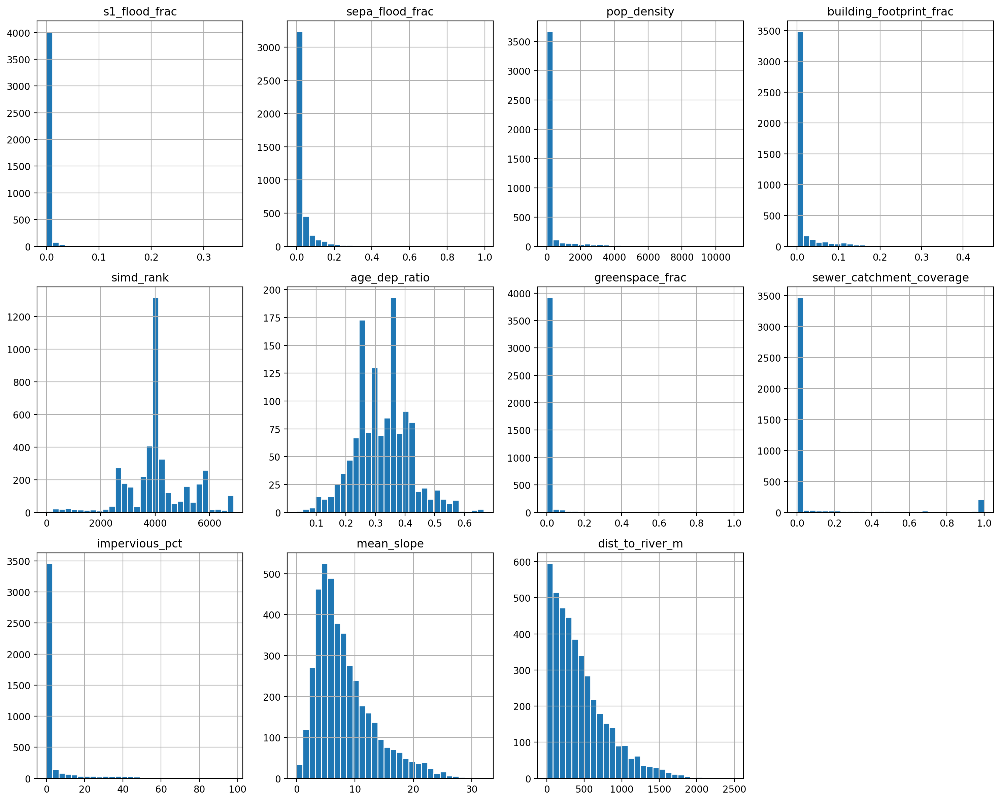

In [114]:
HEX_PATH = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg")

Y_COL    = "s1_flood_frac"
SEPA_COL = "sepa_flood_frac"

PREDICTORS_raw = [
    "pop_density",              # exposure
    "building_footprint_frac",  # exposure
    "simd_rank",                # sensitivity
    "age_dep_ratio",            # sensitivity (dependent-population share, 0-1)
    "greenspace_frac",          # adaptive capacity
    "sewer_catchment_coverage", # adaptive capacity (catchment coverage, 0-1)
    "impervious_pct",           # hazard control
    "mean_slope",               # hazard control
    "dist_to_river_m",          # hazard control
]

# Load the data 
df = gpd.read_file(HEX_PATH)


all_input_vars = [Y_COL, SEPA_COL] + PREDICTORS_raw
cols = all_input_vars

n_cols = len(cols)
n_rows = (n_cols + 3) // 4

df[cols].hist(figsize=(15, 4 * n_rows), layout=(n_rows, 4), bins=30, edgecolor="white")
plt.tight_layout()
plt.show()

In [115]:
import numpy as np

n_inf = np.isinf(df["pop_density"]).sum()
print(f"{n_inf} infinite values")

0 infinite values


In [116]:
print((df["pop_density"] == 0).sum(), "zeros")

2903 zeros


populated hexes: 1,298  (dropped 2,903 zeros)
pop_density — Raw skew:  2.272
pop_density — Log skew:  -0.276
pop_density — Sqrt skew: 1.077


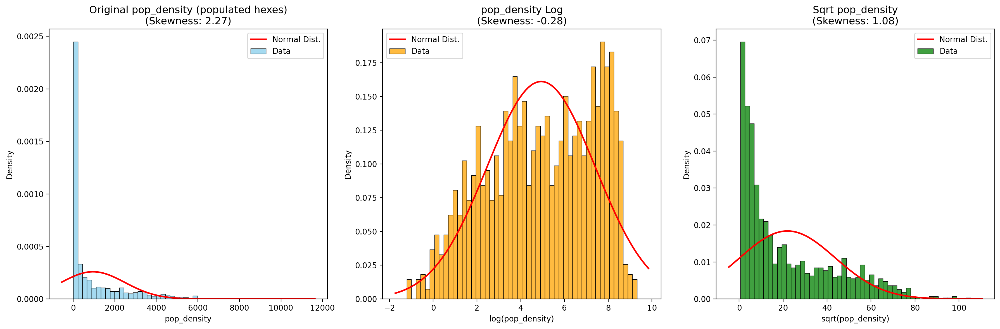

In [119]:
from scipy.stats import norm

# Transform check on the POPULATED hexes only (zero-pop hexes excluded).
col = 'pop_density'
pos = df.loc[df[col] > 0, col].dropna()      # 2,901 zero hexes removed

raw          = pos
log_version  = np.log(pos)                   # safe: no zeros -> no -inf
sqrt_version = np.sqrt(pos)

print(f"populated hexes: {len(pos):,}  (dropped {(df[col] == 0).sum():,} zeros)")
print(f"{col} — Raw skew:  {raw.skew():.3f}")
print(f"{col} — Log skew:  {log_version.skew():.3f}")
print(f"{col} — Sqrt skew: {sqrt_version.skew():.3f}")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.histplot(raw, bins=50, kde=False, color="skyblue", stat="density", ax=axes[0], label="Data")
mu, std = norm.fit(raw)
xmin, xmax = axes[0].get_xlim()
x = np.linspace(xmin, xmax, 100)
axes[0].plot(x, norm.pdf(x, mu, std), "r", linewidth=2, label="Normal Dist.")
axes[0].set_title(f"Original pop_density (populated hexes)\n(Skewness: {raw.skew():.2f})", fontsize=13)
axes[0].set_xlabel(col)
axes[0].legend()

sns.histplot(log_version, bins=50, kde=False, color="orange", stat="density", ax=axes[1], label="Data")
mu_l, std_l = norm.fit(log_version)
xmin, xmax = axes[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
axes[1].plot(x, norm.pdf(x, mu_l, std_l), "r", linewidth=2, label="Normal Dist.")
axes[1].set_title(f"pop_density Log\n(Skewness: {log_version.skew():.2f})", fontsize=13)
axes[1].set_xlabel(f"log({col})")
axes[1].legend()

sns.histplot(sqrt_version, bins=50, kde=False, color="green", stat="density", ax=axes[2], label="Data")
mu_s, std_s = norm.fit(sqrt_version)
xmin, xmax = axes[2].get_xlim()
x = np.linspace(xmin, xmax, 100)
axes[2].plot(x, norm.pdf(x, mu_s, std_s), "r", linewidth=2, label="Normal Dist.")
axes[2].set_title(f"Sqrt pop_density\n(Skewness: {sqrt_version.skew():.2f})", fontsize=13)
axes[2].set_xlabel(f"sqrt({col})")
axes[2].legend()

plt.tight_layout()
plt.show()

non-zero hexes: 1,293  (dropped 2,907 zeros)
impervious_pct — Raw skew:  1.562
impervious_pct — Log skew:  -0.879
impervious_pct — Sqrt skew: 0.708


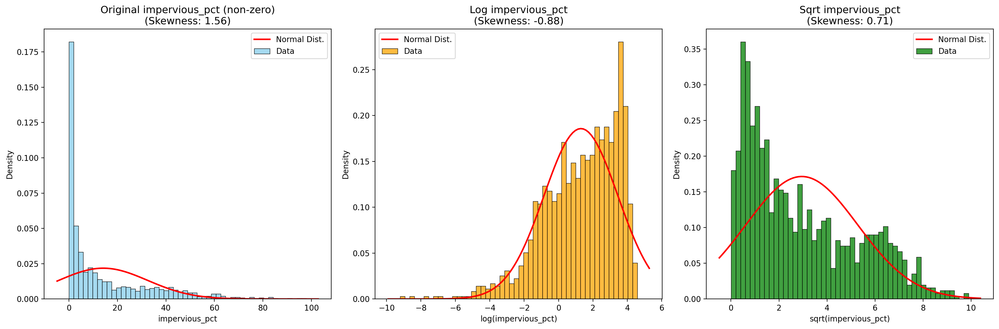

In [120]:
from scipy.stats import norm

col = 'impervious_pct'
pos = df.loc[df[col] > 0, col].dropna()      # unbuilt (0%) hexes excluded

raw          = pos
log_version  = np.log(pos)                   # safe: no zeros in pos
sqrt_version = np.sqrt(pos)

print(f"non-zero hexes: {len(pos):,}  (dropped {(df[col] == 0).sum():,} zeros)")
print(f"{col} — Raw skew:  {raw.skew():.3f}")
print(f"{col} — Log skew:  {log_version.skew():.3f}")
print(f"{col} — Sqrt skew: {sqrt_version.skew():.3f}")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.histplot(raw, bins=50, kde=False, color="skyblue", stat="density", ax=axes[0], label="Data")
mu, std = norm.fit(raw)
xmin, xmax = axes[0].get_xlim()
x = np.linspace(xmin, xmax, 100)
axes[0].plot(x, norm.pdf(x, mu, std), "r", linewidth=2, label="Normal Dist.")
axes[0].set_title(f"Original impervious_pct (non-zero)\n(Skewness: {raw.skew():.2f})", fontsize=13)
axes[0].set_xlabel(col)
axes[0].legend()

sns.histplot(log_version, bins=50, kde=False, color="orange", stat="density", ax=axes[1], label="Data")
mu_l, std_l = norm.fit(log_version)
xmin, xmax = axes[1].get_xlim()
x = np.linspace(xmin, xmax, 100)
axes[1].plot(x, norm.pdf(x, mu_l, std_l), "r", linewidth=2, label="Normal Dist.")
axes[1].set_title(f"Log impervious_pct\n(Skewness: {log_version.skew():.2f})", fontsize=13)
axes[1].set_xlabel(f"log({col})")
axes[1].legend()

sns.histplot(sqrt_version, bins=50, kde=False, color="green", stat="density", ax=axes[2], label="Data")
mu_s, std_s = norm.fit(sqrt_version)
xmin, xmax = axes[2].get_xlim()
x = np.linspace(xmin, xmax, 100)
axes[2].plot(x, norm.pdf(x, mu_s, std_s), "r", linewidth=2, label="Normal Dist.")
axes[2].set_title(f"Sqrt impervious_pct\n(Skewness: {sqrt_version.skew():.2f})", fontsize=13)
axes[2].set_xlabel(f"sqrt({col})")
axes[2].legend()

plt.tight_layout()
plt.show()

In [122]:
import numpy as np
import geopandas as gpd
from scipy import stats
from pathlib import Path

DIR = Path("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation")

for name, fname, col in [
    ("s1",   "hex_h3_res9_with_s1.gpkg",            "s1_flood_frac"),
    ("sepa", "hex_h3_res9_with_sepa_eligible.gpkg", "sepa_flood_frac"),
]:
    v = gpd.read_file(DIR / fname)[col]
    nz = v[v > 0].dropna()
    print(f"{name}: non-zero n={len(nz):,}  raw skew {stats.skew(nz):+.2f}  "
          f"log skew {stats.skew(np.log(nz)):+.2f}")

s1: non-zero n=627  raw skew +6.07  log skew -0.81
sepa: non-zero n=3,313  raw skew +4.99  log skew -0.72


# Full transform decision table for every model variable.

In [124]:
import numpy as np
import geopandas as gpd
from scipy import stats

HEX_PATH = "/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg"

# (column, kind) - kind steers the recommendation rule.
#   'response'  : assess non-zero subset, log is the intended transform
#   'rank'      : never transform
#   'predictor' : normal log-vs-sqrt logic
VARIABLES = [
    ("s1_flood_frac",            "response"),
    ("sepa_flood_frac",          "response"),
    ("pop_density",              "predictor"),
    ("building_footprint_frac",  "predictor"),
    ("simd_rank",                "rank"),
    ("age_dep_ratio",            "predictor"),
    ("greenspace_frac",          "predictor"),
    ("sewer_catchment_coverage", "predictor"),
    ("impervious_pct",           "predictor"),
    ("mean_slope",               "predictor"),
    ("dist_to_river_m",          "predictor"),
]

ZERO_INFLATED_PCT = 40.0     # above this, a transform cannot fix the shape
NEAR_SYMMETRIC = 0.5         # |raw skew| below this -> leave raw

gdf = gpd.read_file(HEX_PATH)


def skew_safe(a):
    a = a[np.isfinite(a)]
    return stats.skew(a) if len(a) > 2 else np.nan


def assess(col, kind):
    if col not in gdf.columns:
        return None
    v = gdf[col].dropna().values
    zero_pct = 100 * (v == 0).mean()
    nz = v[v > 0]

    raw_sk = skew_safe(v)

    # log: on non-zero (log undefined at 0)
    log_sk = skew_safe(np.log(nz)) if len(nz) > 2 else np.nan
    # sqrt: needs non-negative
    sqrt_sk = skew_safe(np.sqrt(v)) if (v >= 0).all() else np.nan

    # Decide
    if kind == "rank":
        chosen, note = "raw", "rank scale; never transform"
    elif kind == "response":
        # intensity model uses log on non-zero cells
        chosen, note = "log (non-zero cells)", \
            f"{zero_pct:.0f}% zero; drop zeros then log the {len(nz):,} non-zero"
    elif zero_pct > ZERO_INFLATED_PCT:
        chosen, note = "raw - FLAG", \
            f"zero-inflated ({zero_pct:.0f}%); transform only moves the spike"
    elif abs(raw_sk) < NEAR_SYMMETRIC:
        chosen, note = "raw", "already near-symmetric"
    else:
        cands = {"log": log_sk, "sqrt": sqrt_sk}
        cands = {k: val for k, val in cands.items() if np.isfinite(val)}
        if not cands:
            chosen, note = "raw", "no valid transform (check data)"
        else:
            best = min(cands, key=lambda k: abs(cands[k]))
            # guard against over-correction into the opposite skew
            if abs(cands[best]) < abs(raw_sk):
                chosen = best
                note = (f"{best} nearest 0" +
                        ("; log over-corrects" if best == "sqrt" and
                         np.isfinite(log_sk) and log_sk < -0.5 else ""))
            else:
                chosen, note = "raw", "transforms do not improve skew"

    return dict(col=col, zero_pct=zero_pct, raw=raw_sk, log=log_sk,
                sqrt=sqrt_sk, chosen=chosen, note=note)


rows = [assess(c, k) for c, k in VARIABLES]
rows = [r for r in rows if r is not None]

# Console table
print(f"{'variable':<26}{'zero%':>7}{'raw':>8}{'log':>8}{'sqrt':>8}   chosen")
print("-" * 78)
for r in rows:
    def f(x): return f"{x:>8.2f}" if np.isfinite(x) else f"{'--':>8}"
    print(f"{r['col']:<26}{r['zero_pct']:>6.1f}%{f(r['raw'])}{f(r['log'])}"
          f"{f(r['sqrt'])}   {r['chosen']}")

# Markdown table, paste-ready
print("\n\n--- markdown ---\n")
print("| Variable | Zero % | Raw skew | Log skew | Sqrt skew | Chosen | Note |")
print("|---|---|---|---|---|---|---|")
for r in rows:
    def m(x): return f"{x:+.2f}" if np.isfinite(x) else "—"
    print(f"| `{r['col']}` | {r['zero_pct']:.0f}% | {m(r['raw'])} | {m(r['log'])} "
          f"| {m(r['sqrt'])} | **{r['chosen']}** | {r['note']} |")

variable                    zero%     raw     log    sqrt   chosen
------------------------------------------------------------------------------
s1_flood_frac               85.1%   14.52   -0.81    4.85   log (non-zero cells)
sepa_flood_frac             21.1%    5.50   -0.72    1.91   log (non-zero cells)
pop_density                 69.1%    4.57   -0.28    2.78   raw - FLAG
building_footprint_frac     69.1%    4.00   -0.41    2.22   raw - FLAG
simd_rank                    0.0%   -0.11   -5.31   -1.30   raw
age_dep_ratio                0.0%    0.20   -1.17   -0.39   raw
greenspace_frac             89.4%    7.04   -1.11    4.72   raw - FLAG
sewer_catchment_coverage    80.3%    2.57   -2.03    2.13   raw - FLAG
impervious_pct              69.2%    3.53   -0.88    2.28   raw - FLAG
mean_slope                   0.0%    1.25   -0.70    0.51   sqrt
dist_to_river_m              0.0%    1.28   -1.43    0.28   sqrt


--- markdown ---

| Variable | Zero % | Raw skew | Log skew | Sqrt skew | Cho

| Variable | Zero % | Raw skew | Log skew | Sqrt skew | Chosen | Note |
|---|---|---|---|---|---|---|
| `s1_flood_frac` | 85% | +14.52 | -0.81 | +4.85 | **log (non-zero cells)** | 85% zero; drop zeros then log the 627 non-zero |
| `sepa_flood_frac` | 21% | +5.50 | -0.73 | +1.91 | **log (non-zero cells)** | 21% zero; drop zeros then log the 3,314 non-zero |
| `pop_density` | 69% | +4.59 | -0.27 | +2.78 | **raw - FLAG** | zero-inflated (69%); transform only moves the spike |
| `building_footprint_frac` | 69% | +4.01 | -0.41 | +2.23 | **raw - FLAG** | zero-inflated (69%); transform only moves the spike |
| `simd_rank` | 0% | -0.11 | -5.31 | -1.30 | **raw** | rank scale; never transform |
| `age_dep_ratio` | 0% | +0.19 | -1.17 | -0.38 | **raw** | already near-symmetric |
| `greenspace_frac` | 89% | +7.04 | -1.09 | +4.72 | **raw - FLAG** | zero-inflated (89%); transform only moves the spike |
| `sewer_catchment_coverage` | 80% | +2.57 | -2.03 | +2.13 | **raw - FLAG** | zero-inflated (80%); transform only moves the spike |
| `impervious_pct` | 69% | +3.53 | -0.88 | +2.28 | **raw - FLAG** | zero-inflated (69%); transform only moves the spike |
| `mean_slope` | 0% | +1.25 | -0.70 | +0.51 | **sqrt** | sqrt nearest 0; log over-corrects |
| `dist_to_river_m` | 0% | +1.28 | -1.37 | +0.29 | **sqrt** | sqrt nearest 0; log over-corrects |

# Transform decision table computed on the MODELLING SAMPLE

In [ ]:
import numpy as np
import geopandas as gpd
from scipy import stats

HEX_PATH = "/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_h3_res9_joined.gpkg"
Y_COL = "s1_flood_frac"          # response defining the Step A sample

VARIABLES = [
    ("s1_flood_frac",            "response"),
    ("sepa_flood_frac",          "response"),   # carried through; assessed on its own non-zero
    ("pop_density",              "predictor"),
    ("building_footprint_frac",  "predictor"),
    ("simd_rank",                "rank"),
    ("age_dep_ratio",            "predictor"),
    ("greenspace_frac",          "predictor"),
    ("sewer_catchment_coverage", "predictor"),
    ("impervious_pct",           "predictor"),
    ("mean_slope",               "predictor"),
    ("dist_to_river_m",          "predictor"),
]
PREDICTORS = [c for c, k in VARIABLES if k in ("predictor", "rank")]

ZERO_INFLATED_PCT = 40.0
NEAR_SYMMETRIC = 0.5

gdf = gpd.read_file(HEX_PATH)
print(f"Rows in file:            {len(gdf):,}")

# Drop Y == 0 (Step A intensity sample) 
n0 = len(gdf)
gdf = gdf[gdf[Y_COL] > 0].copy()
print(f"After dropping Y == 0:   {len(gdf):,}  (removed {n0 - len(gdf):,})")

# Drop rows with NaN in Y or any predictor (listwise) 
need = [Y_COL] + [c for c in PREDICTORS if c in gdf.columns]
n1 = len(gdf)
gdf = gdf.dropna(subset=need).copy()
print(f"After listwise NaN drop: {len(gdf):,}  (removed {n1 - len(gdf):,})")
print(f"=> transform decisions computed on this {len(gdf):,}-hex sample\n")


def skew_safe(a):
    a = a[np.isfinite(a)]
    return stats.skew(a) if len(a) > 2 else np.nan


def assess(col, kind):
    if col not in gdf.columns:
        return None
    v = gdf[col].dropna().values
    zero_pct = 100 * (v == 0).mean()
    nz = v[v > 0]

    raw_sk = skew_safe(v)
    log_sk = skew_safe(np.log(nz)) if len(nz) > 2 else np.nan
    sqrt_sk = skew_safe(np.sqrt(v)) if (v >= 0).all() else np.nan

    if kind == "rank":
        chosen, note = "raw", "rank scale; never transform"
    elif kind == "response":
        chosen, note = "log", \
            (f"{zero_pct:.0f}% zero in-sample; log applied to non-zero cells")
    elif zero_pct > ZERO_INFLATED_PCT:
        chosen, note = "raw - FLAG", \
            f"zero-inflated ({zero_pct:.0f}%); transform only moves the spike"
    elif abs(raw_sk) < NEAR_SYMMETRIC:
        chosen, note = "raw", "already near-symmetric"
    else:
        cands = {k: val for k, val in {"log": log_sk, "sqrt": sqrt_sk}.items()
                 if np.isfinite(val)}
        if not cands:
            chosen, note = "raw", "no valid transform (check data)"
        else:
            best = min(cands, key=lambda k: abs(cands[k]))
            chosen = best if abs(cands[best]) < abs(raw_sk) else "raw"
            note = (f"{best} nearest 0" if chosen != "raw"
                    else "transforms do not improve skew")

    return dict(col=col, n=len(v), zero_pct=zero_pct, raw=raw_sk,
                log=log_sk, sqrt=sqrt_sk, chosen=chosen, note=note)


rows = [r for r in (assess(c, k) for c, k in VARIABLES) if r is not None]

print(f"{'variable':<26}{'zero%':>7}{'raw':>8}{'log':>8}{'sqrt':>8}   chosen")
print("-" * 78)
for r in rows:
    def f(x): return f"{x:>8.2f}" if np.isfinite(x) else f"{'--':>8}"
    print(f"{r['col']:<26}{r['zero_pct']:>6.1f}%{f(r['raw'])}{f(r['log'])}"
          f"{f(r['sqrt'])}   {r['chosen']}")

print("\n\n--- markdown (paste-ready) ---\n")
print("| Variable | Zero % | Raw skew | Log skew | Sqrt skew | Chosen | Note |")
print("|---|---|---|---|---|---|---|")
for r in rows:
    def m(x): return f"{x:+.2f}" if np.isfinite(x) else "—"
    print(f"| `{r['col']}` | {r['zero_pct']:.0f}% | {m(r['raw'])} | {m(r['log'])} "
          f"| {m(r['sqrt'])} | **{r['chosen']}** | {r['note']} |")

Rows in file:            4,201
After dropping Y == 0:   627  (removed 3,574)
After listwise NaN drop: 471  (removed 156)
=> transform decisions computed on this 471-hex sample

variable                    zero%     raw     log    sqrt   chosen
------------------------------------------------------------------------------
s1_flood_frac                0.0%    5.44   -1.20    1.75   log
sepa_flood_frac             10.2%    4.20   -1.39    1.83   log
pop_density                  0.0%    1.30   -1.01    0.25   sqrt
building_footprint_frac      0.0%    1.09   -1.19    0.02   sqrt
simd_rank                    0.0%   -0.29   -2.21   -0.87   raw
age_dep_ratio                0.0%    0.41   -0.84   -0.15   raw
greenspace_frac             55.8%    3.35   -1.32    1.75   raw - FLAG
sewer_catchment_coverage    22.7%   -0.26   -2.46   -0.64   raw
impervious_pct               5.3%    0.64   -1.62   -0.22   sqrt
mean_slope                   0.0%    1.28   -0.48    0.43   sqrt
dist_to_river_m           


On the s1 sample its non-zero 3,314


| Variable | Zero % | Raw skew | Log skew | Sqrt skew | Chosen | Note |
|---|---|---|---|---|---|---|
| `s1_flood_frac` | 0% | +5.44 | -1.20 | +1.75 | **log** | 0% zero in-sample; log applied to non-zero cells |
| `sepa_flood_frac` | 10% | +4.21 | -1.39 | +1.83 | **log** | 10% zero in-sample; log applied to non-zero cells |
| `pop_density` | 0% | +1.32 | -1.01 | +0.25 | **sqrt** | sqrt nearest 0 |
| `building_footprint_frac` | 0% | +1.11 | -1.19 | +0.03 | **sqrt** | sqrt nearest 0 |
| `simd_rank` | 0% | -0.29 | -2.21 | -0.87 | **raw** | rank scale; never transform |
| `age_dep_ratio` | 0% | +0.40 | -0.83 | -0.15 | **raw** | already near-symmetric |
| `greenspace_frac` | 56% | +3.35 | -0.86 | +1.75 | **raw - FLAG** | zero-inflated (56%); transform only moves the spike |
| `sewer_catchment_coverage` | 23% | -0.26 | -2.46 | -0.64 | **raw** | already near-symmetric |
| `impervious_pct` | 5% | +0.64 | -1.62 | -0.22 | **sqrt** | sqrt nearest 0 |
| `mean_slope` | 0% | +1.28 | -0.48 | +0.43 | **sqrt** | sqrt nearest 0 |
| `dist_to_river_m` | 0% | +1.46 | -1.37 | +0.45 | **sqrt** | sqrt nearest 0 |

On the whole sample 4,201

| Variable | Zero % | Raw skew | Log skew | Sqrt skew | Chosen | Note |
|---|---|---|---|---|---|---|
| `s1_flood_frac` | 85% | +14.52 | -0.81 | +4.85 | **log (non-zero cells)** | 85% zero; drop zeros then log the 627 non-zero |
| `sepa_flood_frac` | 21% | +5.50 | -0.73 | +1.91 | **log (non-zero cells)** | 21% zero; drop zeros then log the 3,314 non-zero |
| `pop_density` | 69% | +4.59 | -0.27 | +2.78 | **raw - FLAG** | zero-inflated (69%); transform only moves the spike |
| `building_footprint_frac` | 69% | +4.01 | -0.41 | +2.23 | **raw - FLAG** | zero-inflated (69%); transform only moves the spike |
| `simd_rank` | 0% | -0.11 | -5.31 | -1.30 | **raw** | rank scale; never transform |
| `age_dep_ratio` | 0% | +0.19 | -1.17 | -0.38 | **raw** | already near-symmetric |
| `greenspace_frac` | 89% | +7.04 | -1.09 | +4.72 | **raw - FLAG** | zero-inflated (89%); transform only moves the spike |
| `sewer_catchment_coverage` | 80% | +2.57 | -2.03 | +2.13 | **raw - FLAG** | zero-inflated (80%); transform only moves the spike |
| `impervious_pct` | 69% | +3.53 | -0.88 | +2.28 | **raw - FLAG** | zero-inflated (69%); transform only moves the spike |
| `mean_slope` | 0% | +1.25 | -0.70 | +0.51 | **sqrt** | sqrt nearest 0; log over-corrects |
| `dist_to_river_m` | 0% | +1.28 | -1.37 | +0.29 | **sqrt** | sqrt nearest 0; log over-corrects |

In [127]:
print([c for c in df.columns if 's1' in c.lower() or 'sepa' in c.lower()])
print([c for c in df.columns if 'building' in c.lower() or 'footprint' in c.lower()])
print("PREDICTORS_FINAL:", PREDICTORS_FINAL)

['s1_flood_frac', 'sepa_flood_frac']
['building_footprint_frac']
PREDICTORS_FINAL: ['sqrt_pop_density', 'simd_rank', 'age_dep_ratio', 'greenspace_frac', 'sewer_catchment_coverage', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m']


In [128]:
print([c for c in gdf.columns if 's1' in c.lower() or 'sepa' in c.lower()])
print([c for c in gdf.columns if 'building' in c.lower() or 'footprint' in c.lower()])
print("PREDICTORS_FINAL:", PREDICTORS_FINAL)

['s1_flood_frac', 'sepa_flood_frac']
['building_footprint_frac']
PREDICTORS_FINAL: ['sqrt_pop_density', 'simd_rank', 'age_dep_ratio', 'greenspace_frac', 'sewer_catchment_coverage', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m']


In [131]:
import numpy as np
import geopandas as gpd

# Loads the joined grid (has s1_flood_frac, sepa_flood_frac and the sqrt_* predictors).
df = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_clean_s1.gpkg")

# Builds the log responses (log positive flood hexes only; zeros -> NaN -> dropped by .dropna()).
df['log_s1_flood_frac']   = np.log(df['s1_flood_frac'].where(df['s1_flood_frac']   > 0))
df['log_sepa_flood_frac'] = np.log(df['sepa_flood_frac'].where(df['sepa_flood_frac'] > 0))

# Uses the ACTUAL predictor column names in the file (all sqrt_*, not raw building_footprint_frac).
PREDICTORS_FINAL = [
    'sqrt_pop_density',
    'sqrt_building_footprint_frac',
    'simd_rank',
    'age_dep_ratio',
    'greenspace_frac',
    'sewer_catchment_coverage',
    'sqrt_impervious_pct',
    'sqrt_mean_slope',
    'sqrt_dist_to_river_m',
]

target_s1   = 'log_s1_flood_frac'
target_sepa = 'log_sepa_flood_frac'

model_df_s1   = df[[target_s1]   + PREDICTORS_FINAL].dropna()
model_df_sepa = df[[target_sepa] + PREDICTORS_FINAL].dropna()
print(f"S1 sample:   {len(model_df_s1):,}")
print(f"SEPA sample: {len(model_df_sepa):,}")

S1 sample:   614
SEPA sample: 537


In [132]:
print([c for c in df.columns if any(k in c.lower() for k in
      ['pop', 'building', 'footprint', 'impervious', 'slope', 'river'])])

['mean_slope', 'impervious_pct', 'pop_density', 'building_footprint_frac', 'dist_to_river_m', 'sqrt_pop_density', 'sqrt_building_footprint_frac', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m', 'no_population', 'sqrt_pop_density_z', 'sqrt_impervious_pct_z', 'sqrt_mean_slope_z', 'sqrt_dist_to_river_m_z']


I standardised so all predictors are on a common scale (standard deviations instead of raw units like metres, %, or people/km²), which makes coefficients comparable in importance and lets GWR/mGWR compute its distance weights and bandwidths sensibly. Because standardisation is done within each response's own sample, I compare the S1 and SEPA coefficients by sign and spatial pattern rather than raw magnitude.

In [135]:
import geopandas as gpd

# S1
df_s1 = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_clean_s1.gpkg")
Z_COLS = [c for c in df_s1.columns if c.endswith('_z')]   # the VIF-survivors, standardised
model_df_s1 = df_s1[['log_s1_flood_frac'] + Z_COLS].dropna()
print(f"S1 sample:   {len(model_df_s1):,}  predictors: {len(Z_COLS)}")

# SEPA — after re-running the script with RESPONSE = "sepa"
df_sepa = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_clean_sepa.gpkg")
Z_COLS_sepa = [c for c in df_sepa.columns if c.endswith('_z')]
model_df_sepa = df_sepa[['log_sepa_flood_frac'] + Z_COLS_sepa].dropna()
print(f"SEPA sample: {len(model_df_sepa):,}  predictors: {len(Z_COLS_sepa)}")

S1 sample:   614  predictors: 8
SEPA sample: 3,276  predictors: 8


In [137]:
df = gpd.read_file("/Users/xrysa/Desktop/MSc_in_Urban_Analytics/Dissertation/hex_clean_stepA.gpkg")
print([c for c in df.columns if c != "geometry"])   # confirm sqrt_ + log_ present

PREDICTORS_FINAL = [
    "sqrt_pop_density",
    "building_footprint_frac",
    "simd_rank",
    "age_dep_ratio",
    "greenspace_frac",
    "sewer_catchment_coverage",
    "sqrt_impervious_pct",
    "sqrt_mean_slope",
    "sqrt_dist_to_river_m",
]

PREDICTORS_FINAL = [c for c in PREDICTORS_FINAL
                    if c in df.columns and c not in (target_s1, target_sepa)]
print(f"{len(PREDICTORS_FINAL)} predictors: {PREDICTORS_FINAL}")

df = df[df["s1_flood_frac"] > 0].copy()          # drop zeros: log undefined at 0
df["log_s1_flood_frac"] = np.log(df["s1_flood_frac"])
df["log_sepa_flood_frac"] = np.log(df["sepa_flood_frac"].where(df["sepa_flood_frac"] > 0))

['h3_id', 's1_flood_frac', 'sepa_flood_frac', 'sqrt_pop_density', 'sqrt_building_footprint_frac', 'simd_rank', 'age_dep_ratio', 'greenspace_frac', 'sewer_catchment_coverage', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m', 'sqrt_pop_density_z', 'sqrt_building_footprint_frac_z', 'simd_rank_z', 'age_dep_ratio_z', 'greenspace_frac_z', 'sewer_catchment_coverage_z', 'sqrt_impervious_pct_z', 'sqrt_mean_slope_z', 'sqrt_dist_to_river_m_z']
8 predictors: ['sqrt_pop_density', 'simd_rank', 'age_dep_ratio', 'greenspace_frac', 'sewer_catchment_coverage', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m']


In [138]:
print("in list, in df:", [c for c in PREDICTORS_FINAL if c in df.columns])
print("in list, NOT in df:", [c for c in PREDICTORS_FINAL if c not in df.columns])
print("sqrt cols present:", [c for c in df.columns if c.startswith("sqrt_")])

in list, in df: ['sqrt_pop_density', 'simd_rank', 'age_dep_ratio', 'greenspace_frac', 'sewer_catchment_coverage', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m']
in list, NOT in df: []
sqrt cols present: ['sqrt_pop_density', 'sqrt_building_footprint_frac', 'sqrt_impervious_pct', 'sqrt_mean_slope', 'sqrt_dist_to_river_m', 'sqrt_pop_density_z', 'sqrt_building_footprint_frac_z', 'sqrt_impervious_pct_z', 'sqrt_mean_slope_z', 'sqrt_dist_to_river_m_z']


# Multicollinearity

In [139]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_vif = sm.add_constant(model_df_s1)

# Calculate VIF
vif_data = pd.DataFrame({
    'variable': X_vif.columns,
    'VIF': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
})

print("Variance Inflation Factor (VIF) Check:")
print("-" * 40)
print(vif_data.sort_values('VIF', ascending=False))
print("-" * 40)
print("Note: VIF > 10 indicates high multicollinearity that may distort spatial coefficients.")

Variance Inflation Factor (VIF) Check:
----------------------------------------
                     variable        VIF
0                       const  14.449809
6  sewer_catchment_coverage_z   6.081679
2          sqrt_pop_density_z   5.636134
7       sqrt_impervious_pct_z   5.604731
3                 simd_rank_z   1.248615
1           log_s1_flood_frac   1.196242
4             age_dep_ratio_z   1.130038
8           sqrt_mean_slope_z   1.092998
9      sqrt_dist_to_river_m_z   1.082085
5           greenspace_frac_z   1.022853
----------------------------------------
Note: VIF > 10 indicates high multicollinearity that may distort spatial coefficients.


In [140]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X_vif = sm.add_constant(model_df_sepa)

# Calculate VIF
vif_data = pd.DataFrame({
    'variable': X_vif.columns,
    'VIF': [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
})

print("Variance Inflation Factor (VIF) Check:")
print("-" * 40)
print(vif_data.sort_values('VIF', ascending=False))
print("-" * 40)
print("Note: VIF > 10 indicates high multicollinearity that may distort spatial coefficients.")

Variance Inflation Factor (VIF) Check:
----------------------------------------
                     variable       VIF
0                       const  8.692405
2          sqrt_pop_density_z  7.029715
7       sqrt_impervious_pct_z  6.977963
6  sewer_catchment_coverage_z  6.561137
1         log_sepa_flood_frac  1.201809
9      sqrt_dist_to_river_m_z  1.188083
3                 simd_rank_z  1.100307
8           sqrt_mean_slope_z  1.098872
4             age_dep_ratio_z  1.064226
5           greenspace_frac_z  1.044175
----------------------------------------
Note: VIF > 10 indicates high multicollinearity that may distort spatial coefficients.


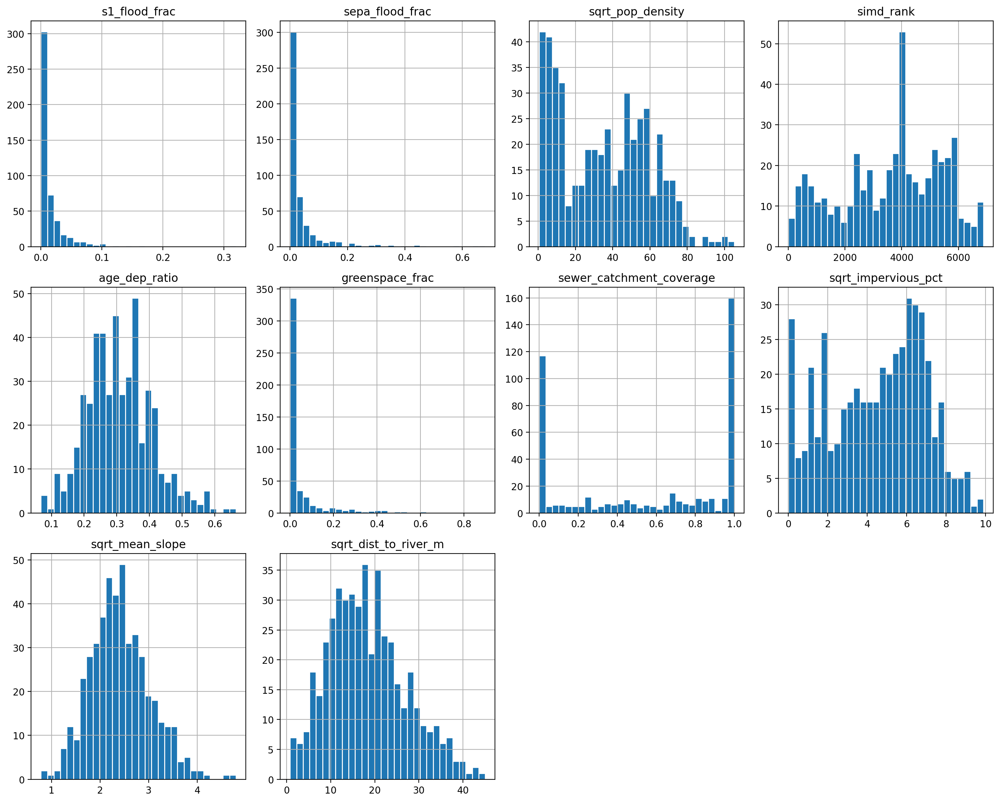

In [141]:
all_input_vars = [Y_COL, SEPA_COL] + PREDICTORS_FINAL
cols = all_input_vars

n_cols = len(cols)
n_rows = (n_cols + 3) // 4

df[cols].hist(figsize=(15, 4 * n_rows), layout=(n_rows, 4), bins=30, edgecolor="white")
plt.tight_layout()
plt.show()